# DeepLabCut Toolbox
https://github.com/AlexEMG/DeepLabCut

Nath\*, Mathis\* et al. Using DeepLabCut for 3D markerless pose estimation during behavior across species.

pre-print: https://www.biorxiv.org/content/10.1101/476531v1

This notebook demonstrates the necessary steps to use DeepLabCut for your own project.
This shows the most simple code to do so, but many of the functions have additional features, so please check out the overview & the protocol paper!

This notebook illustrates how to:
- create a project
- extract training frames
- label the frames
- plot the labeled images
- create a training set
- train a network
- evaluate a network
- analyze a novel video
- create an automatically labeled video 
- plot the trajectories

In [2]:
# Some librarires and specs that we need to let deeplabcut work 
# CUDA : version 10.0
# cudnn : version 7.5 
# Update nvidia game drivers 
# install tensorflow-gpu (if you have a GPU)
import numpy as np 
import matplotlib
import deeplabcut
import tensorflow as tf
import os 
%matplotlib inline

In [3]:
tf.__version__

'1.14.0'

In [2]:
# Checking if GPUs are available
tf.test.is_gpu_available() 

True

In [3]:
#Checking listed devices
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 7320753256466943033
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 7626849280
locality {
  bus_id: 1
  links {
  }
}
incarnation: 15067333686734106747
physical_device_desc: "device: 0, name: GeForce GTX 1080, pci bus id: 0000:01:00.0, compute capability: 6.1"
, name: "/device:GPU:1"
device_type: "GPU"
memory_limit: 2032545792
locality {
  bus_id: 1
  links {
  }
}
incarnation: 13246344960687016984
physical_device_desc: "device: 1, name: GeForce GTX 780, pci bus id: 0000:02:00.0, compute capability: 3.5"
]


## Create a new project

It is always good idea to keep the projects seperate. This function creates a new project with subdirectories and a basic configuration file in the user defined directory otherwise the project is created in the current working directory.

You can always add new videos to the project at any stage of the project. 

In [4]:
task='Navigation' # Enter the name of your experiment Task
experimenter='Simone' # Enter the name of the experimenter
video=[r'C:/Users/jamesjun/Desktop/Simone/DeepLabCut-master/examples/videos/20190718145130211-masked.avi',r'C:/Users/jamesjun/Desktop/Simone/DeepLabCut-master/examples/videos/20190711181205039-masked.avi', r'C:/Users/jamesjun/Desktop/Simone/DeepLabCut-master/examples/videos/20190717181304149-masked.avi' ] # Enter the paths of your videos you want to grab frames from.

path_config_file=deeplabcut.create_new_project(task,experimenter,video, working_directory=r'C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\WorkingDir',copy_videos=True) 
#change the working directory to where you want the project created.

# The function returns the path, where your project is. 
# You could also enter this manually (e.g. if the project is already created and you want to pick up, where you stopped...)
# path_config_file = '/home/Mackenzie/Reaching/config.yaml' # Enter the path of the config file that was just created from the above step (check the folder)

Created "C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\WorkingDir\Navigation-Simone-2019-07-23\videos"
Created "C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\WorkingDir\Navigation-Simone-2019-07-23\labeled-data"
Created "C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\WorkingDir\Navigation-Simone-2019-07-23\training-datasets"
Created "C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\WorkingDir\Navigation-Simone-2019-07-23\dlc-models"
Copying the videos
C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\WorkingDir\Navigation-Simone-2019-07-23\videos\20190718145130211-masked.avi
C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\WorkingDir\Navigation-Simone-2019-07-23\videos\20190711181205039-masked.avi
C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\WorkingDir\Navigation-Simone-2019-07-23\videos\20190717181304149-masked.avi
Generated "C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\WorkingDir\Navigation-Simone-2019-07-23\config.yaml"

A new project with name Navigat

In [5]:
path_config_file = r'C:/Users/jamesjun/Desktop/Simone/DeepLabCut-master/WorkingDir/Navigation-Simone-2019-07-23/config.yaml'

## Extract frames from videos 
A key point for a successful feature detector is to select diverse frames, which are typical for the behavior you study that should be labeled.

This function selects N frames either uniformly sampled from a particular video (or folder) ('uniform'). Note: this might not yield diverse frames, if the behavior is sparsely distributed (consider using kmeans), and/or select frames manually etc.

Also make sure to get select data from different (behavioral) sessions and different animals if those vary substantially (to train an invariant feature detector).

Individual images should not be too big (i.e. < 850 x 850 pixel). Although this can be taken care of later as well, it is advisable to crop the frames, to remove unnecessary parts of the frame as much as possible.

Always check the output of cropping. If you are happy with the results proceed to labeling.

In [6]:
#there are other ways to grab frames, such as uniformly; please see the paper:

#AUTOMATIC:
deeplabcut.extract_frames(path_config_file) 


Config file read successfully.
Do you want to extract (perhaps additional) frames for video: C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\WorkingDir\Navigation-Simone-2019-07-23\videos\20190718145130211-masked.avi ?
yes/noyes
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 118.23  seconds.
Extracting and downsampling... 3547  frames from the video.


3547it [00:18, 191.80it/s]


Kmeans clustering ... (this might take a while)
Do you want to extract (perhaps additional) frames for video: C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\WorkingDir\Navigation-Simone-2019-07-23\videos\20190711181205039-masked.avi ?
yes/noyes
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 100.33  seconds.
Extracting and downsampling... 3010  frames from the video.


3010it [00:15, 198.11it/s]


Kmeans clustering ... (this might take a while)
Do you want to extract (perhaps additional) frames for video: C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\WorkingDir\Navigation-Simone-2019-07-23\videos\20190717181304149-masked.avi ?
yes/noyes
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 28.73  seconds.
Extracting and downsampling... 862  frames from the video.


862it [00:04, 196.52it/s]


Kmeans clustering ... (this might take a while)
Frame 861  not found!

Frames were selected.
You can now label the frames using the function 'label_frames' (if you extracted enough frames for all videos).


## Label the extracted frames

Only videos in the config file can be used to extract the frames. Extracted labels for each video are stored in the project directory under the subdirectory **'labeled-data'**. Each subdirectory is named after the name of the video. The toolbox has a labeling toolbox which could be used for labeling. 

In [ ]:
%gui wx
deeplabcut.label_frames(path_config_file)

ERROR! Session/line number was not unique in database. History logging moved to new session 345


## Check the labels

[OPTIONAL] Checking if the labels were created and stored correctly is beneficial for training, since labeling is one of the most critical parts for creating the training dataset. The DeepLabCut toolbox provides a function `check\_labels'  to do so. It is used as follows:

In [8]:
deeplabcut.check_labels(path_config_file) #this creates a subdirectory with the frames + your labels

Creating images with labels by Simone.
ERROR! Session/line number was not unique in database. History logging moved to new session 346
They are stored in the following folder: C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\WorkingDir\Navigation-Simone-2019-07-23\labeled-data\20190718145130211-masked_labeled.
They are stored in the following folder: C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\WorkingDir\Navigation-Simone-2019-07-23\labeled-data\20190711181205039-masked_labeled.
They are stored in the following folder: C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\WorkingDir\Navigation-Simone-2019-07-23\labeled-data\20190717181304149-masked_labeled.
If all the labels are ok, then use the function 'create_training_dataset' to create the training dataset!


If the labels need adjusted, you can use relauch the labeling GUI to move them around, save, and re-plot!

## Create a training dataset

This function generates the training data information for network training based on the pandas dataframes that hold label information. The user can set the fraction of the training set size (from all labeled image in the hd5 file) in the config.yaml file. While creating the dataset, the user can create multiple shuffles if they want to benchmark the performance (typcailly, 1 is what you will set, so you pass nothing!). 

After running this script the training dataset is created and saved in the project directory under the subdirectory **'training-datasets'**

This function also creates new subdirectories under **dlc-models** and appends the project config.yaml file with the correct path to the training and testing pose configuration file. These files hold the parameters for training the network. Such an example file is provided with the toolbox and named as **pose_cfg.yaml**. For most all use cases we have seen, the defaults are perfectly fine.

Now it is the time to start training the network!

In [9]:
deeplabcut.create_training_dataset(path_config_file)

The training dataset is successfully created. Use the function 'train_network' to start training. Happy training!


## Start training:

This function trains the network for a specific shuffle of the training dataset. 

In [10]:
deeplabcut.train_network(path_config_file, gputouse=1)

W0723 14:29:11.513515 12112 deprecation_wrapper.py:119] From C:\Users\jamesjun\Anaconda3\envs\dlcc\lib\site-packages\deeplabcut\pose_estimation_tensorflow\training.py:69: The name tf.reset_default_graph is deprecated. Please use tf.compat.v1.reset_default_graph instead.

Config:
{'all_joints': [[0], [1], [2], [3]],
 'all_joints_names': ['bodypart1', 'bodypart2', 'bodypart3', 'bodypart4'],
 'batch_size': 1,
 'bottomheight': 400,
 'crop': True,
 'crop_pad': 0,
 'cropratio': 0.4,
 'dataset': 'training-datasets\\iteration-0\\UnaugmentedDataSet_NavigationJul23\\Navigation_Simone95shuffle1.mat',
 'dataset_type': 'default',
 'deterministic': False,
 'display_iters': 1000,
 'fg_fraction': 0.25,
 'global_scale': 0.8,
 'init_weights': 'C:\\Users\\jamesjun\\Anaconda3\\envs\\dlcc\\lib\\site-packages\\deeplabcut\\pose_estimation_tensorflow\\models\\pretrained\\resnet_v1_50.ckpt',
 'intermediate_supervision': False,
 'intermediate_supervision_layer': 12,
 'leftwidth': 400,
 'location_refinement': Tr

Starting with standard pose-dataset loader.


W0723 14:29:11.583584 12112 deprecation_wrapper.py:119] From C:\Users\jamesjun\Anaconda3\envs\dlcc\lib\site-packages\deeplabcut\pose_estimation_tensorflow\train.py:40: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0723 14:29:11.594594 12112 deprecation_wrapper.py:119] From C:\Users\jamesjun\Anaconda3\envs\dlcc\lib\site-packages\deeplabcut\pose_estimation_tensorflow\train.py:46: The name tf.FIFOQueue is deprecated. Please use tf.queue.FIFOQueue instead.

W0723 14:29:15.676582 12112 deprecation_wrapper.py:119] From C:\Users\jamesjun\Anaconda3\envs\dlcc\lib\site-packages\deeplabcut\pose_estimation_tensorflow\nnet\pose_net.py:74: The name tf.variable_scope is deprecated. Please use tf.compat.v1.variable_scope instead.

W0723 14:29:16.457345 12112 deprecation_wrapper.py:119] From C:\Users\jamesjun\Anaconda3\envs\dlcc\lib\site-packages\deeplabcut\pose_estimation_tensorflow\nnet\pose_net.py:110: The name tf.losses.sigmoid_cross_entropy is deprecated. Pl

Training parameter:
{'stride': 8.0, 'weigh_part_predictions': False, 'weigh_negatives': False, 'fg_fraction': 0.25, 'weigh_only_present_joints': False, 'mean_pixel': [123.68, 116.779, 103.939], 'shuffle': True, 'snapshot_prefix': 'C:\\Users\\jamesjun\\Desktop\\Simone\\DeepLabCut-master\\WorkingDir\\Navigation-Simone-2019-07-23\\dlc-models\\iteration-0\\NavigationJul23-trainset95shuffle1\\train\\snapshot', 'log_dir': 'log', 'global_scale': 0.8, 'location_refinement': True, 'locref_stdev': 7.2801, 'locref_loss_weight': 0.05, 'locref_huber_loss': True, 'optimizer': 'sgd', 'intermediate_supervision': False, 'intermediate_supervision_layer': 12, 'regularize': False, 'weight_decay': 0.0001, 'mirror': False, 'deterministic': False, 'crop_pad': 0, 'scoremap_dir': 'test', 'dataset_type': 'default', 'use_gt_segm': False, 'batch_size': 1, 'video': False, 'video_batch': False, 'crop': True, 'cropratio': 0.4, 'minsize': 100, 'leftwidth': 400, 'rightwidth': 400, 'topheight': 400, 'bottomheight': 400

iteration: 1000 loss: 0.0196 lr: 0.005
iteration: 2000 loss: 0.0106 lr: 0.005
iteration: 3000 loss: 0.0087 lr: 0.005
iteration: 4000 loss: 0.0073 lr: 0.005
iteration: 5000 loss: 0.0066 lr: 0.005
iteration: 6000 loss: 0.0058 lr: 0.005
iteration: 7000 loss: 0.0055 lr: 0.005
iteration: 8000 loss: 0.0050 lr: 0.005
iteration: 9000 loss: 0.0048 lr: 0.005
iteration: 10000 loss: 0.0045 lr: 0.005
iteration: 11000 loss: 0.0062 lr: 0.02
iteration: 12000 loss: 0.0052 lr: 0.02
iteration: 13000 loss: 0.0045 lr: 0.02
iteration: 14000 loss: 0.0041 lr: 0.02
iteration: 15000 loss: 0.0036 lr: 0.02
iteration: 16000 loss: 0.0037 lr: 0.02
iteration: 17000 loss: 0.0035 lr: 0.02
iteration: 18000 loss: 0.0032 lr: 0.02
iteration: 19000 loss: 0.0030 lr: 0.02
iteration: 20000 loss: 0.0031 lr: 0.02
iteration: 21000 loss: 0.0030 lr: 0.02
iteration: 22000 loss: 0.0028 lr: 0.02
iteration: 23000 loss: 0.0027 lr: 0.02
iteration: 24000 loss: 0.0026 lr: 0.02
iteration: 25000 loss: 0.0027 lr: 0.02
iteration: 26000 loss: 0

iteration: 403000 loss: 0.0009 lr: 0.02
iteration: 404000 loss: 0.0010 lr: 0.02
iteration: 405000 loss: 0.0009 lr: 0.02
iteration: 406000 loss: 0.0010 lr: 0.02
iteration: 407000 loss: 0.0009 lr: 0.02
iteration: 408000 loss: 0.0010 lr: 0.02
iteration: 409000 loss: 0.0010 lr: 0.02
iteration: 410000 loss: 0.0010 lr: 0.02
iteration: 411000 loss: 0.0010 lr: 0.02
iteration: 412000 loss: 0.0009 lr: 0.02
iteration: 413000 loss: 0.0010 lr: 0.02
iteration: 414000 loss: 0.0009 lr: 0.02
iteration: 415000 loss: 0.0009 lr: 0.02
iteration: 416000 loss: 0.0009 lr: 0.02
iteration: 417000 loss: 0.0009 lr: 0.02
iteration: 418000 loss: 0.0009 lr: 0.02
iteration: 419000 loss: 0.0010 lr: 0.02
iteration: 420000 loss: 0.0010 lr: 0.02
iteration: 421000 loss: 0.0009 lr: 0.02
iteration: 422000 loss: 0.0009 lr: 0.02
iteration: 423000 loss: 0.0009 lr: 0.02
iteration: 424000 loss: 0.0009 lr: 0.02
iteration: 425000 loss: 0.0009 lr: 0.02
iteration: 426000 loss: 0.0010 lr: 0.02
iteration: 427000 loss: 0.0009 lr: 0.02


KeyboardInterrupt: 

## Start evaluating
This funtion evaluates a trained model for a specific shuffle/shuffles at a particular state or all the states on the data set (images)
and stores the results as .csv file in a subdirectory under **evaluation-results**

In [11]:
deeplabcut.evaluate_network(path_config_file, plotting=True)

Config:
{'all_joints': [[0], [1], [2], [3]],
 'all_joints_names': ['bodypart1', 'bodypart2', 'bodypart3', 'bodypart4'],
 'batch_size': 1,
 'bottomheight': 400,
 'crop': True,
 'crop_pad': 0,
 'cropratio': 0.4,
 'dataset': 'training-datasets\\iteration-0\\UnaugmentedDataSet_NavigationJul23\\Navigation_Simone95shuffle1.mat',
 'dataset_type': 'default',
 'deterministic': False,
 'display_iters': 1000,
 'fg_fraction': 0.25,
 'global_scale': 0.8,
 'init_weights': 'C:\\Users\\jamesjun\\Anaconda3\\envs\\dlcc\\lib\\site-packages\\deeplabcut\\pose_estimation_tensorflow\\models\\pretrained\\resnet_v1_50.ckpt',
 'intermediate_supervision': False,
 'intermediate_supervision_layer': 12,
 'leftwidth': 400,
 'location_refinement': True,
 'locref_huber_loss': True,
 'locref_loss_weight': 0.05,
 'locref_stdev': 7.2801,
 'log_dir': 'log',
 'max_input_size': 1500,
 'mean_pixel': [123.68, 116.779, 103.939],
 'metadataset': 'training-datasets\\iteration-0\\UnaugmentedDataSet_NavigationJul23\\Documentation_

Running  DeepCut_resnet50_NavigationJul23shuffle1_750000  with # of trainingiterations: 750000
Analyzing data...


448it [01:31,  4.81it/s]


Done and results stored for snapshot:  snapshot-750000
Results for 750000  training iterations: 95 1 train error: 1.68 pixels. Test error: 2.77  pixels.
With pcutoff of 0.1  train error: 1.68 pixels. Test error: 2.77 pixels
Thereby, the errors are given by the average distances between the labels by DLC and the scorer.
Plotting...
The network is evaluated and the results are stored in the subdirectory 'evaluation_results'.
If it generalizes well, choose the best model for prediction and update the config file with the appropriate index for the 'snapshotindex'.
Use the function 'analyze_video' to make predictions on new videos.
Otherwise consider retraining the network (see DeepLabCut workflow Fig 2)


## Start Analyzing videos
This function analyzes the new video. The user can choose the best model from the evaluation results and specify the correct snapshot index for the variable **snapshotindex** in the **config.yaml** file. Otherwise, by default the most recent snapshot is used to analyse the video.

The results are stored in hd5 file in the same directory where the video resides. 

In [12]:
videofile_path = [r'C:/Users/jamesjun/Desktop/Simone/DeepLabCut-master/examples/videos/testVideos/20190717173554627-masked.avi'] #Enter a folder OR a list of videos to analyze.

deeplabcut.analyze_videos(path_config_file,videofile_path, videotype='.avi')

Config:
{'all_joints': [[0], [1], [2], [3]],
 'all_joints_names': ['bodypart1', 'bodypart2', 'bodypart3', 'bodypart4'],
 'batch_size': 1,
 'bottomheight': 400,
 'crop': True,
 'crop_pad': 0,
 'cropratio': 0.4,
 'dataset': 'training-datasets\\iteration-0\\UnaugmentedDataSet_NavigationJul23\\Navigation_Simone95shuffle1.mat',
 'dataset_type': 'default',
 'deterministic': False,
 'display_iters': 1000,
 'fg_fraction': 0.25,
 'global_scale': 0.8,
 'init_weights': 'C:\\Users\\jamesjun\\Anaconda3\\envs\\dlcc\\lib\\site-packages\\deeplabcut\\pose_estimation_tensorflow\\models\\pretrained\\resnet_v1_50.ckpt',
 'intermediate_supervision': False,
 'intermediate_supervision_layer': 12,
 'leftwidth': 400,
 'location_refinement': True,
 'locref_huber_loss': True,
 'locref_loss_weight': 0.05,
 'locref_stdev': 7.2801,
 'log_dir': 'log',
 'max_input_size': 1500,
 'mean_pixel': [123.68, 116.779, 103.939],
 'metadataset': 'training-datasets\\iteration-0\\UnaugmentedDataSet_NavigationJul23\\Documentation_

Using snapshot-750000 for model C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\WorkingDir\Navigation-Simone-2019-07-23\dlc-models\iteration-0\NavigationJul23-trainset95shuffle1
Starting to analyze %  C:/Users/jamesjun/Desktop/Simone/DeepLabCut-master/examples/videos/testVideos/20190717173554627-masked.avi
Loading  C:/Users/jamesjun/Desktop/Simone/DeepLabCut-master/examples/videos/testVideos/20190717173554627-masked.avi
Duration of video [s]:  25.93 , recorded with  30.0 fps!
Overall # of frames:  778  found with (before cropping) frame dimensions:  1920 1080
Starting to extract posture


780it [01:38,  7.90it/s]                                                       

Detected frames:  778


Saving results in C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\examples\videos\testVideos...
The videos are analyzed. Now your research can truly start! 
 You can create labeled videos with 'create_labeled_video'.
If the tracking is not satisfactory for some videos, consider expanding the training set. You can use the function 'extract_outlier_frames' to extract any outlier frames!


'DeepCut_resnet50_NavigationJul23shuffle1_750000'

## Extract outlier frames [optional step]

This is an optional step and is used only when the evaluation results are poor i.e. the labels are incorrectly predicted. In such a case, the user can use the following function to extract frames where the labels are incorrectly predicted. This step has many options, so please look at:

In [15]:
deeplabcut.extract_outlier_frames?

network parameters: DeepCut_resnet50_NavigationJul23shuffle1_750000
Method  jump  found  167  putative outlier frames.
Do you want to proceed with extracting  150  of those?
If this list is very large, perhaps consider changing the paramters (start, stop, epsilon, comparisonbodyparts) or use a different method.
yes/noyes
Loading video...
Duration of video [s]:  25.933333333333334 , recorded @  30.0 fps!
Overall # of frames:  778 with (cropped) frame dimensions: 
Kmeans-quantization based extracting of frames from 0.0  seconds to 25.93  seconds.
Extracting and downsampling... 167  frames from the video.


167it [00:47,  2.56it/s]


Kmeans clustering ... (this might take a while)
Let's select frames indices: [341, 56, 430, 146, 428, 365, 425, 44, 426, 58, 237, 10, 35, 136, 175, 183, 391, 70, 759, 116, 367, 641, 431, 23, 424, 206, 29, 467, 61, 366, 248, 755, 217, 86, 427, 112, 73, 69, 274, 105, 719, 12, 369, 218, 72, 131, 119, 220, 1, 21, 363, 309, 117, 645, 142, 662, 761, 15, 182, 120, 186, 317, 24, 84, 642, 36, 756, 318, 110, 185, 207, 87, 429, 234, 221, 123, 249, 133, 643, 216, 762, 85, 205, 720, 664, 39, 138, 114, 646, 51, 30, 75, 42, 132, 81, 419, 60, 3, 647, 134, 721, 19, 124, 20, 681, 147, 83, 744, 141, 758, 255, 336, 665, 313, 74, 77, 314, 16, 45, 34, 747, 256, 150, 204, 250, 48, 215, 137, 238, 236, 335, 273, 370, 109, 746, 113, 743, 718, 660, 139, 106, 50, 14, 53, 89, 2, 176, 151, 18, 247]


<IPython.core.display.Javascript object>


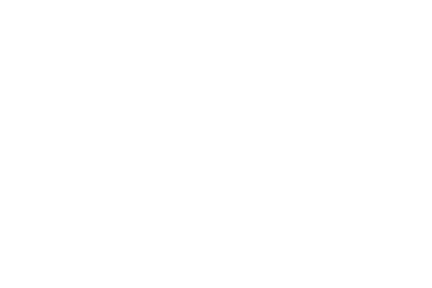

<IPython.core.display.Javascript object>


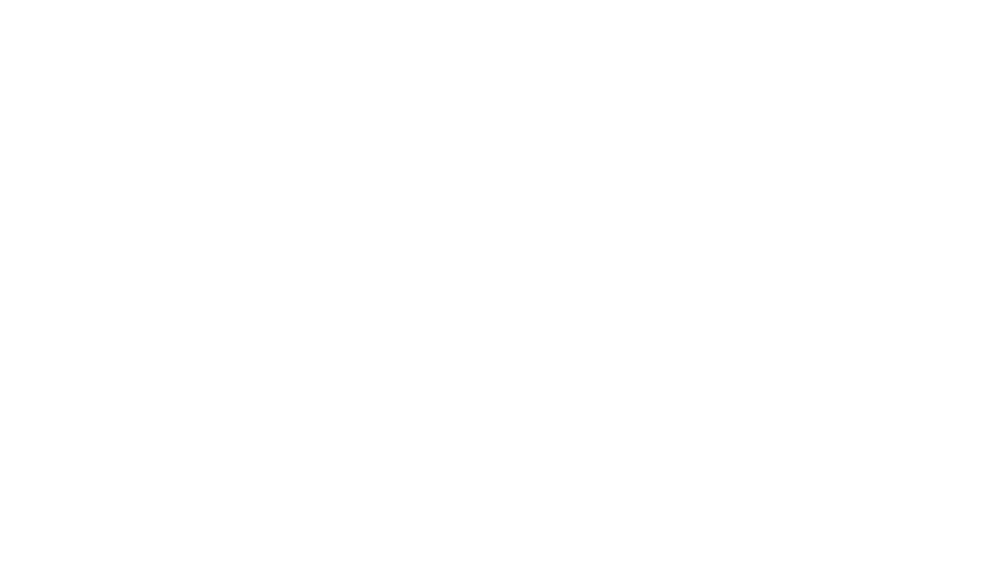

<IPython.core.display.Javascript object>


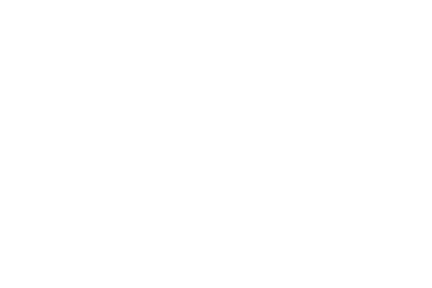

<IPython.core.display.Javascript object>


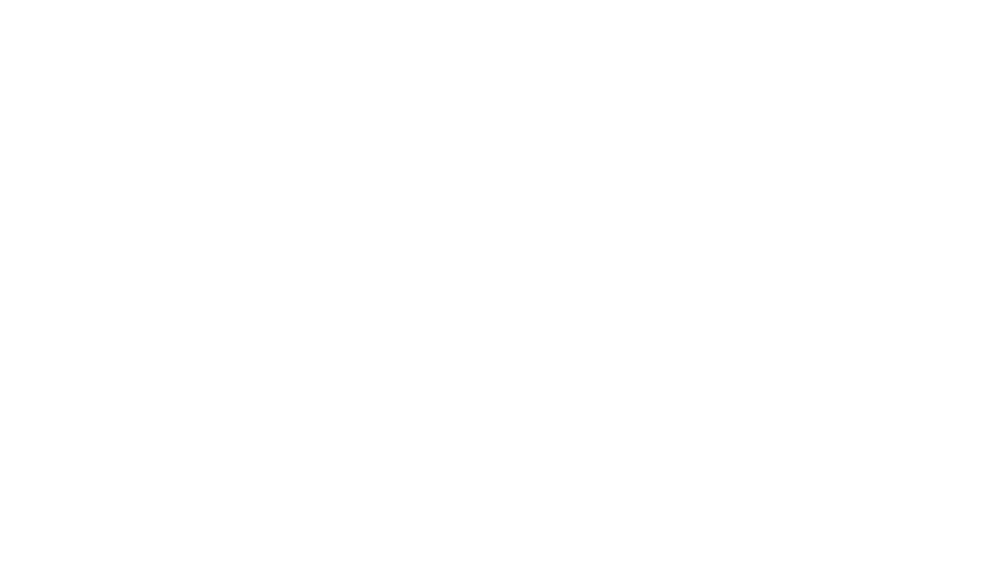

<IPython.core.display.Javascript object>


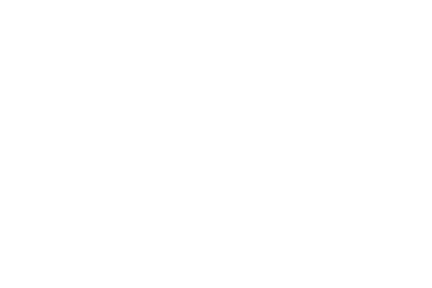

<IPython.core.display.Javascript object>


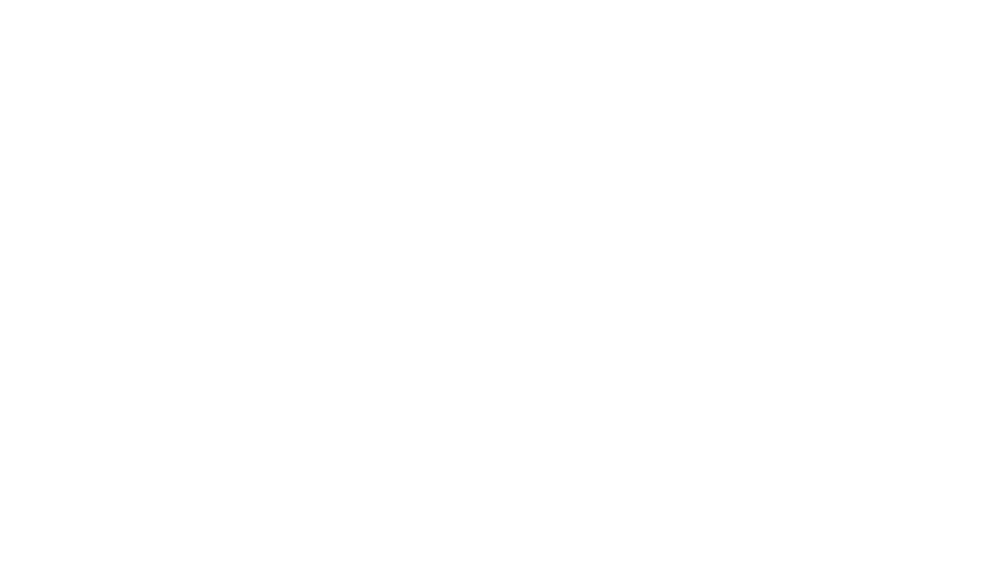

<IPython.core.display.Javascript object>


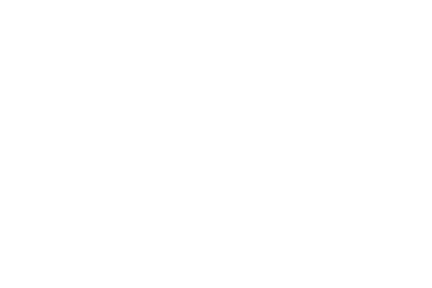

<IPython.core.display.Javascript object>


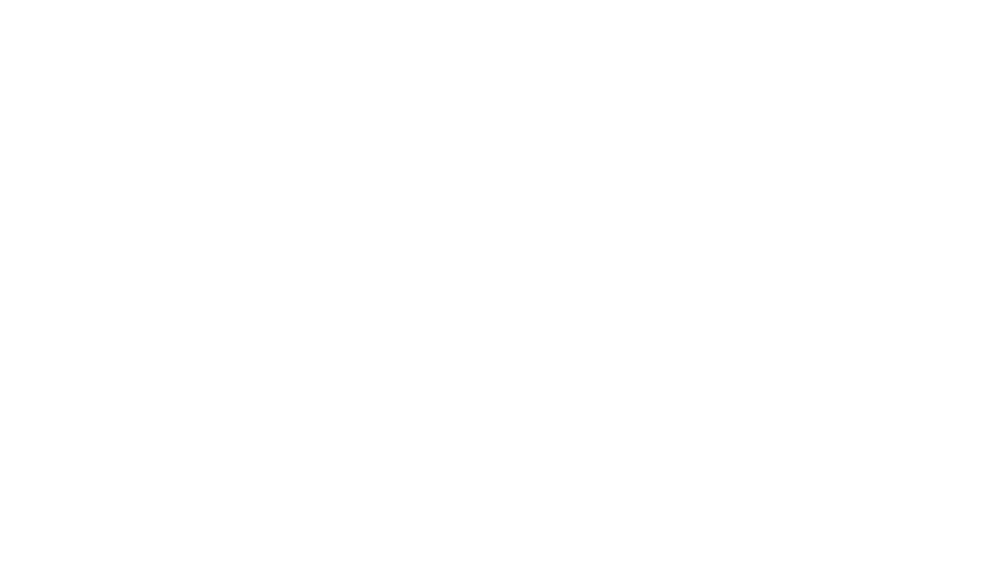

<IPython.core.display.Javascript object>


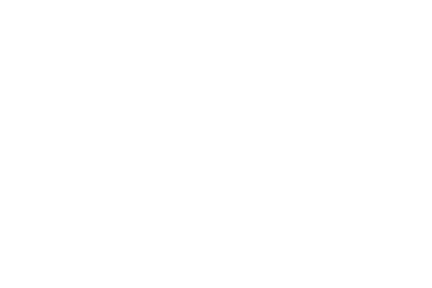

<IPython.core.display.Javascript object>


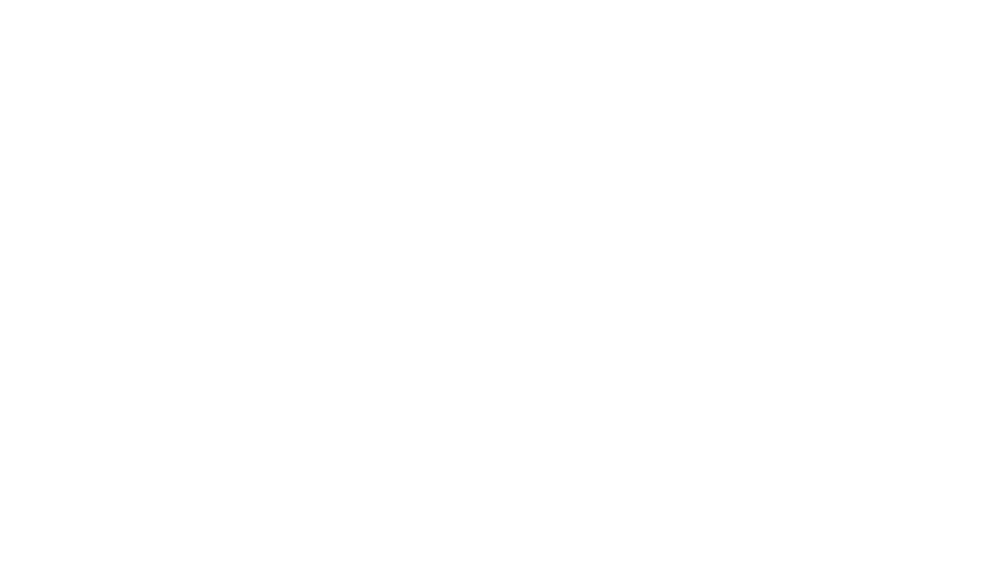

<IPython.core.display.Javascript object>


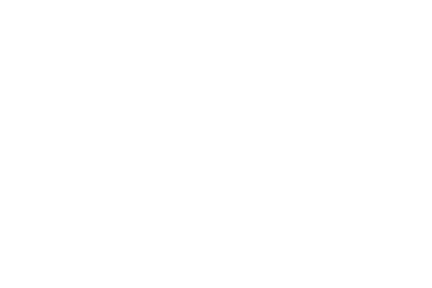

<IPython.core.display.Javascript object>


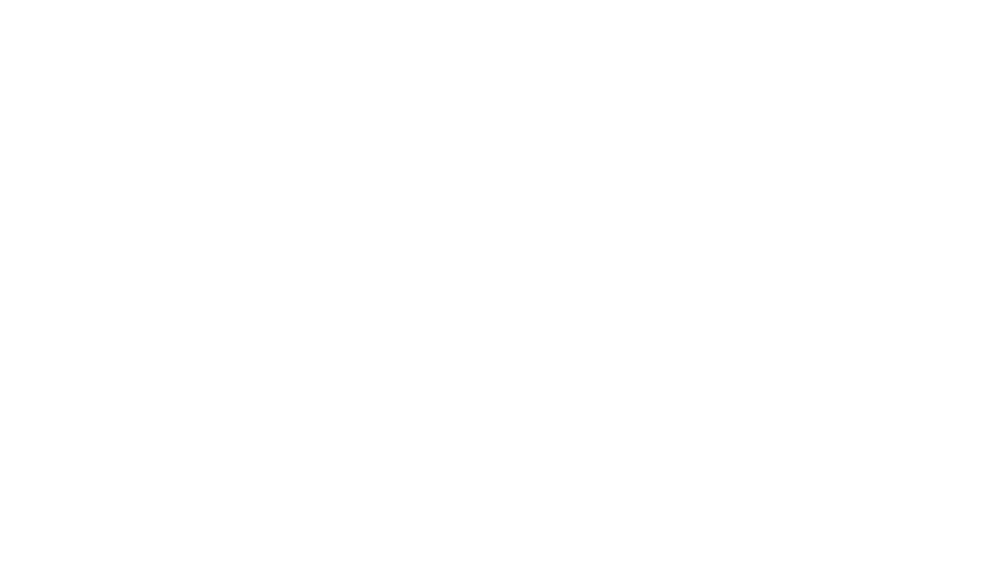

<IPython.core.display.Javascript object>


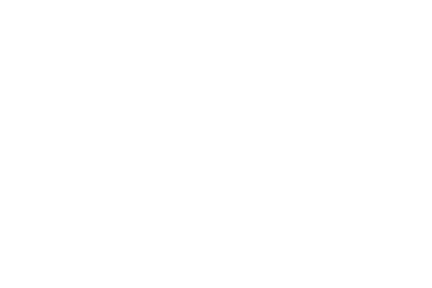

<IPython.core.display.Javascript object>


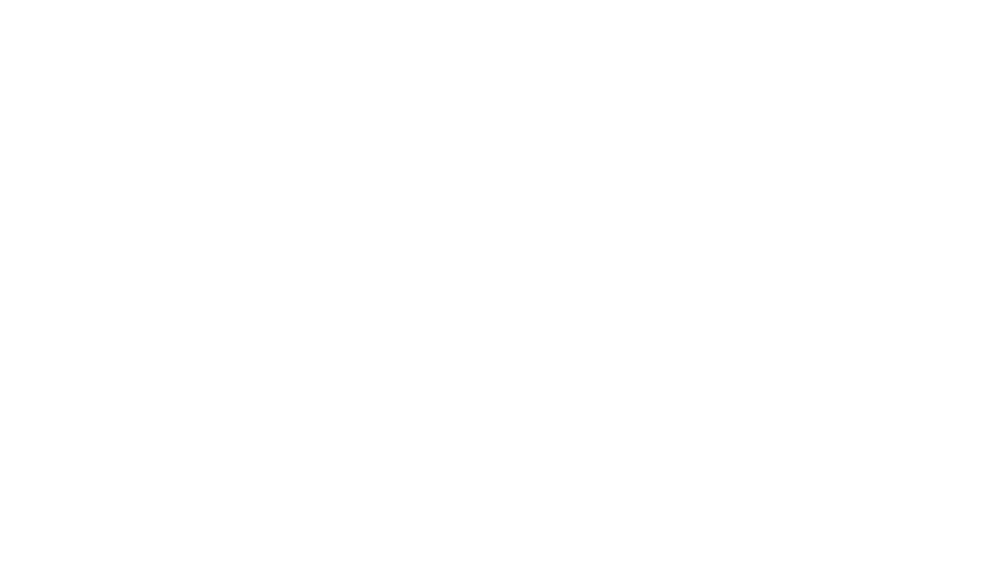

<IPython.core.display.Javascript object>


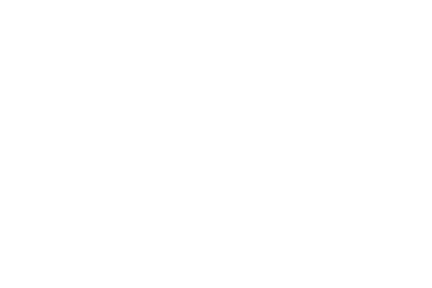

<IPython.core.display.Javascript object>


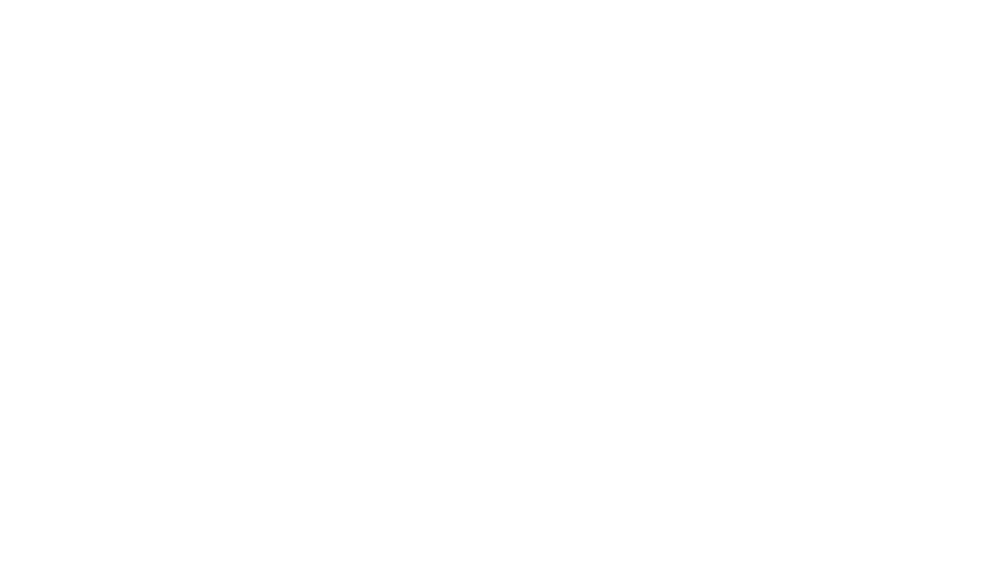

<IPython.core.display.Javascript object>


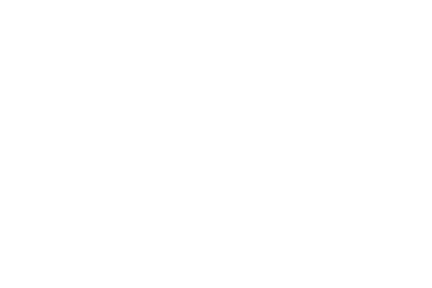

<IPython.core.display.Javascript object>


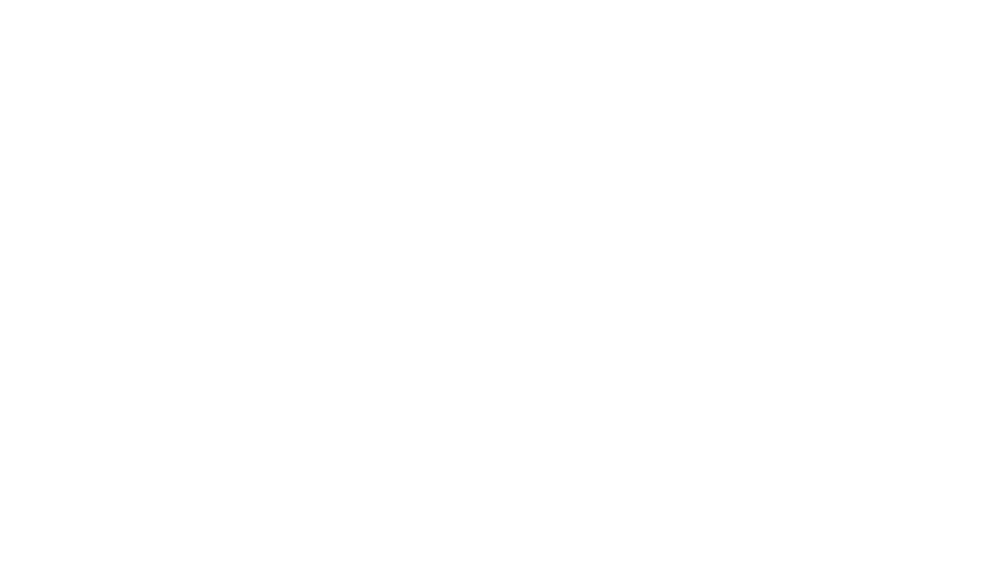

<IPython.core.display.Javascript object>


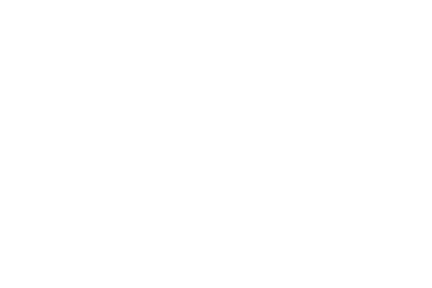

<IPython.core.display.Javascript object>


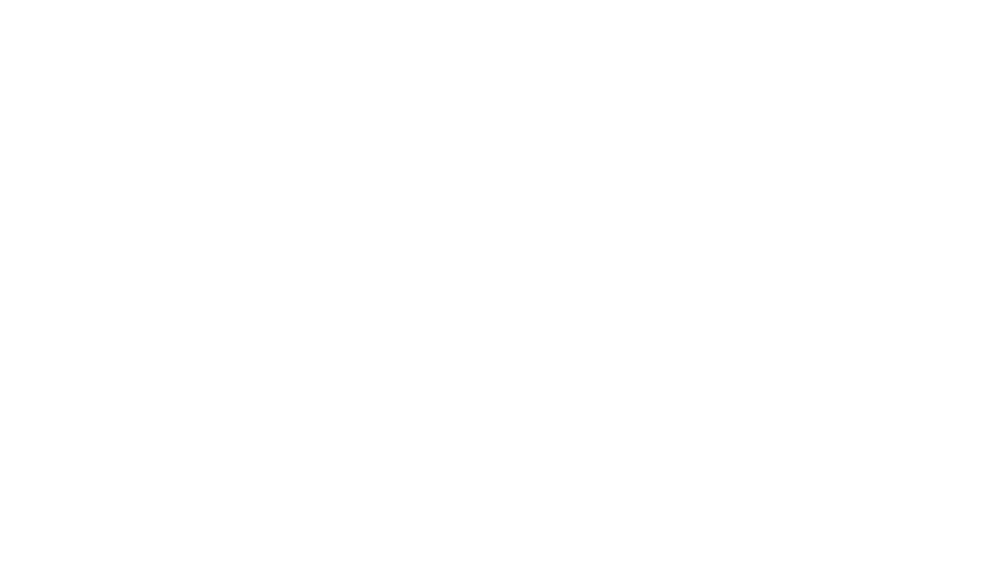

<IPython.core.display.Javascript object>


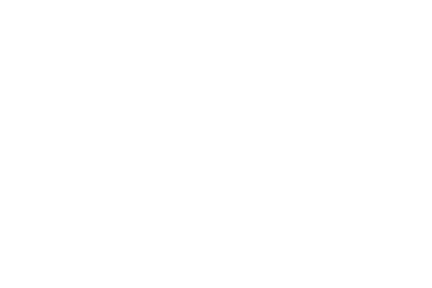

<IPython.core.display.Javascript object>


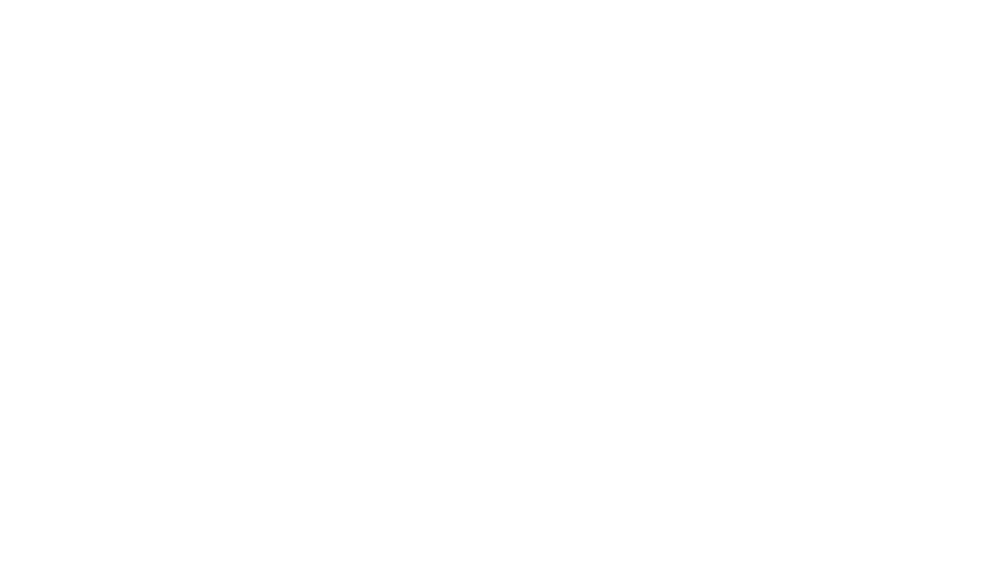

<IPython.core.display.Javascript object>


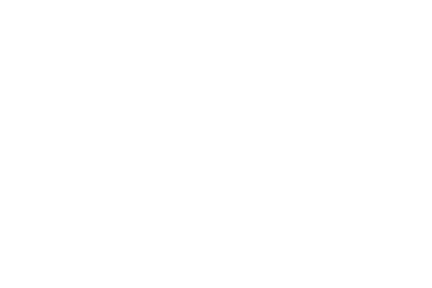

<IPython.core.display.Javascript object>


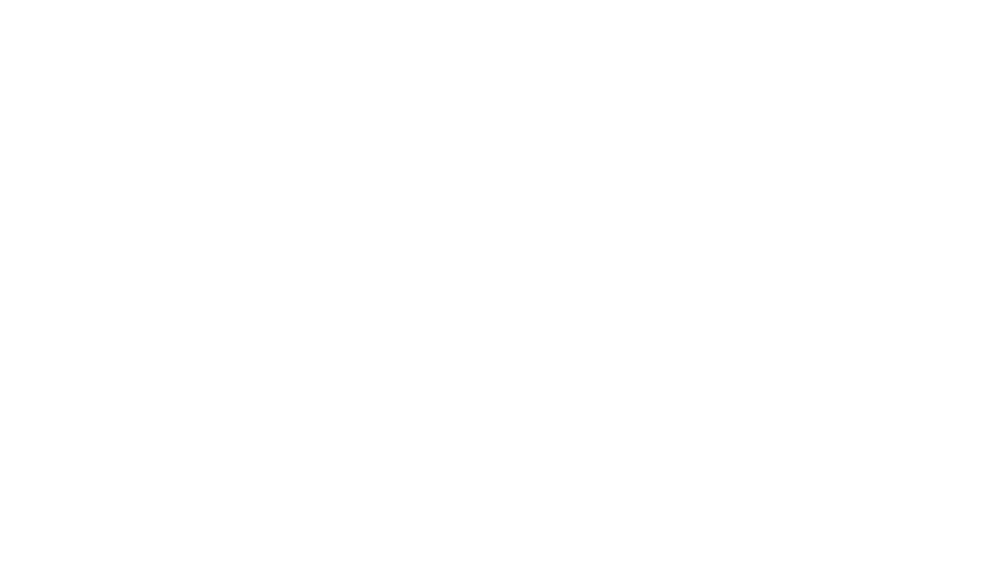

<IPython.core.display.Javascript object>


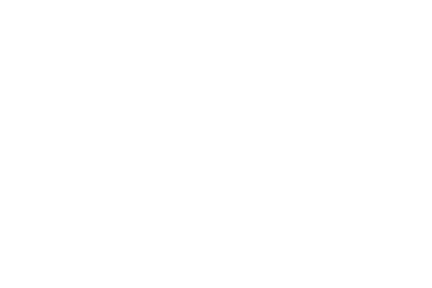

<IPython.core.display.Javascript object>


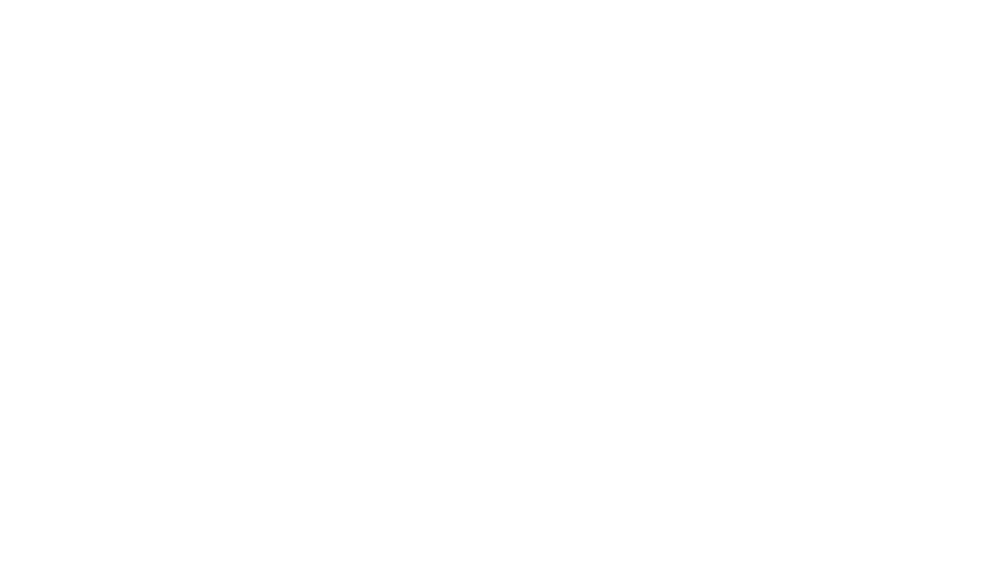

<IPython.core.display.Javascript object>


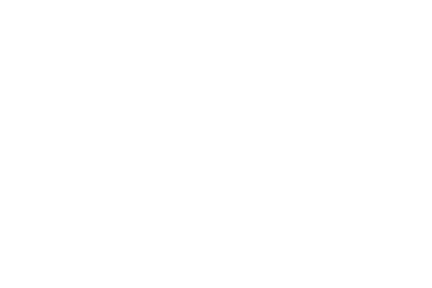

<IPython.core.display.Javascript object>


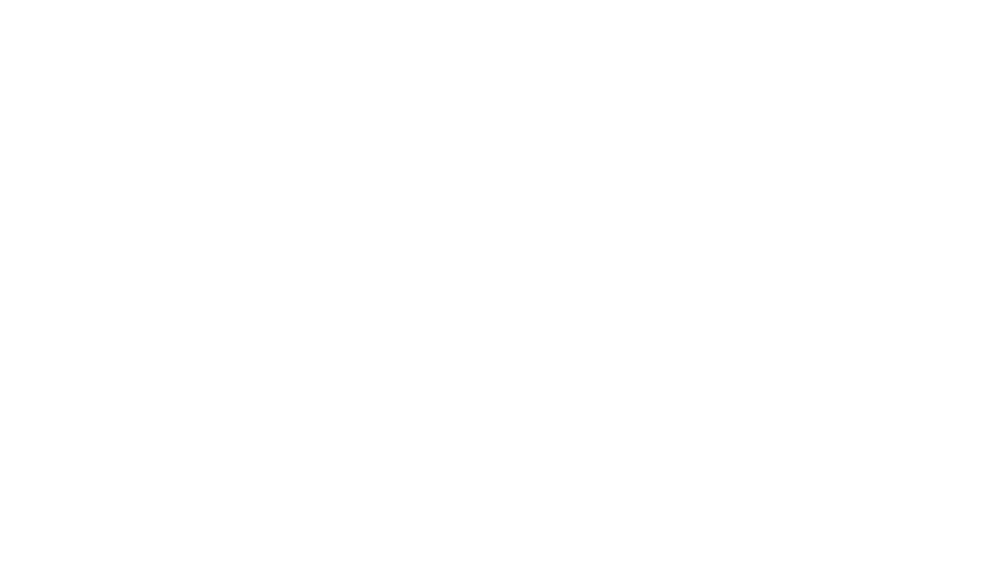

<IPython.core.display.Javascript object>


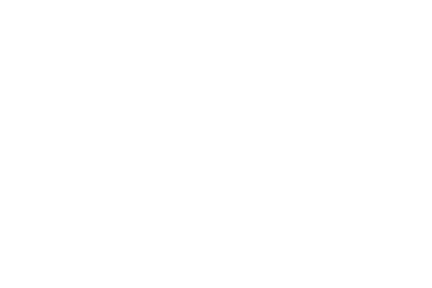

<IPython.core.display.Javascript object>


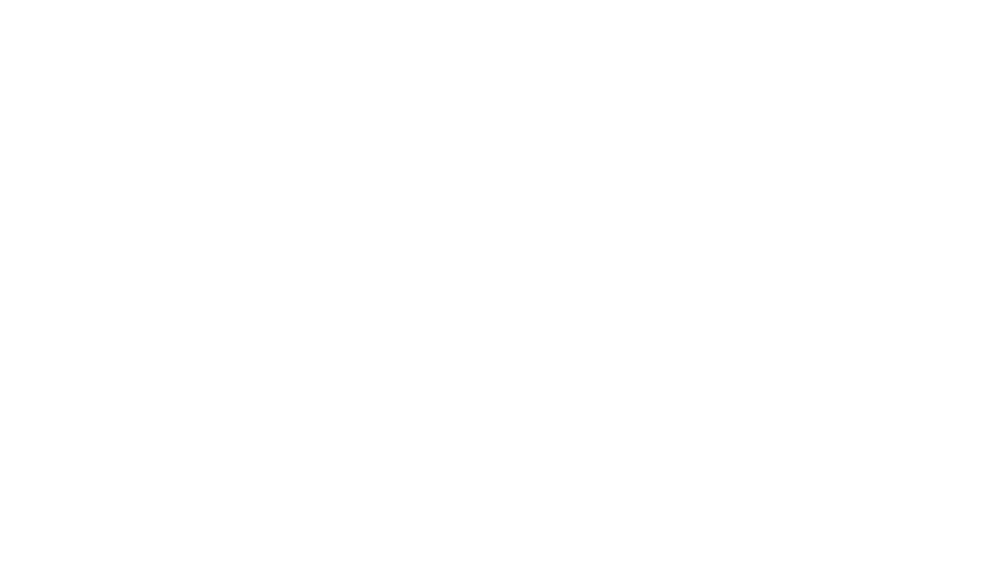

<IPython.core.display.Javascript object>


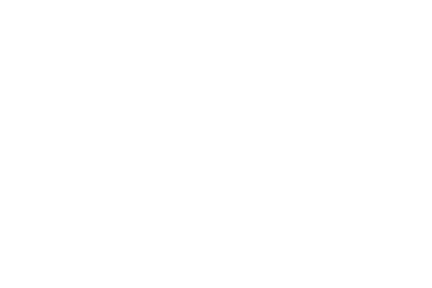

<IPython.core.display.Javascript object>


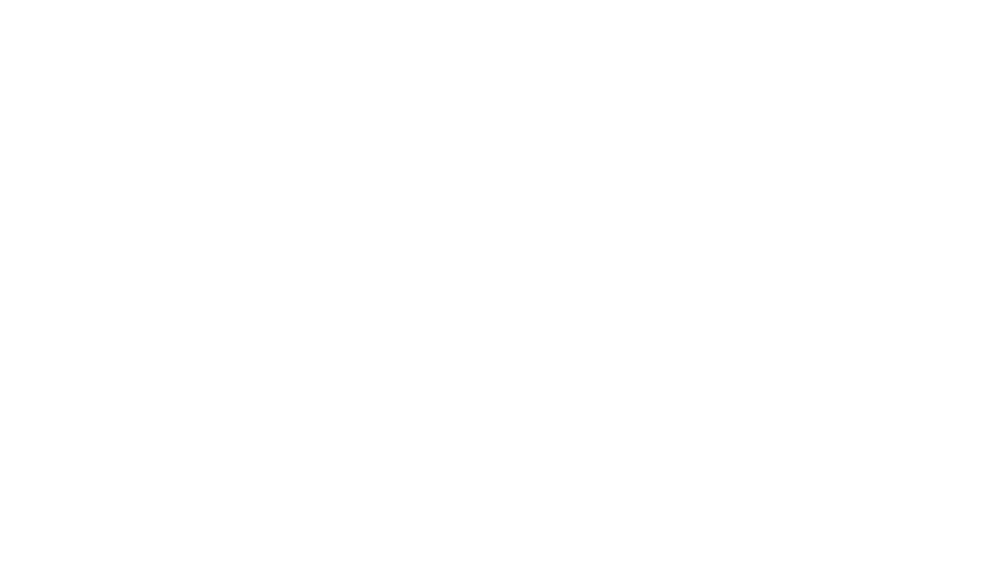

<IPython.core.display.Javascript object>


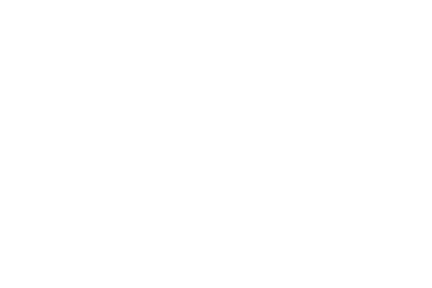

<IPython.core.display.Javascript object>


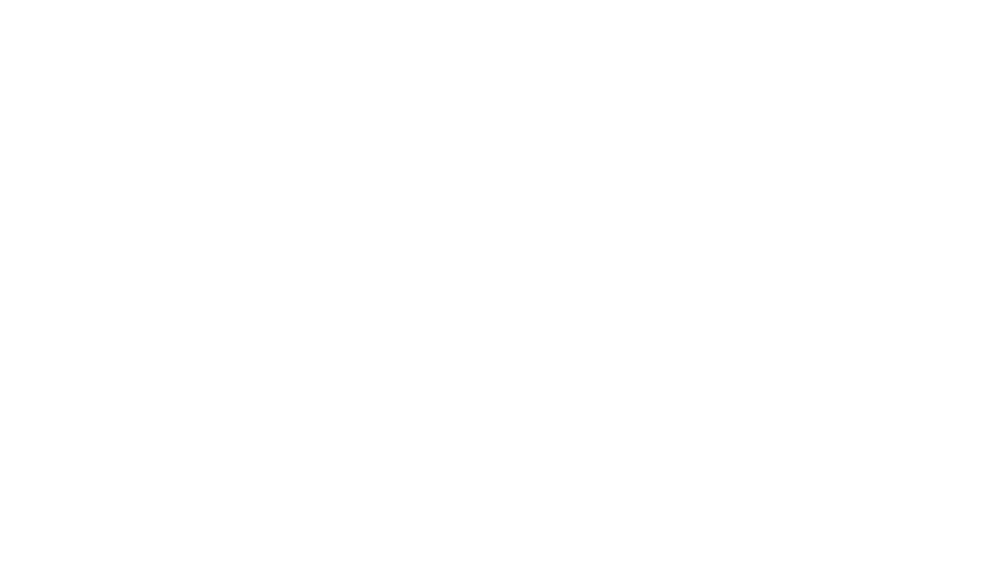

<IPython.core.display.Javascript object>


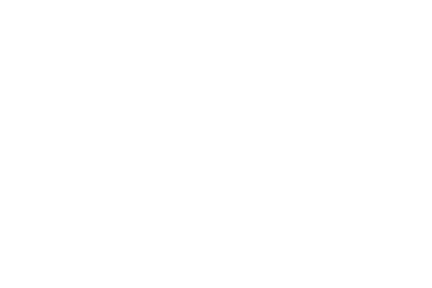

<IPython.core.display.Javascript object>


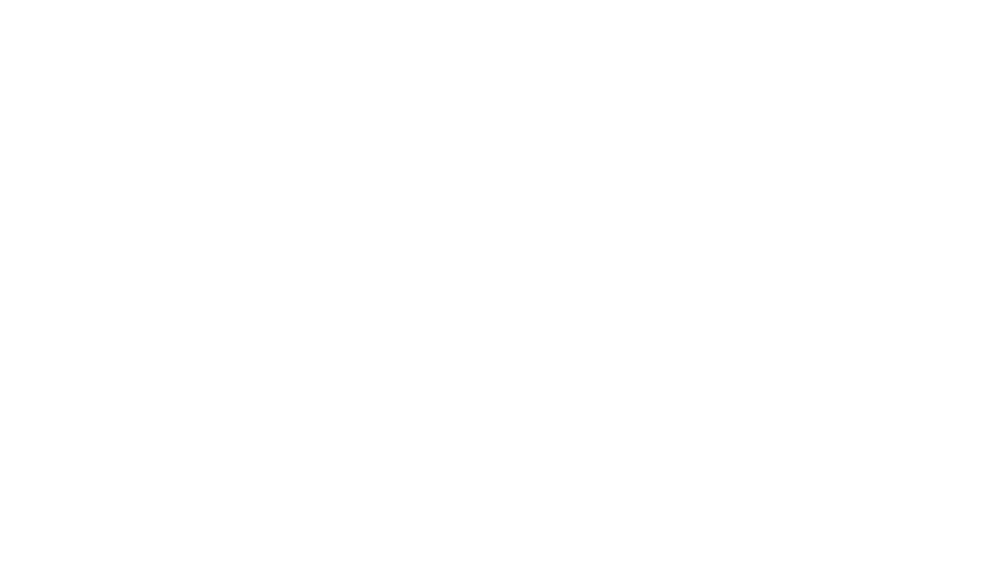

<IPython.core.display.Javascript object>


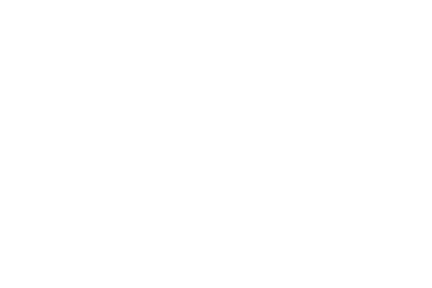

<IPython.core.display.Javascript object>


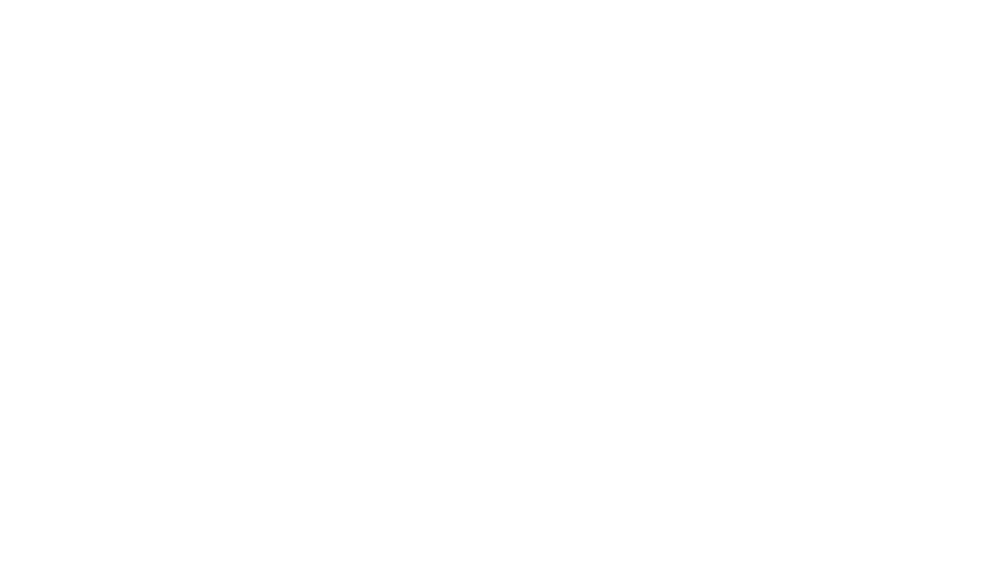

<IPython.core.display.Javascript object>


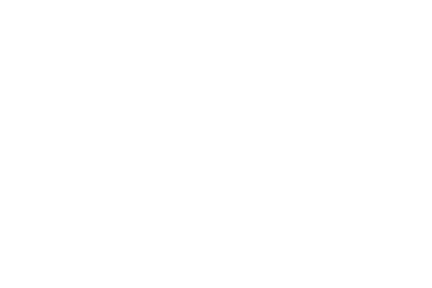

<IPython.core.display.Javascript object>


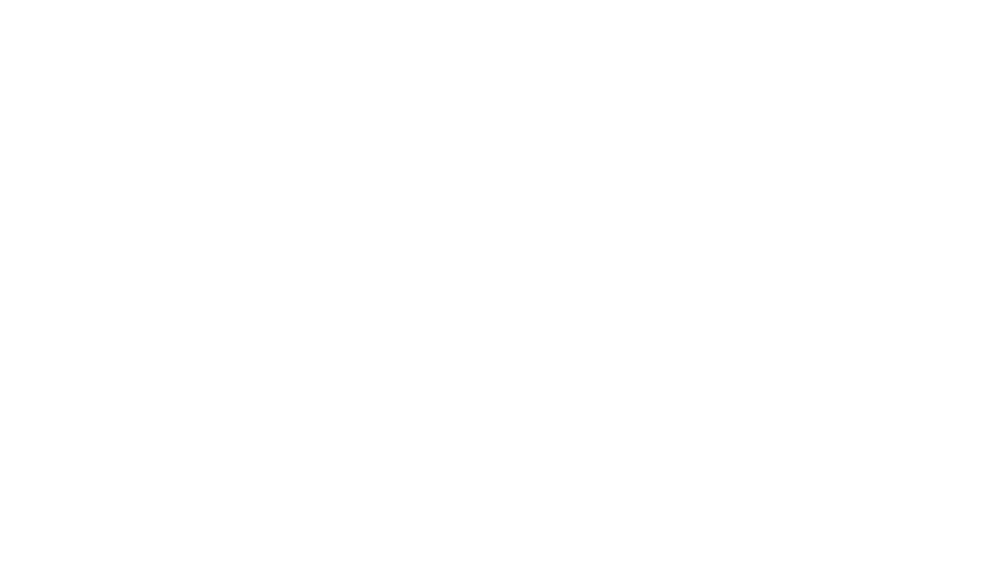

<IPython.core.display.Javascript object>


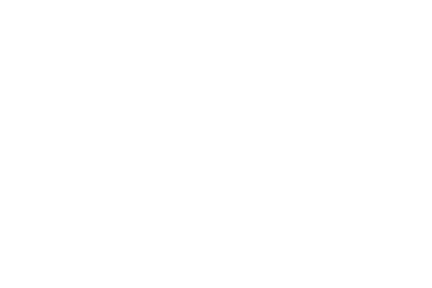

<IPython.core.display.Javascript object>


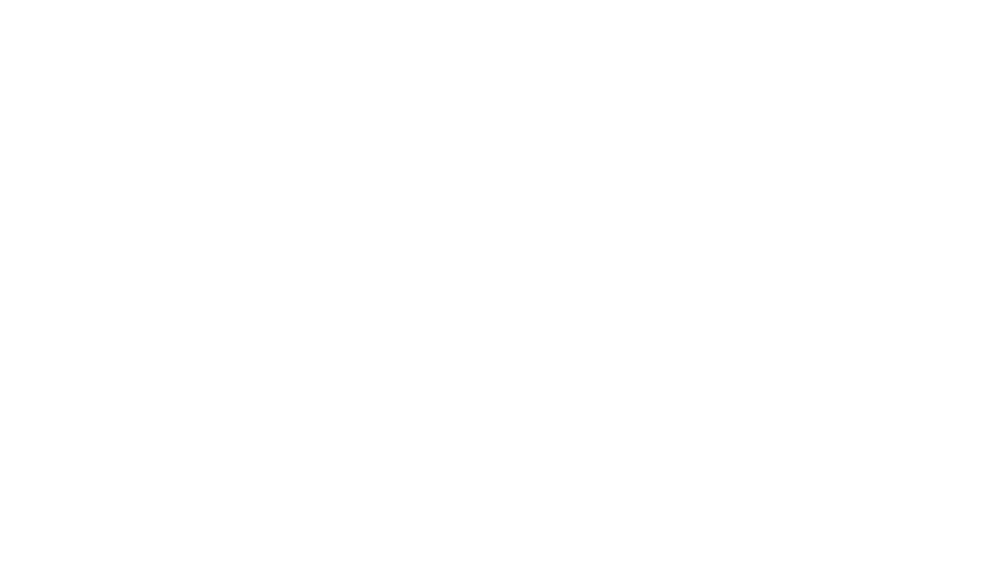

<IPython.core.display.Javascript object>


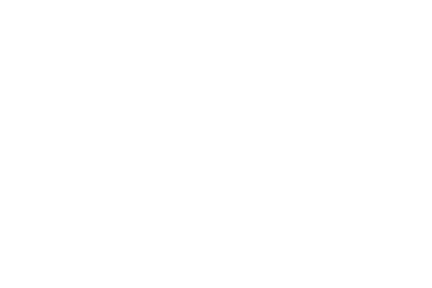

<IPython.core.display.Javascript object>


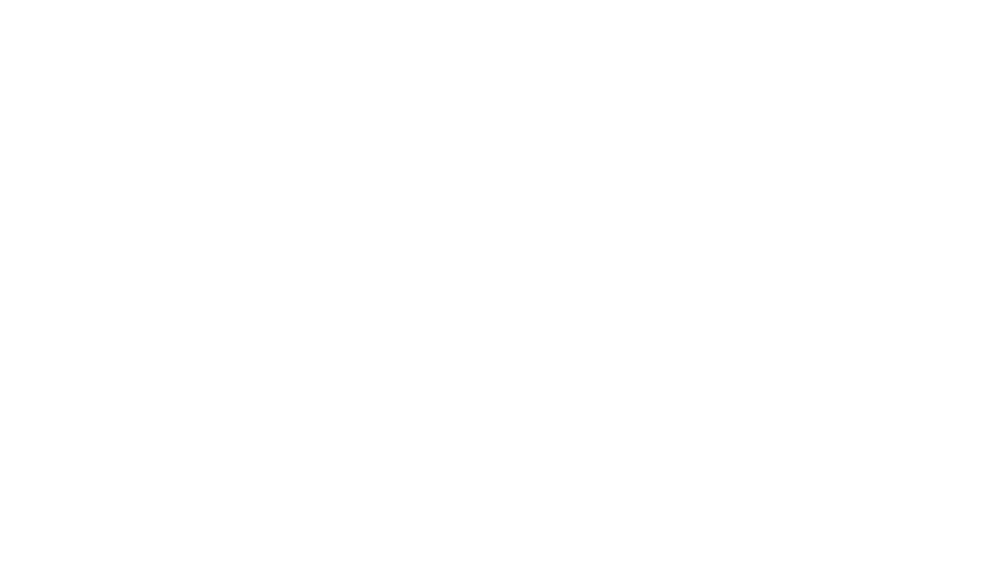

<IPython.core.display.Javascript object>


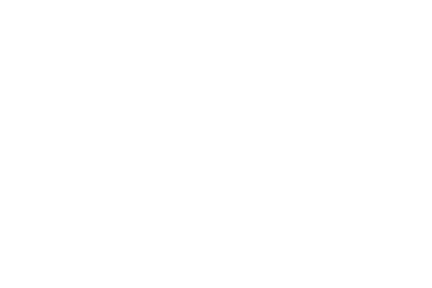

<IPython.core.display.Javascript object>


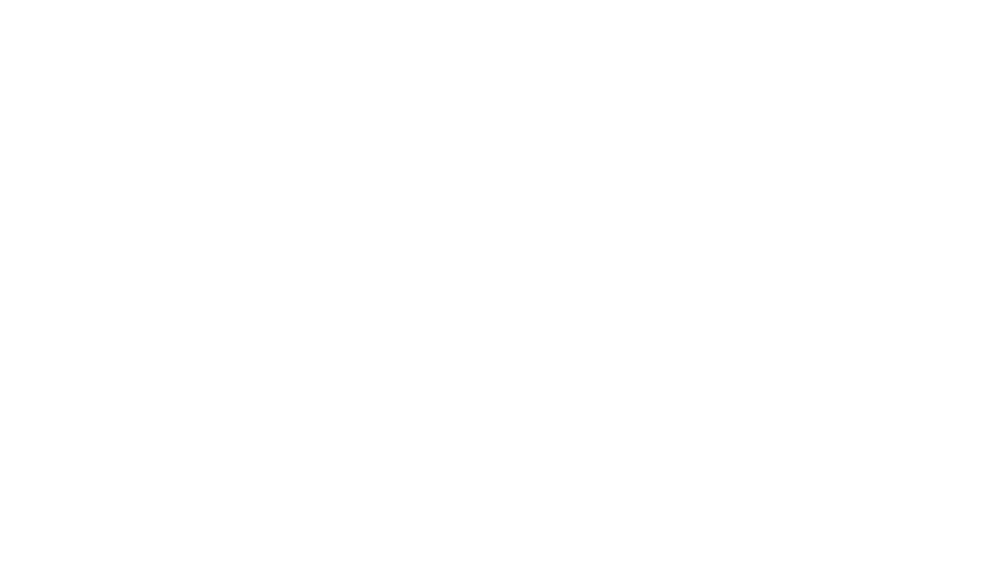

<IPython.core.display.Javascript object>


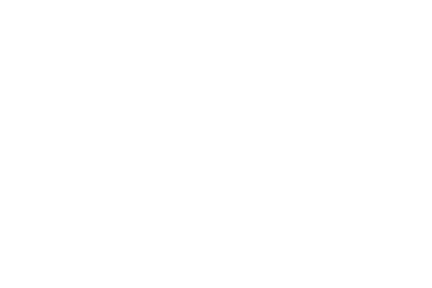

<IPython.core.display.Javascript object>


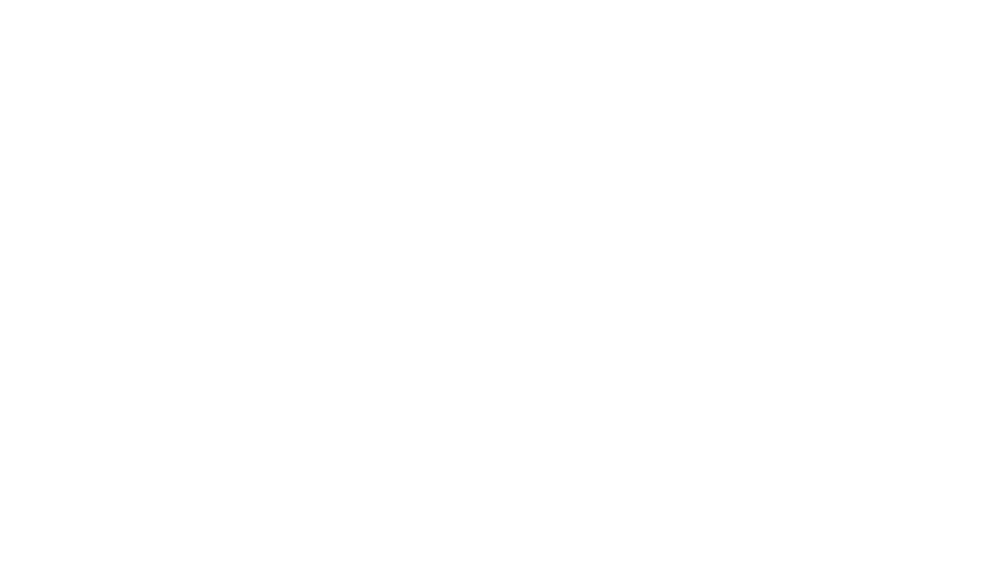

<IPython.core.display.Javascript object>


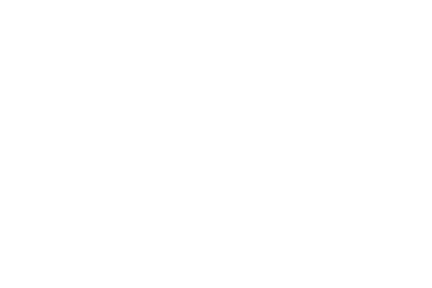

<IPython.core.display.Javascript object>


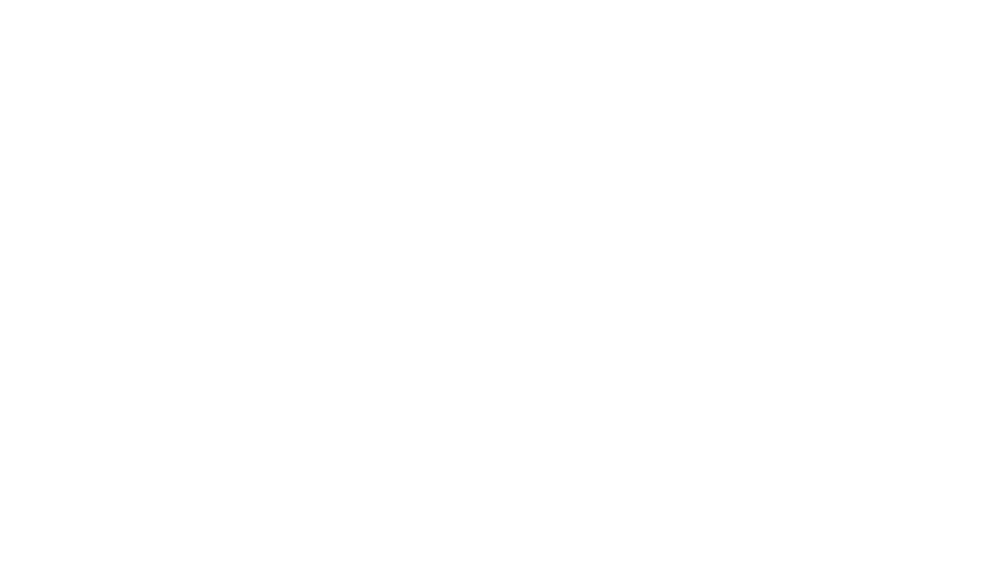

<IPython.core.display.Javascript object>


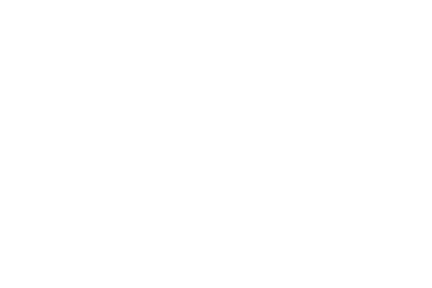

<IPython.core.display.Javascript object>


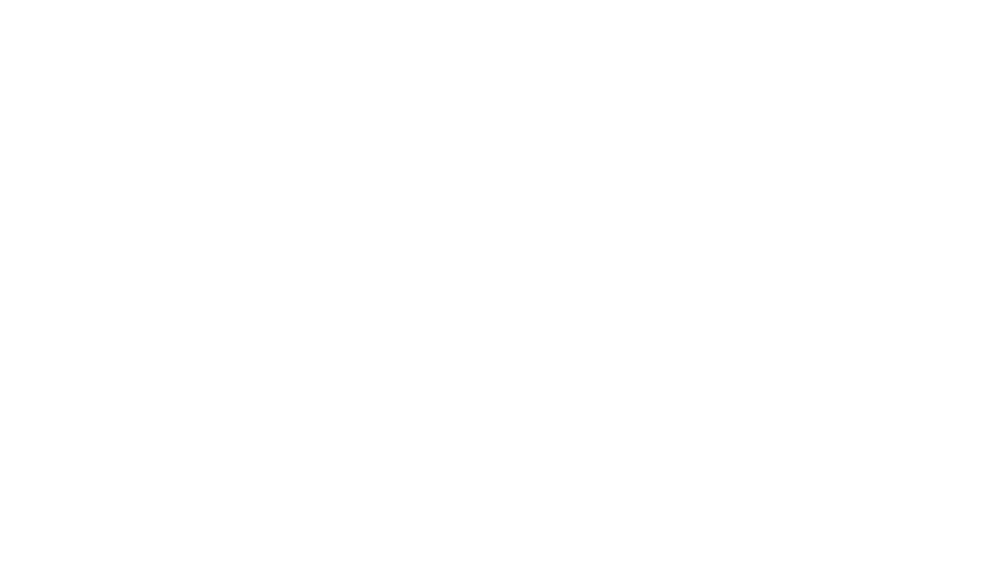

<IPython.core.display.Javascript object>


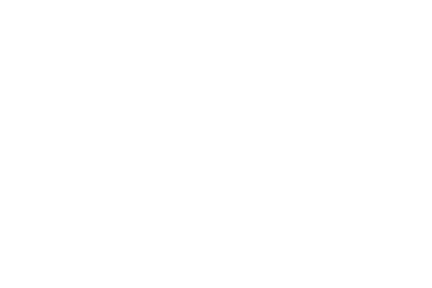

<IPython.core.display.Javascript object>


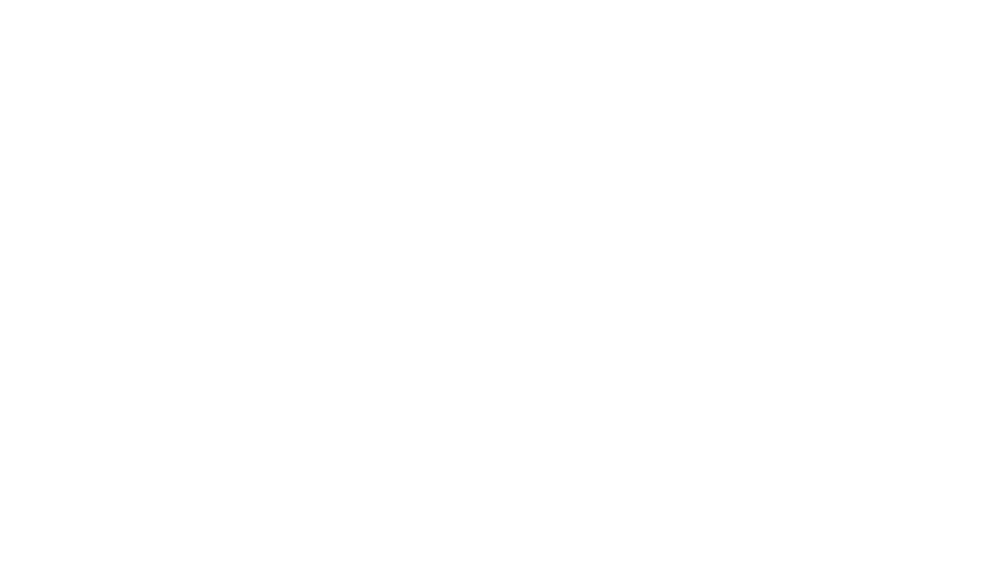

<IPython.core.display.Javascript object>


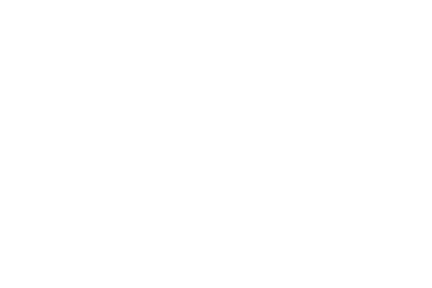

<IPython.core.display.Javascript object>


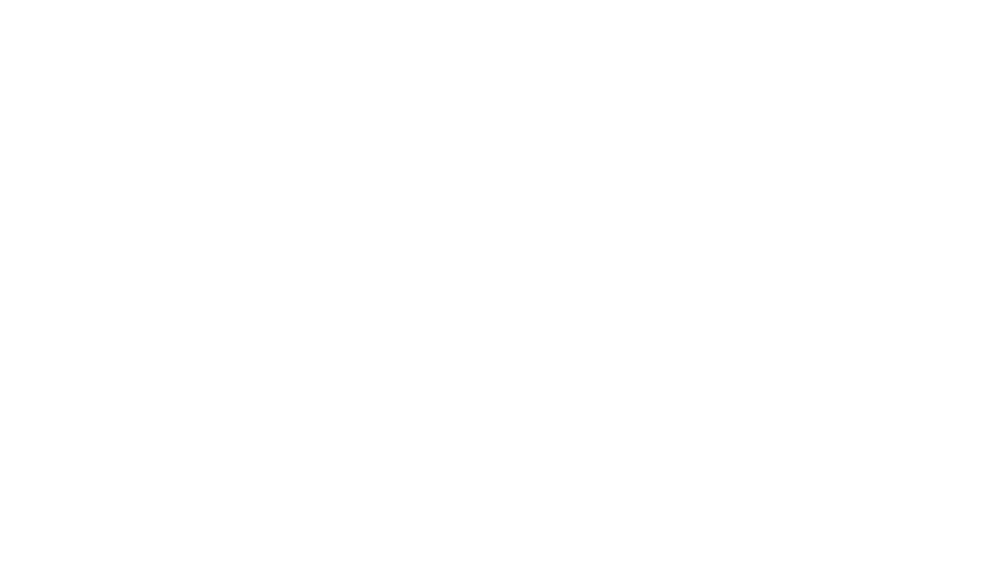

<IPython.core.display.Javascript object>


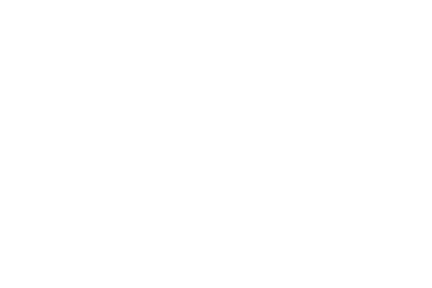

<IPython.core.display.Javascript object>


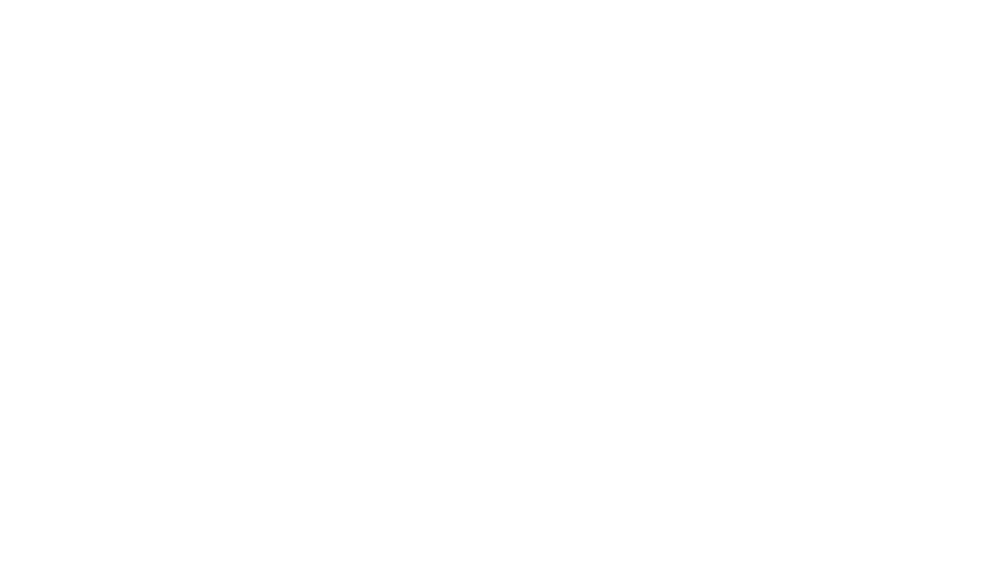

<IPython.core.display.Javascript object>


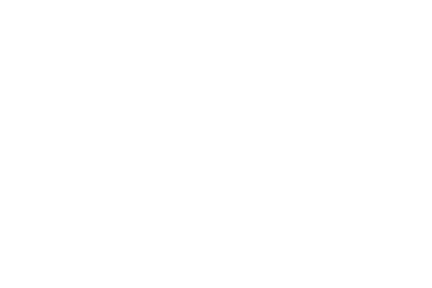

<IPython.core.display.Javascript object>


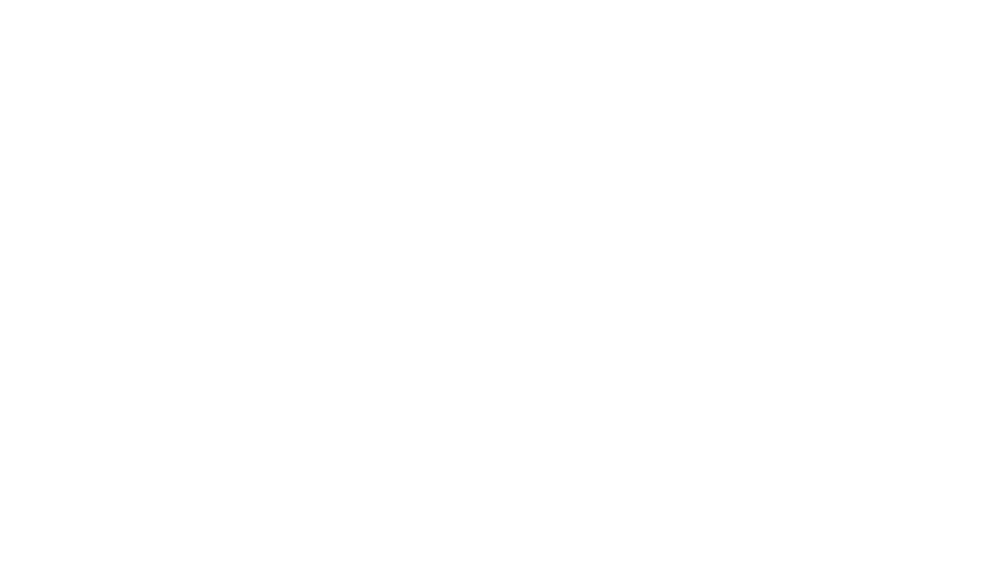

<IPython.core.display.Javascript object>


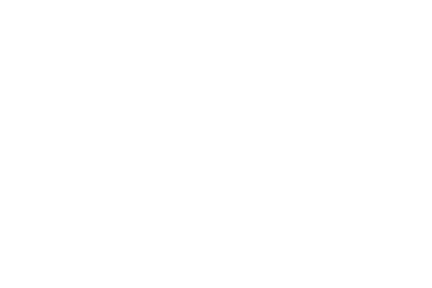

<IPython.core.display.Javascript object>


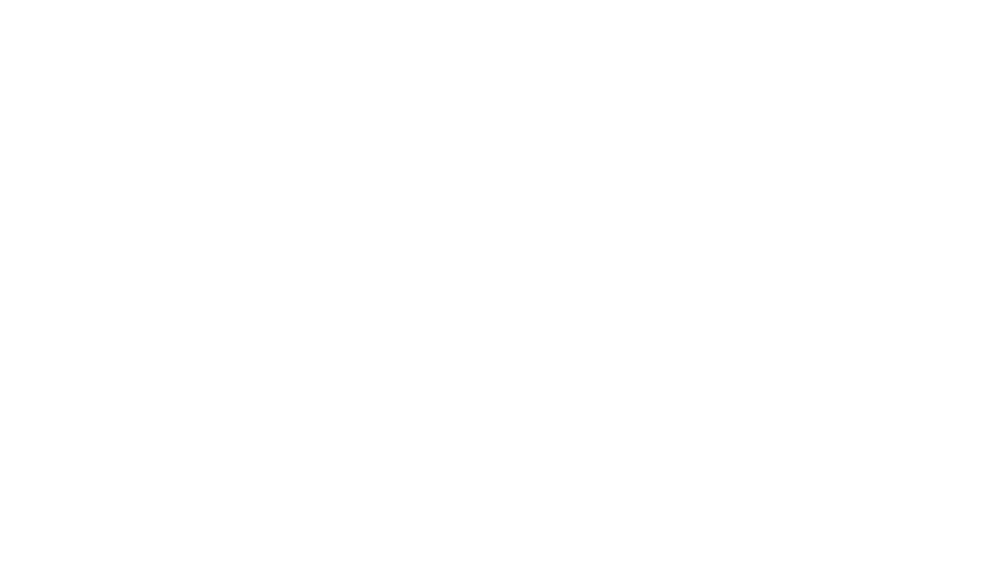

<IPython.core.display.Javascript object>


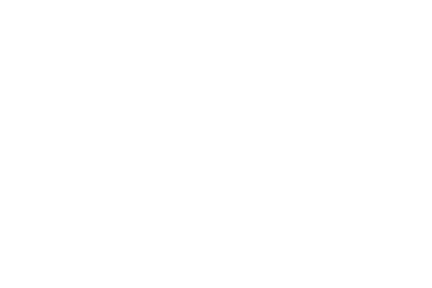

<IPython.core.display.Javascript object>


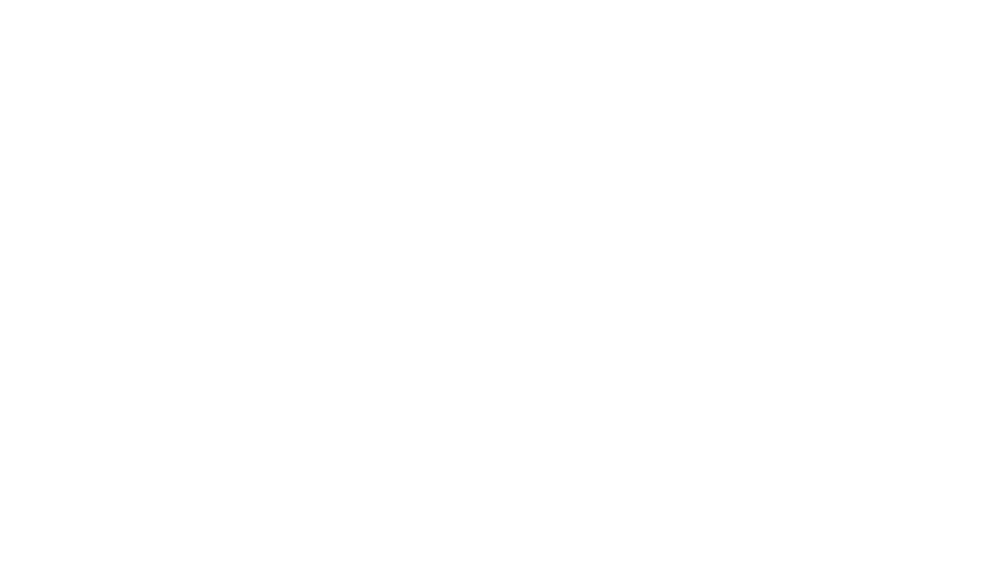

<IPython.core.display.Javascript object>


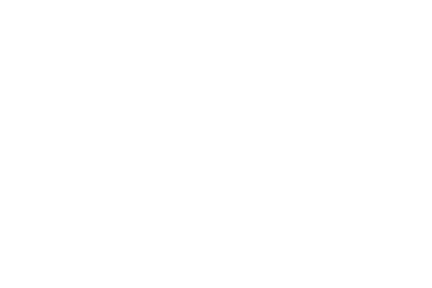

<IPython.core.display.Javascript object>


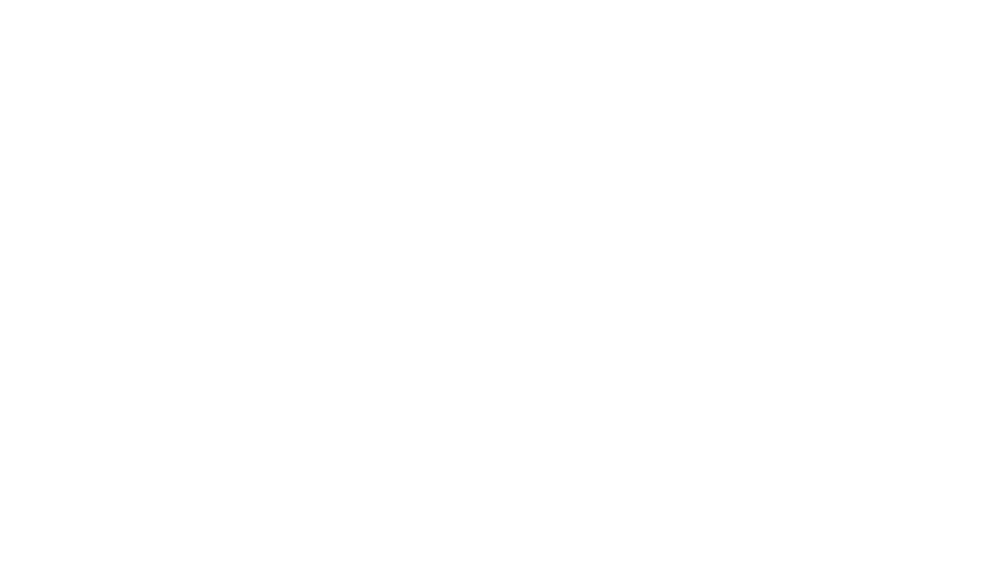

<IPython.core.display.Javascript object>


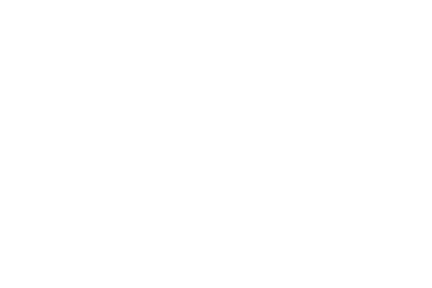

<IPython.core.display.Javascript object>


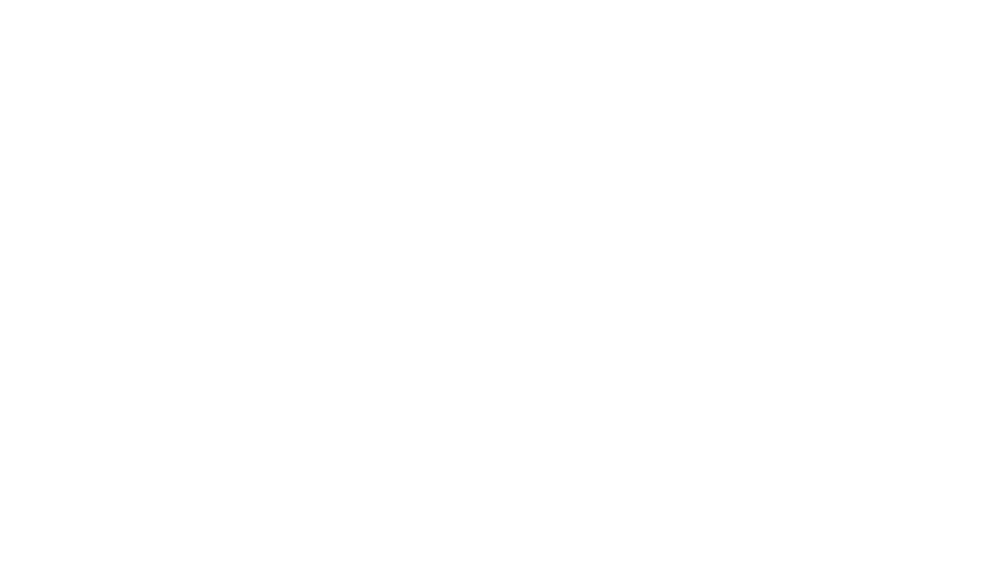

<IPython.core.display.Javascript object>


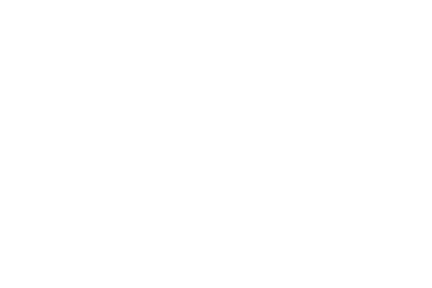

<IPython.core.display.Javascript object>


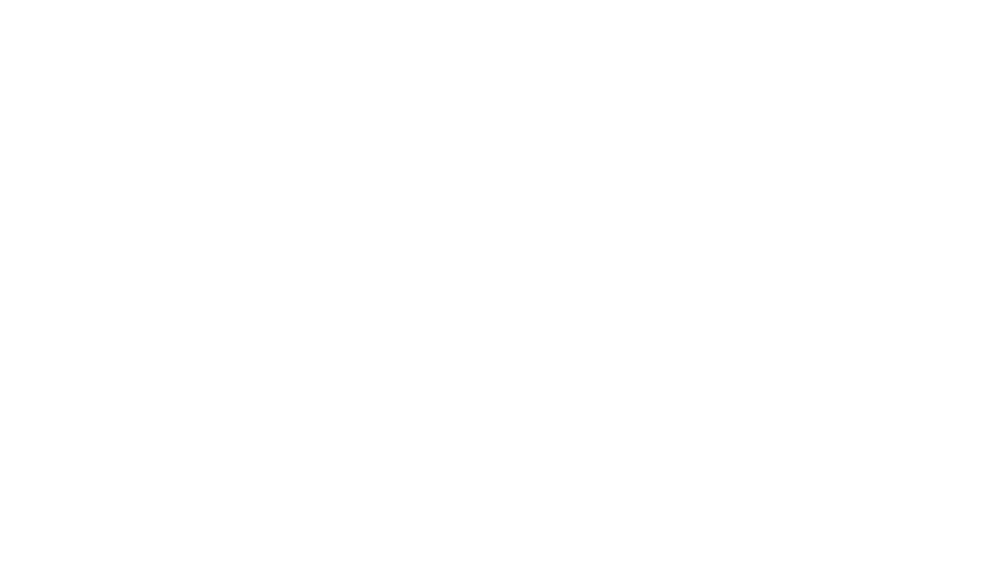

<IPython.core.display.Javascript object>


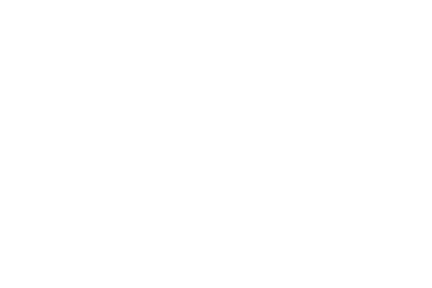

<IPython.core.display.Javascript object>


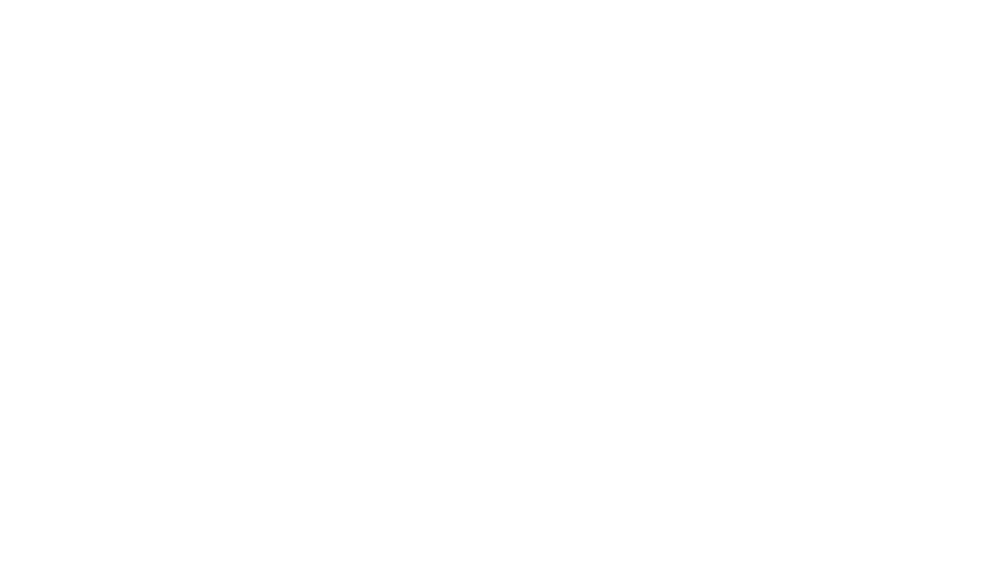

<IPython.core.display.Javascript object>


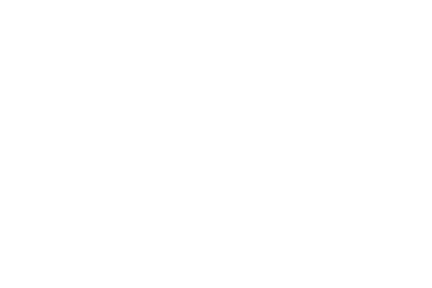

<IPython.core.display.Javascript object>


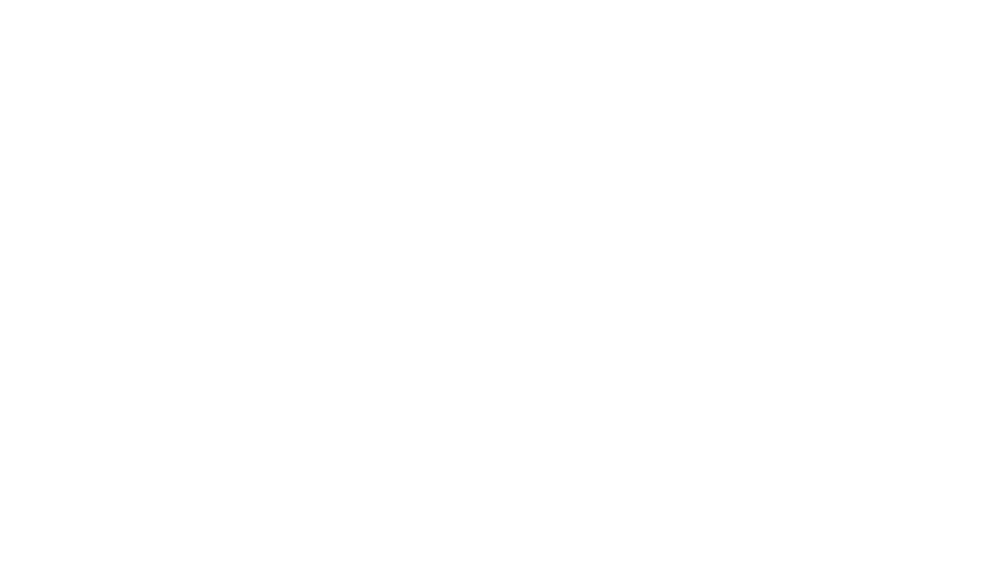

<IPython.core.display.Javascript object>


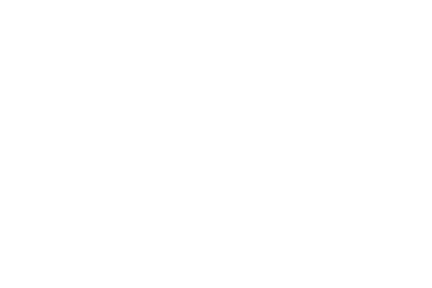

<IPython.core.display.Javascript object>


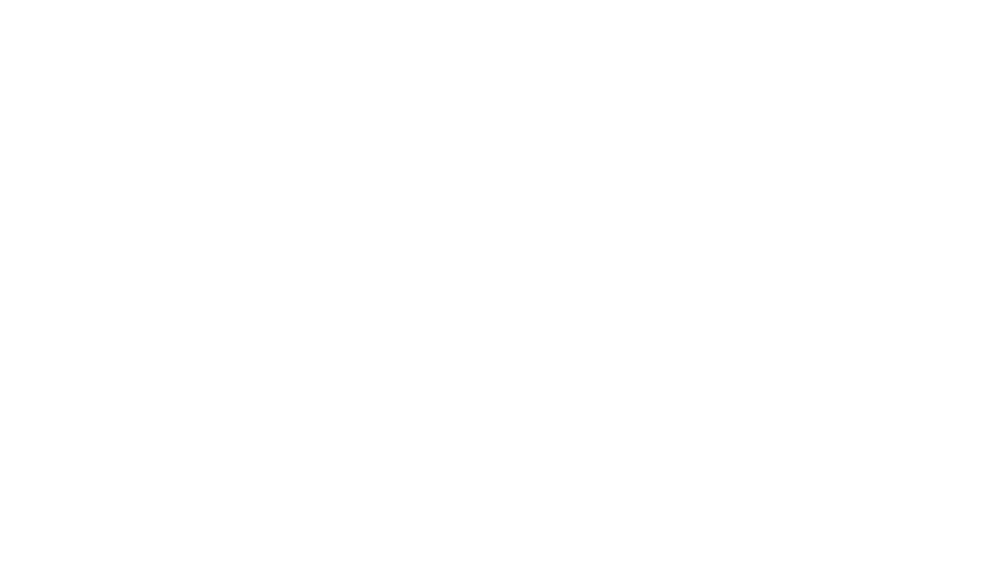

<IPython.core.display.Javascript object>


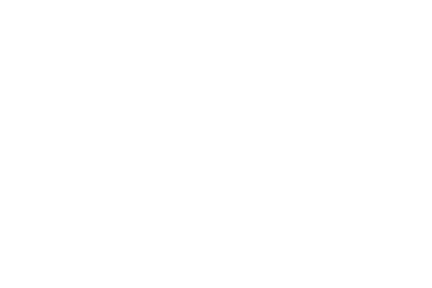

<IPython.core.display.Javascript object>


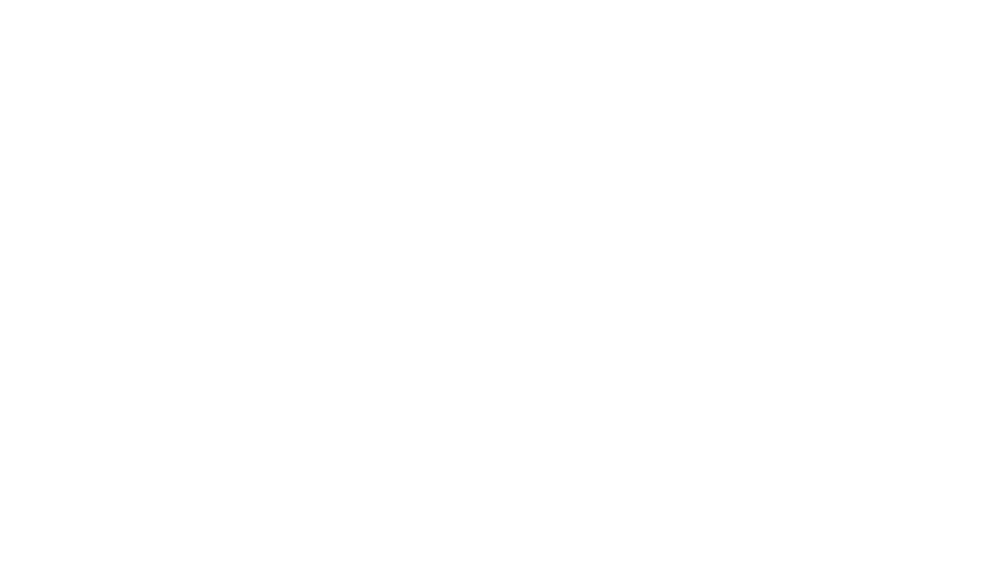

<IPython.core.display.Javascript object>


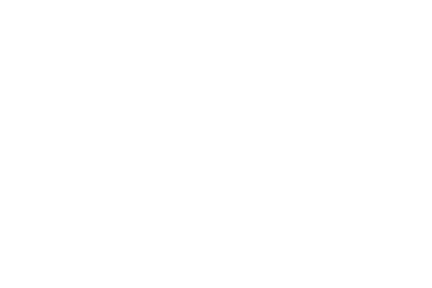

<IPython.core.display.Javascript object>


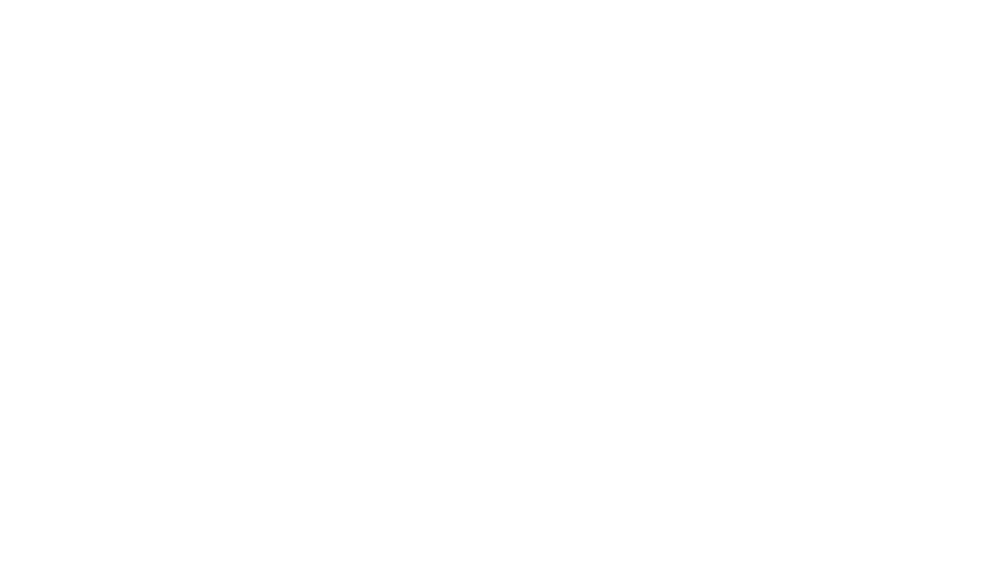

<IPython.core.display.Javascript object>


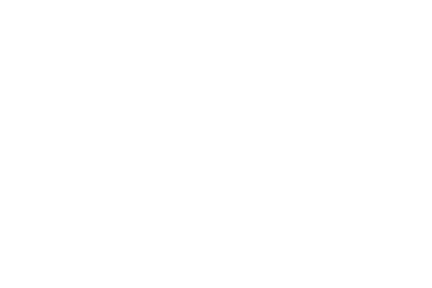

<IPython.core.display.Javascript object>


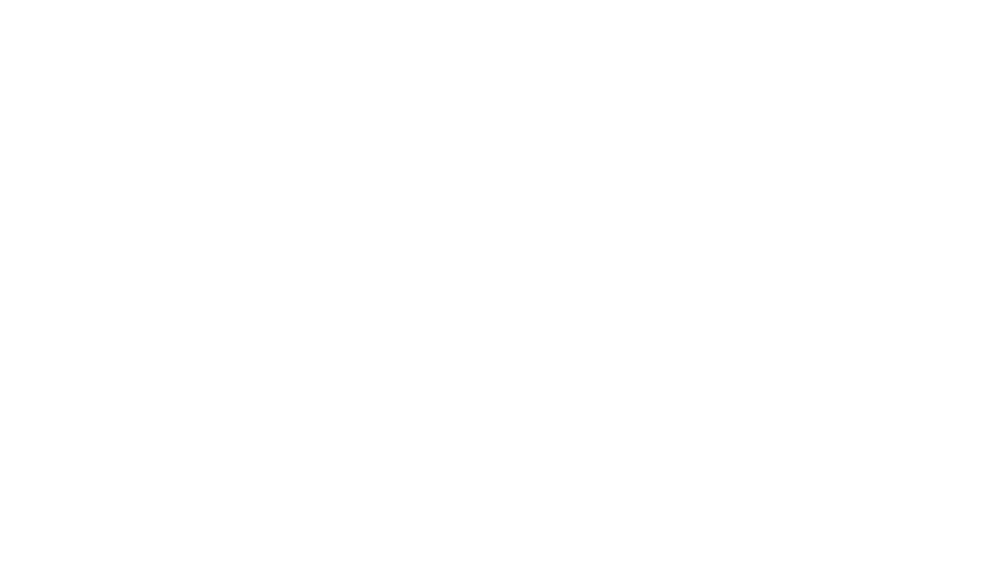

<IPython.core.display.Javascript object>


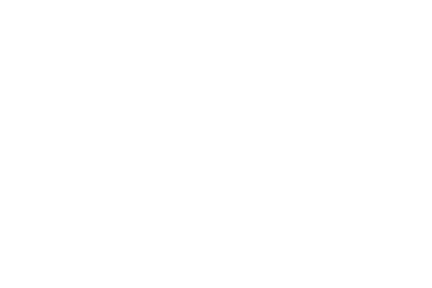

<IPython.core.display.Javascript object>


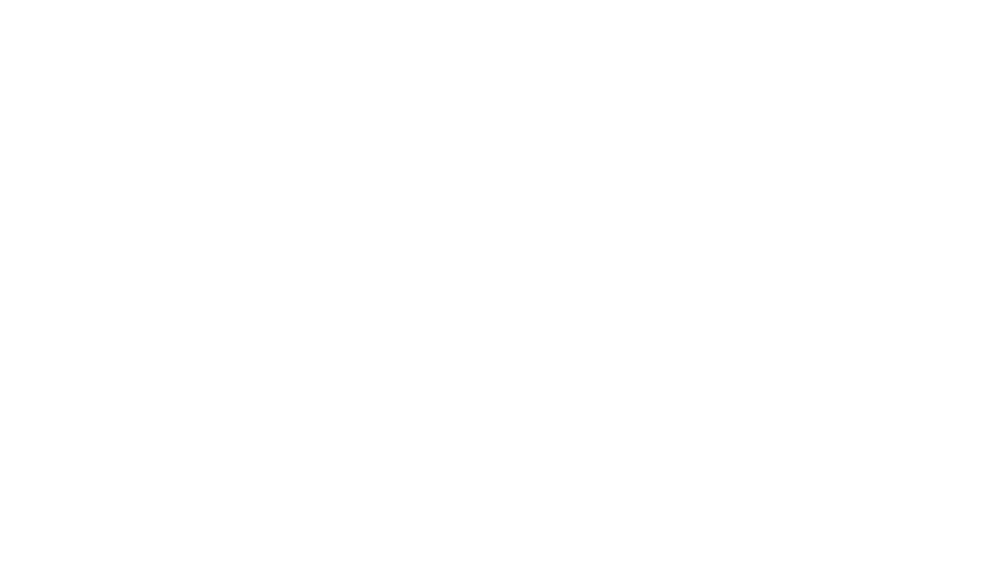

<IPython.core.display.Javascript object>


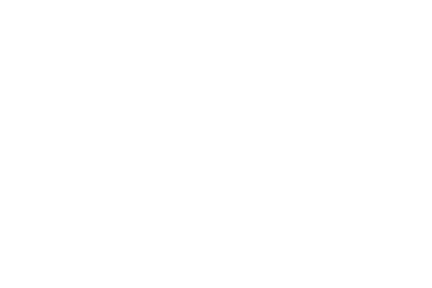

<IPython.core.display.Javascript object>


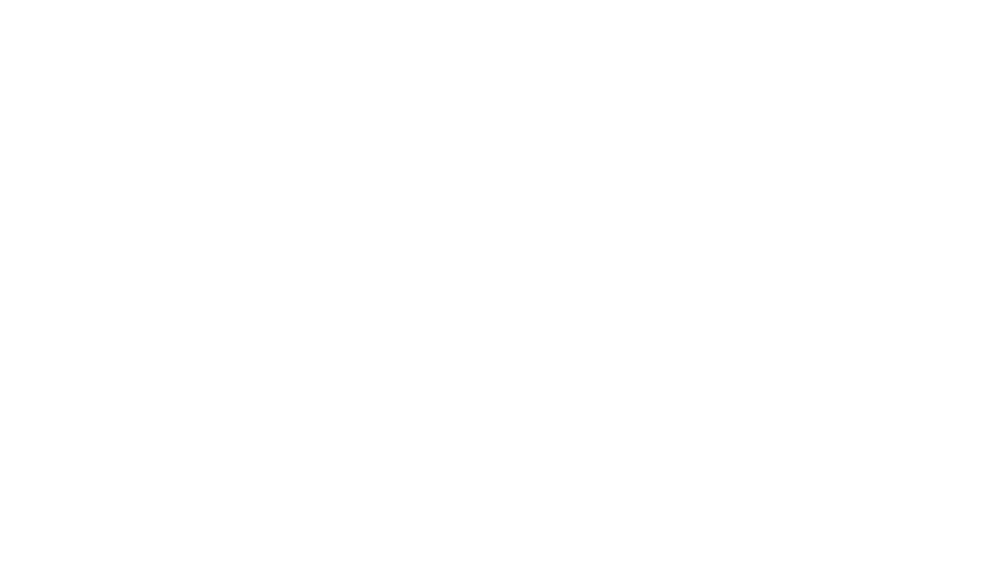

<IPython.core.display.Javascript object>


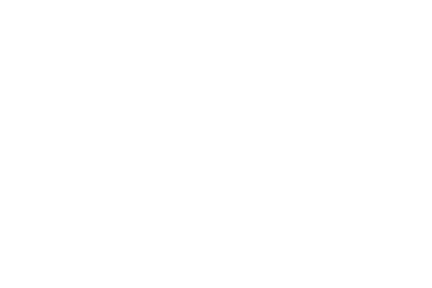

<IPython.core.display.Javascript object>


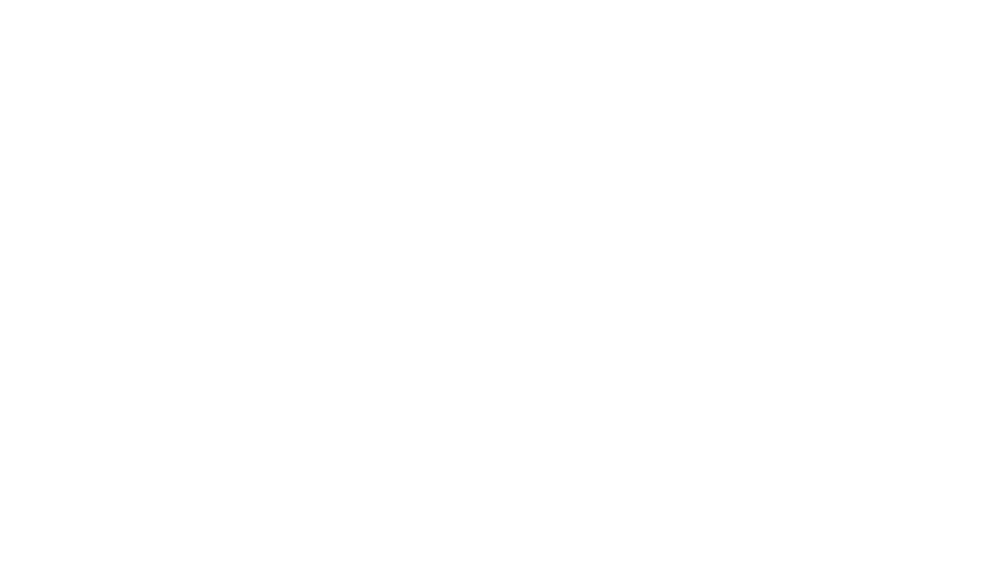

<IPython.core.display.Javascript object>


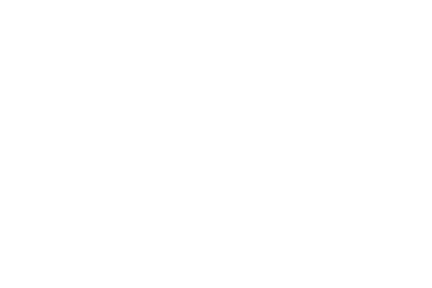

<IPython.core.display.Javascript object>


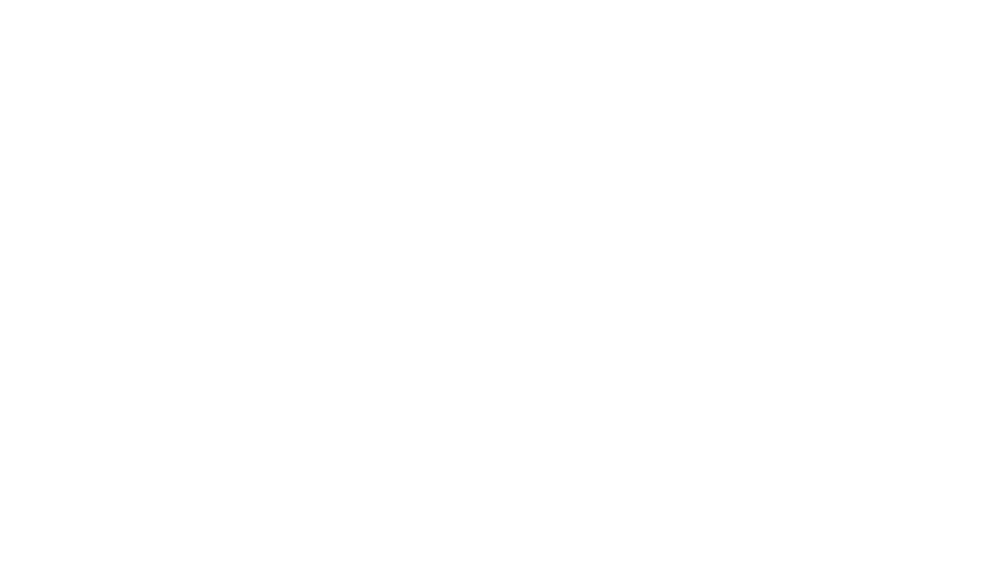

<IPython.core.display.Javascript object>


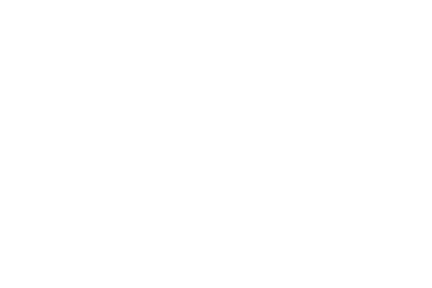

<IPython.core.display.Javascript object>


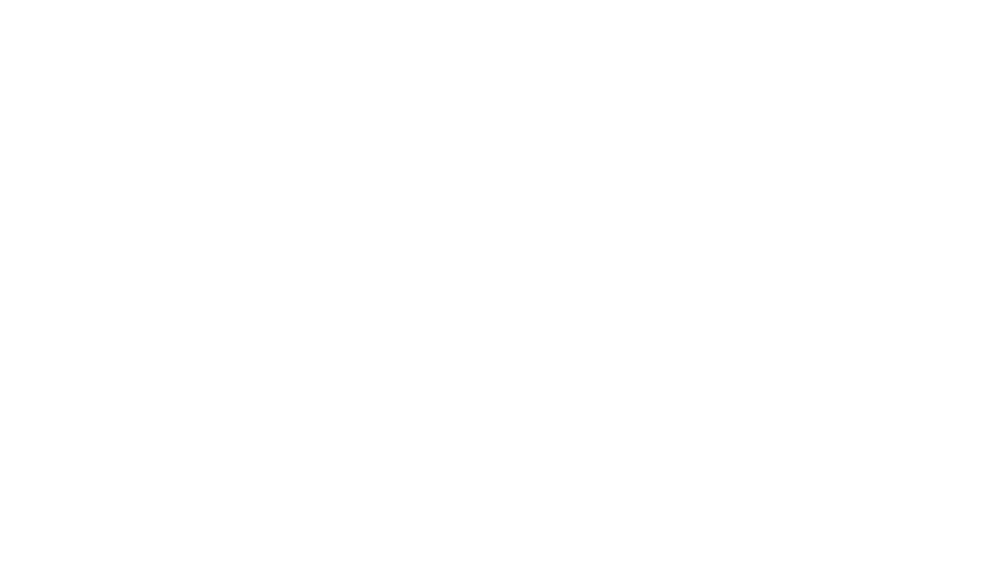

<IPython.core.display.Javascript object>


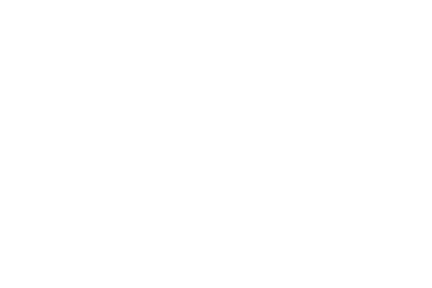

<IPython.core.display.Javascript object>


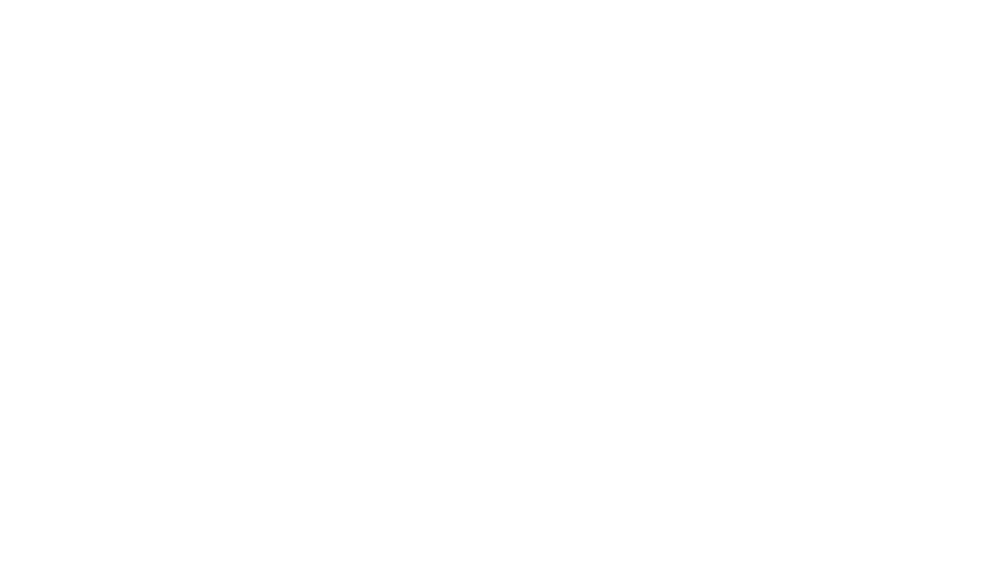

<IPython.core.display.Javascript object>


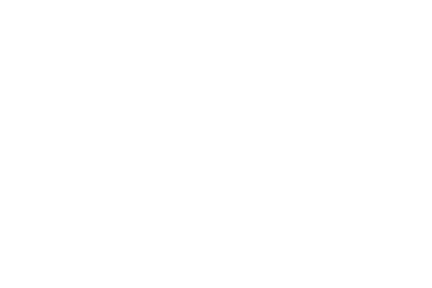

<IPython.core.display.Javascript object>


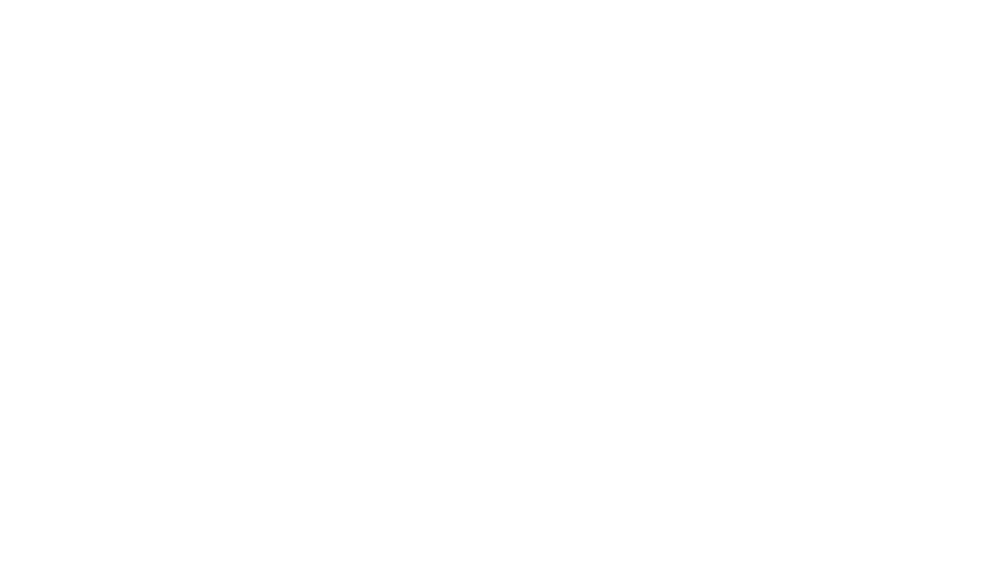

<IPython.core.display.Javascript object>


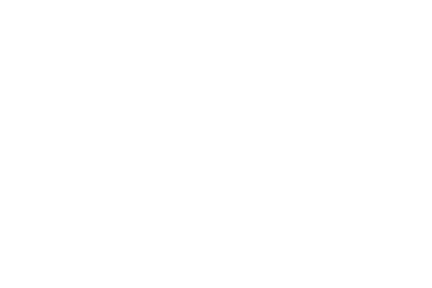

<IPython.core.display.Javascript object>


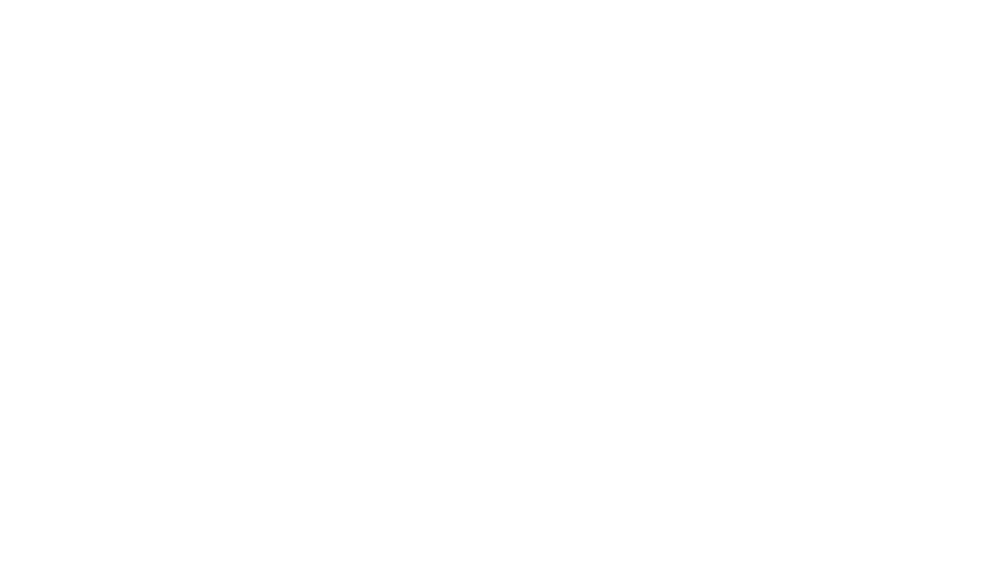

<IPython.core.display.Javascript object>


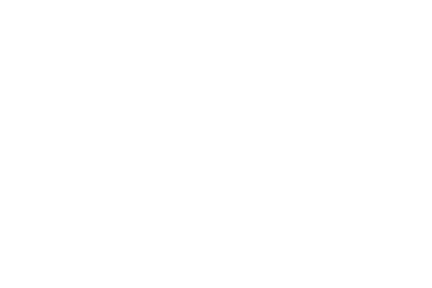

<IPython.core.display.Javascript object>


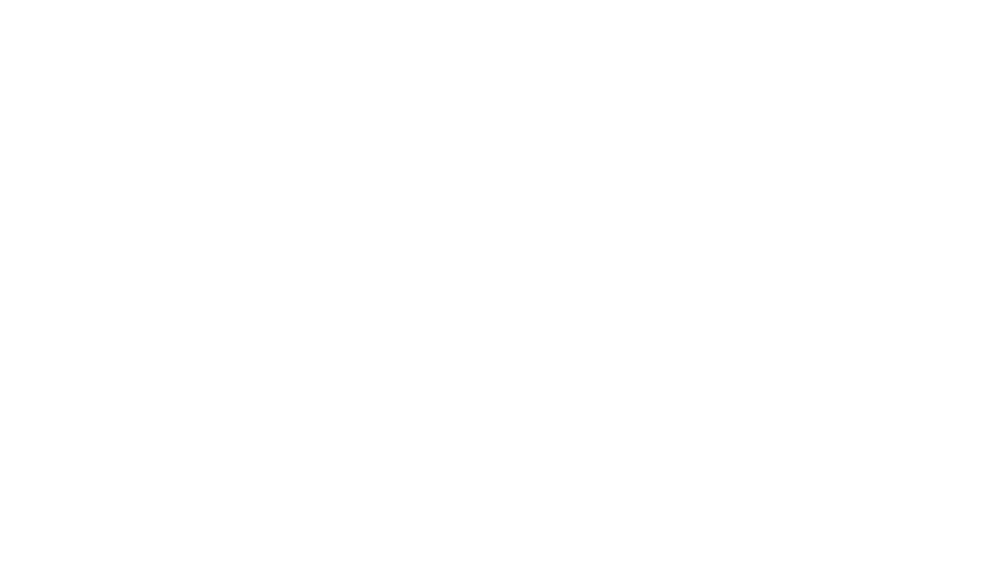

<IPython.core.display.Javascript object>


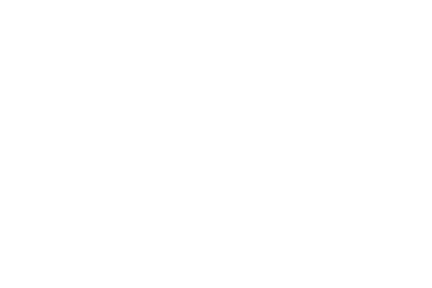

<IPython.core.display.Javascript object>


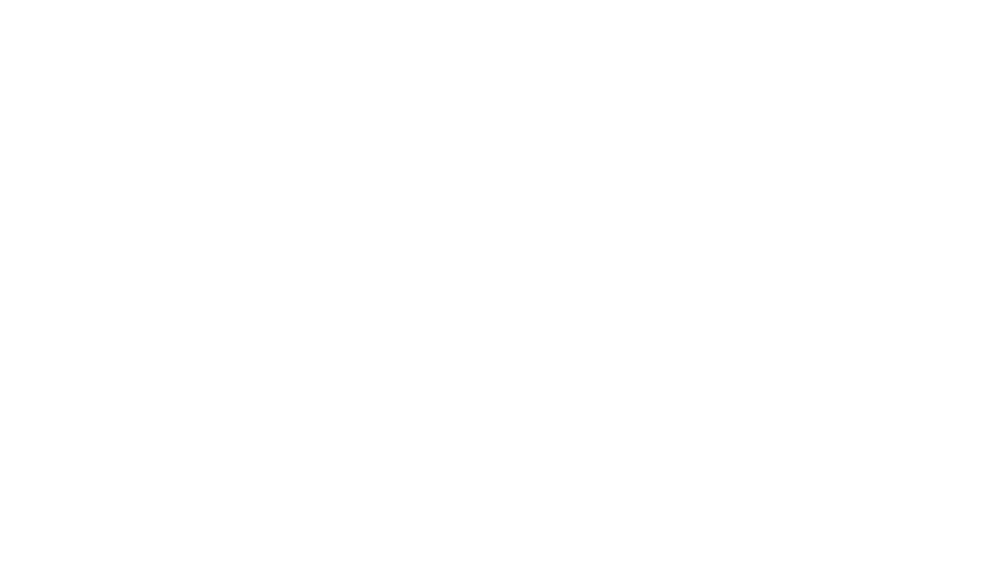

<IPython.core.display.Javascript object>


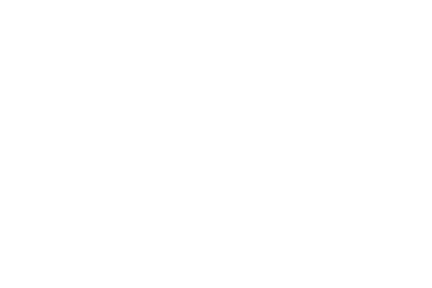

<IPython.core.display.Javascript object>


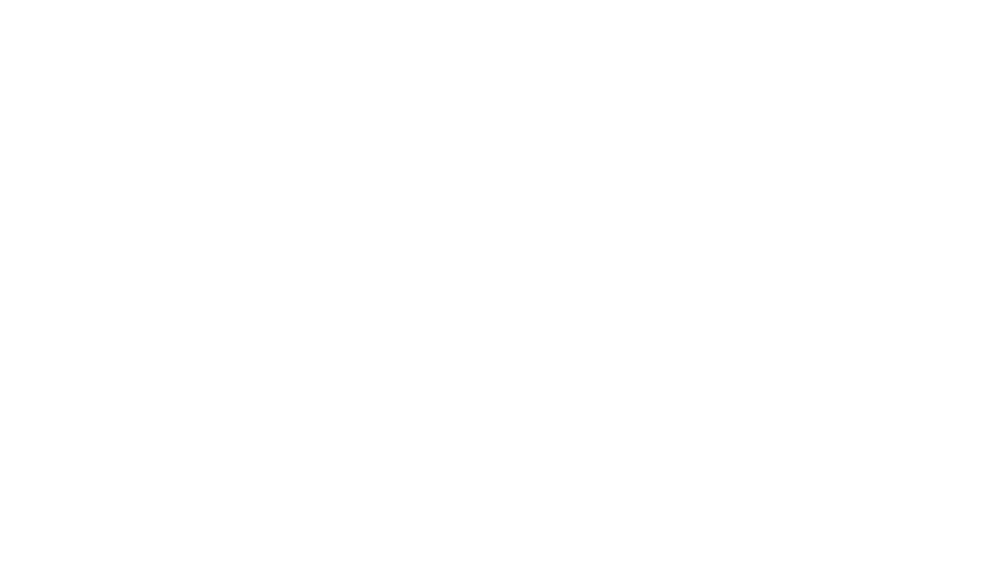

<IPython.core.display.Javascript object>


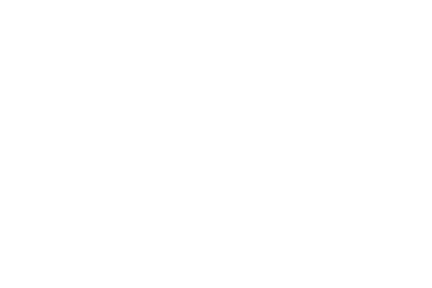

<IPython.core.display.Javascript object>


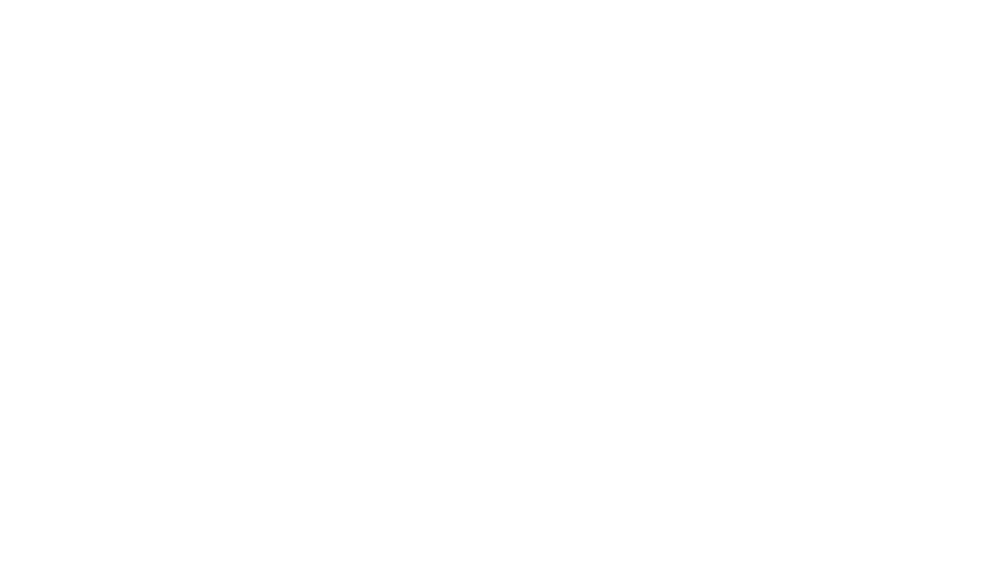

<IPython.core.display.Javascript object>


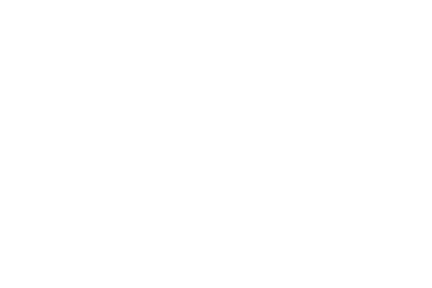

<IPython.core.display.Javascript object>


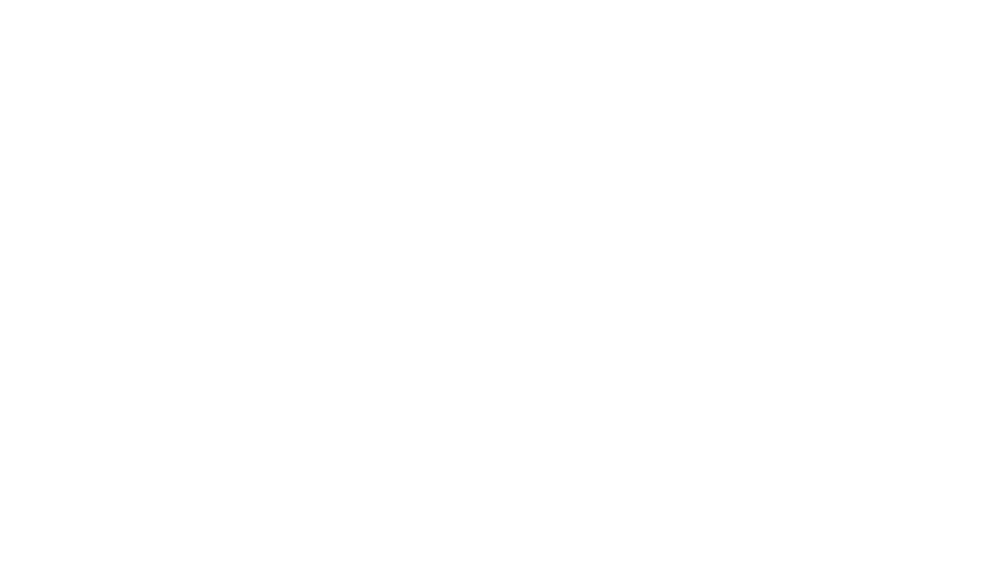

<IPython.core.display.Javascript object>


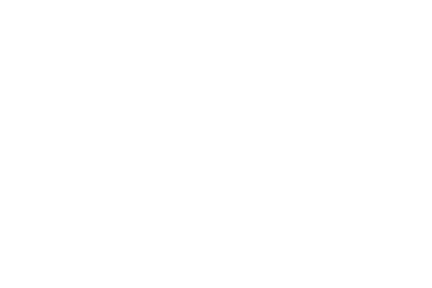

<IPython.core.display.Javascript object>


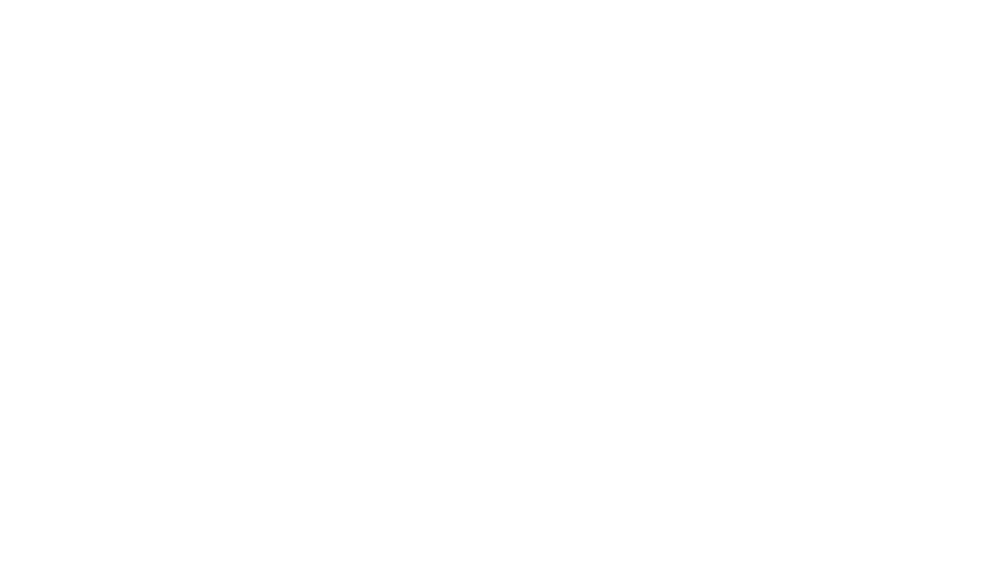

<IPython.core.display.Javascript object>


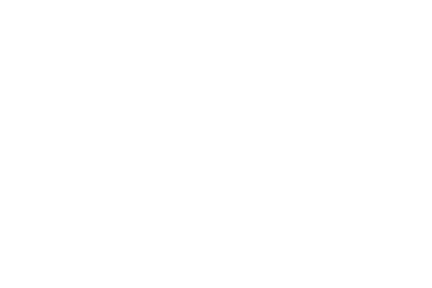

<IPython.core.display.Javascript object>


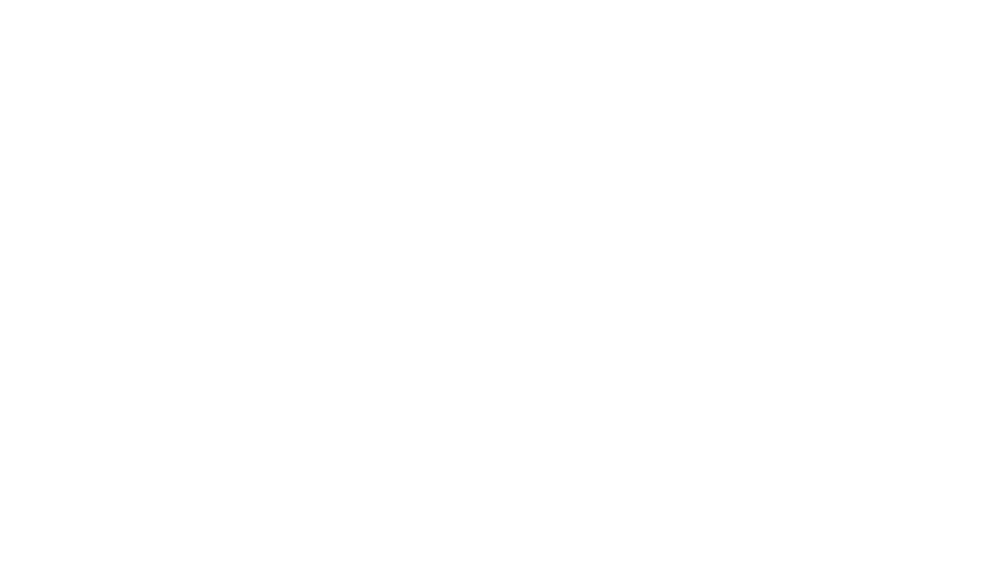

<IPython.core.display.Javascript object>


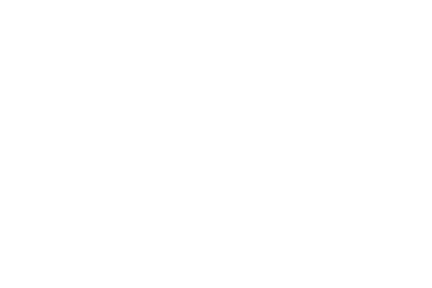

<IPython.core.display.Javascript object>


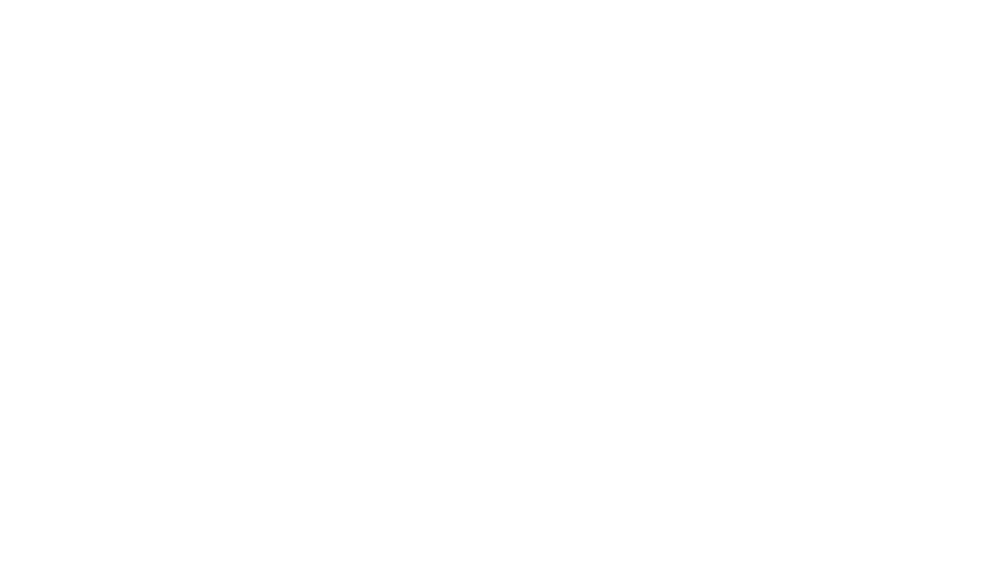

<IPython.core.display.Javascript object>


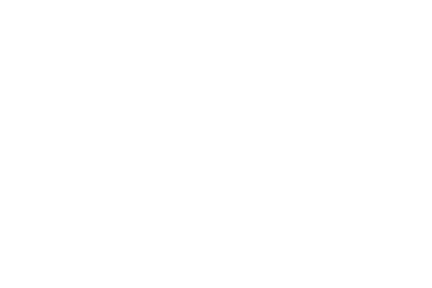

<IPython.core.display.Javascript object>


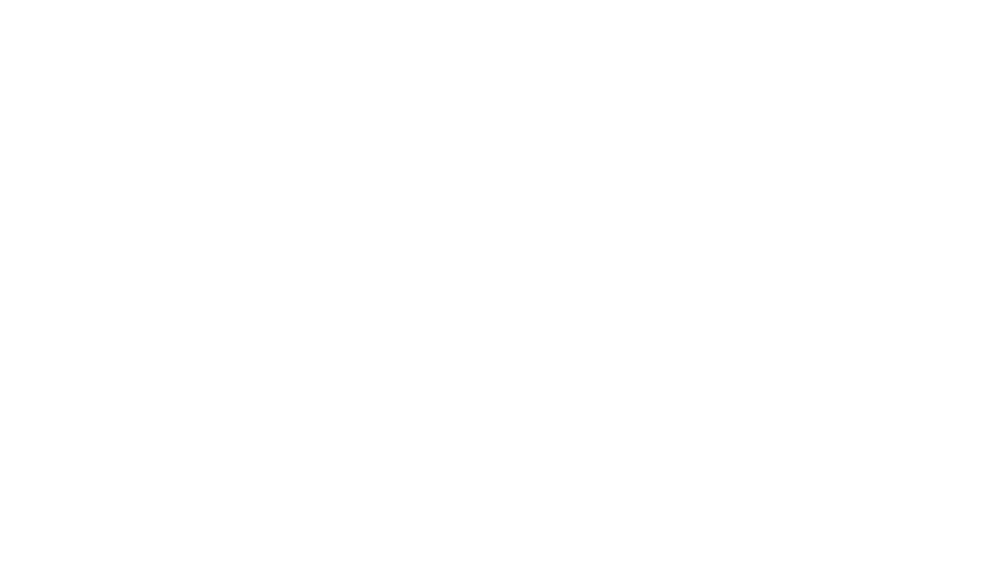

<IPython.core.display.Javascript object>


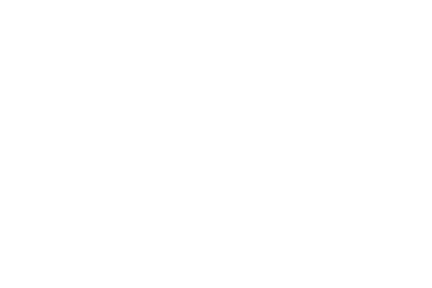

<IPython.core.display.Javascript object>


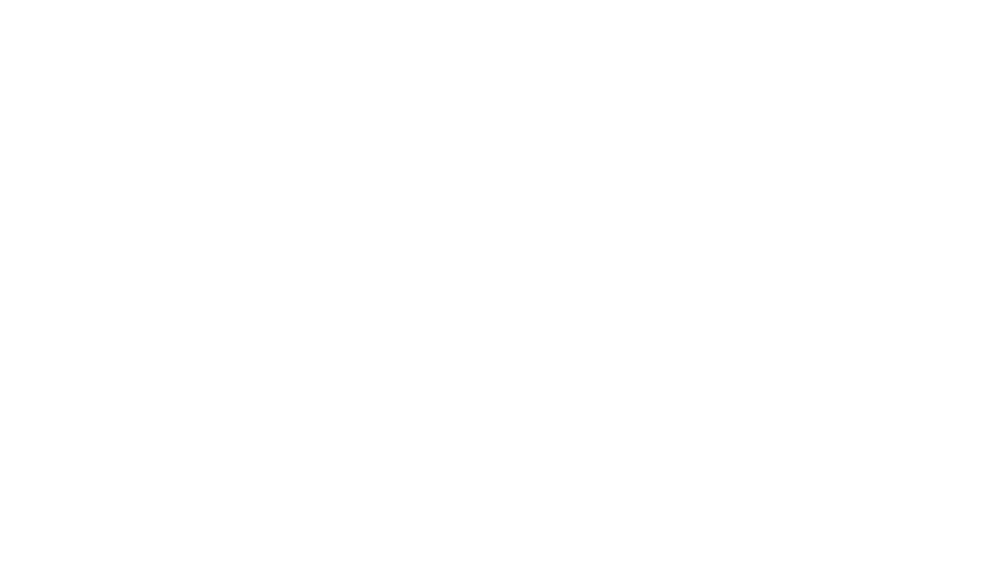

<IPython.core.display.Javascript object>


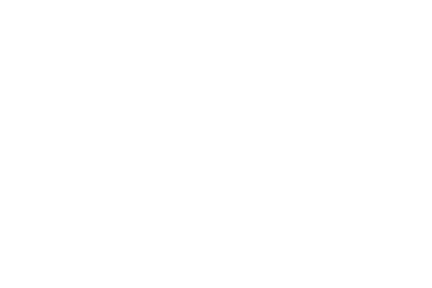

<IPython.core.display.Javascript object>


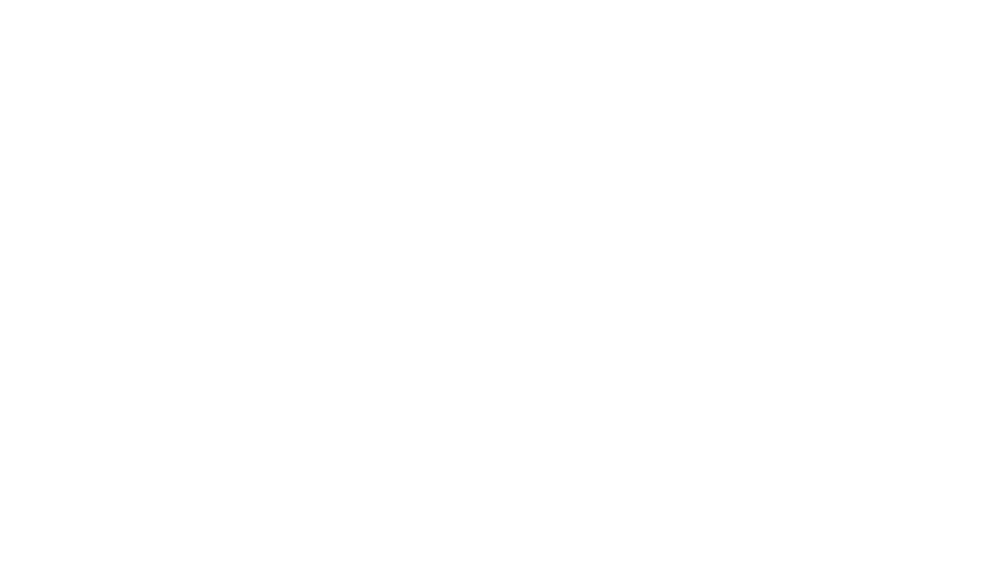

<IPython.core.display.Javascript object>


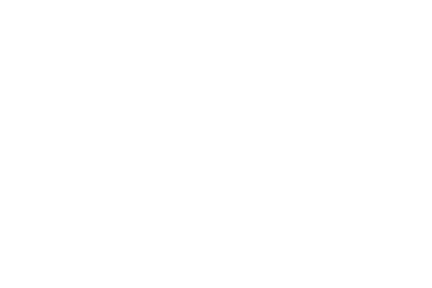

<IPython.core.display.Javascript object>


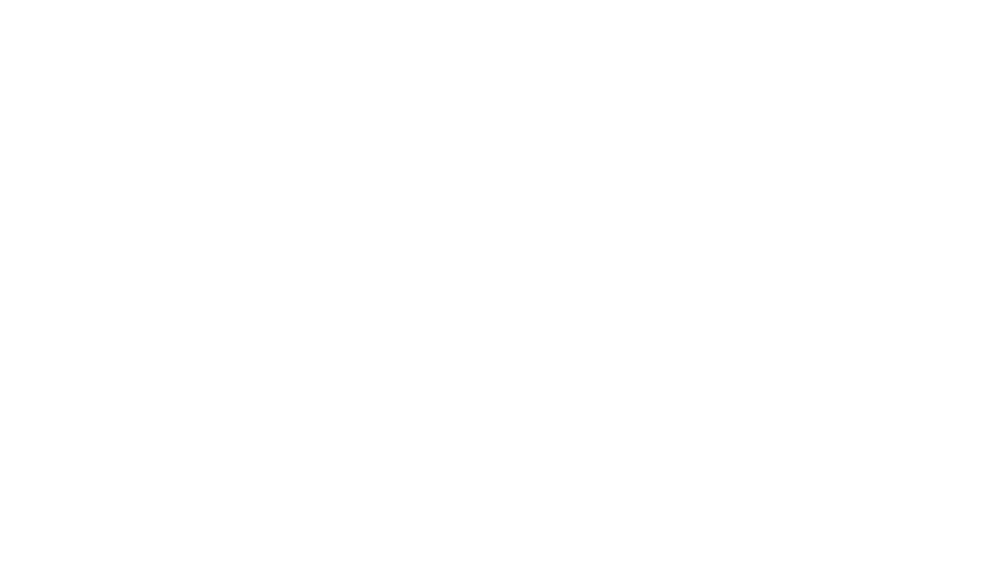

<IPython.core.display.Javascript object>


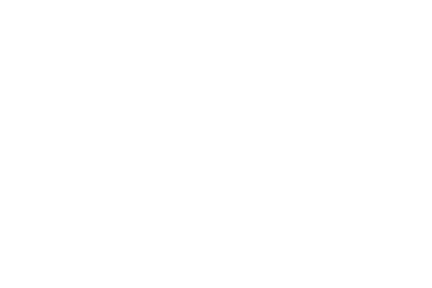

<IPython.core.display.Javascript object>


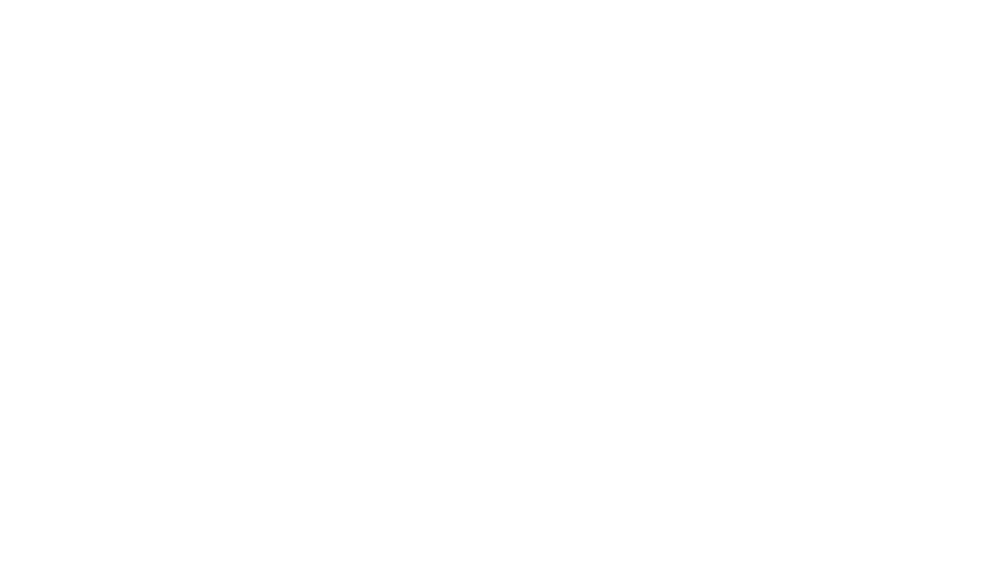

<IPython.core.display.Javascript object>


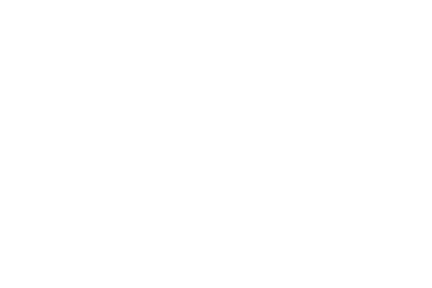

<IPython.core.display.Javascript object>


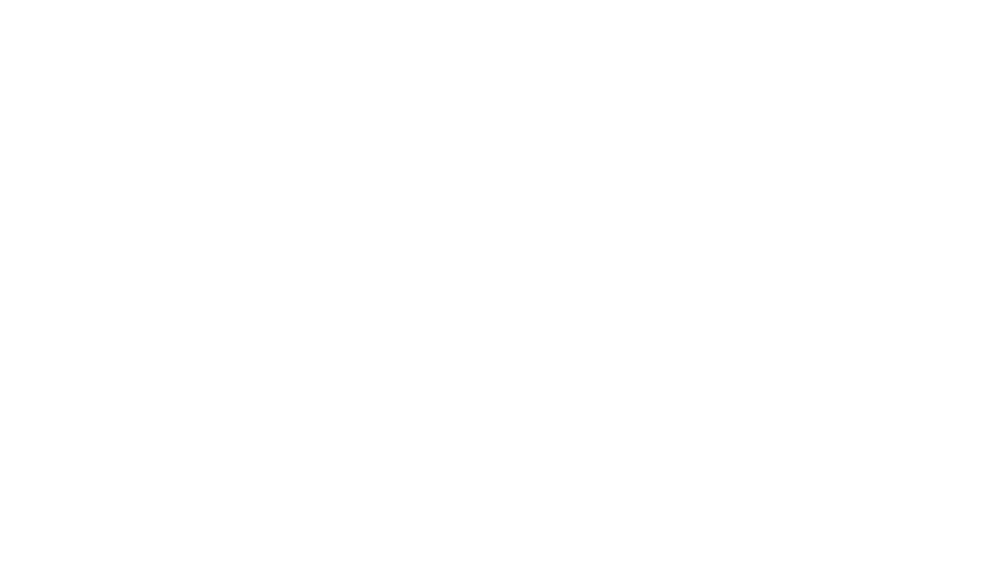

<IPython.core.display.Javascript object>


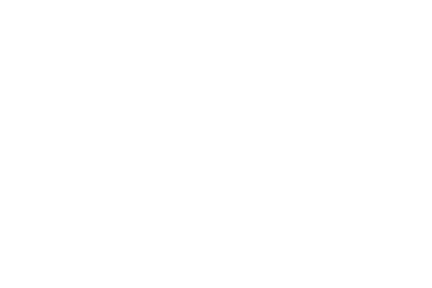

<IPython.core.display.Javascript object>


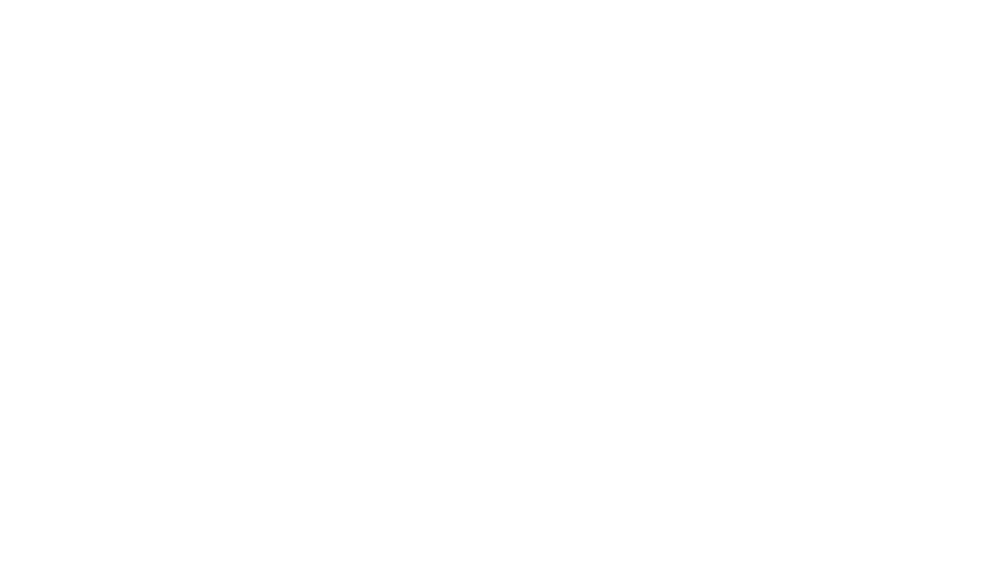

<IPython.core.display.Javascript object>


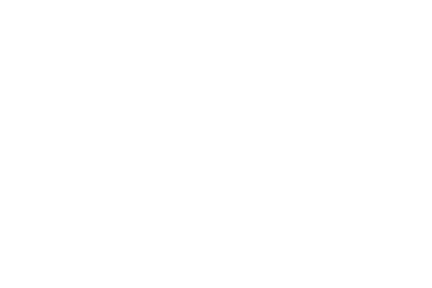

<IPython.core.display.Javascript object>


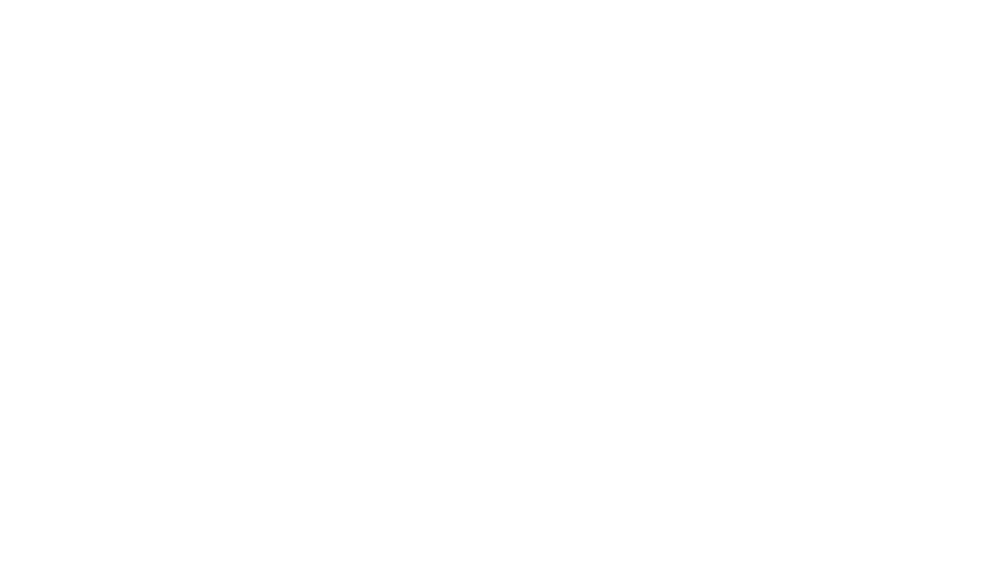

<IPython.core.display.Javascript object>


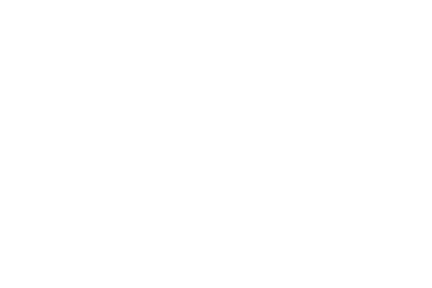

<IPython.core.display.Javascript object>


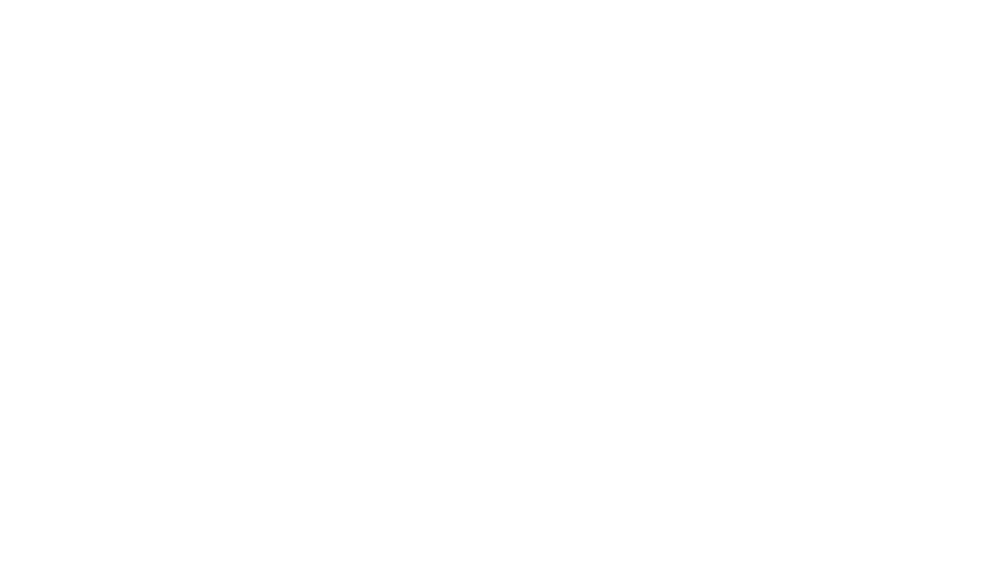

<IPython.core.display.Javascript object>


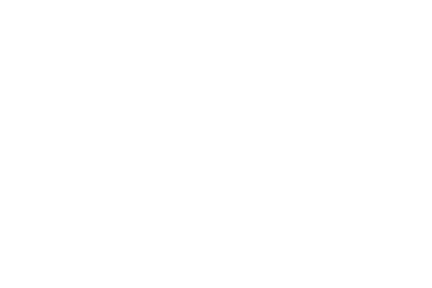

<IPython.core.display.Javascript object>


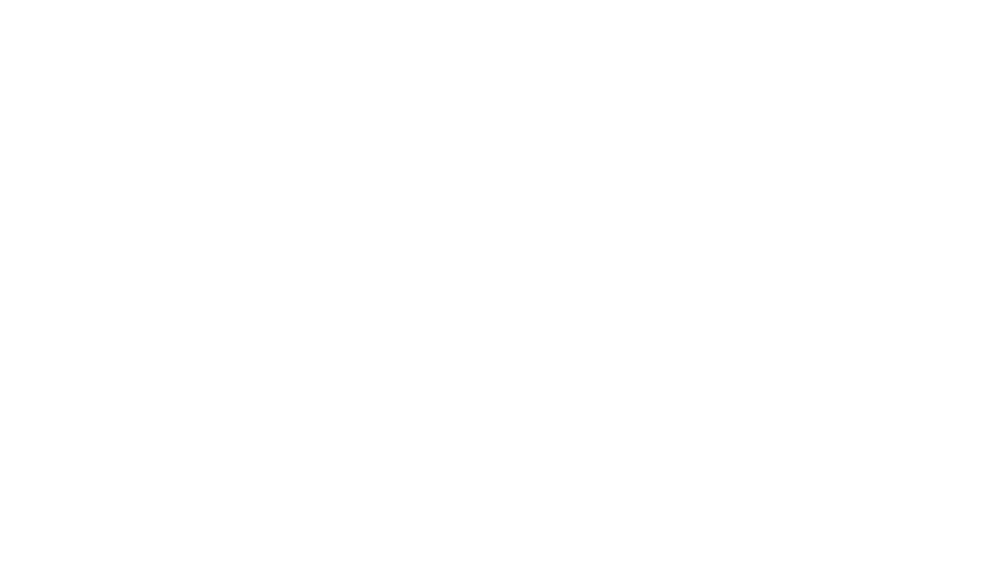

<IPython.core.display.Javascript object>


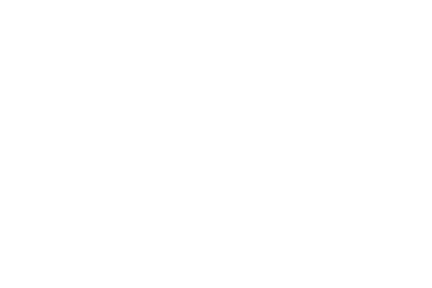

<IPython.core.display.Javascript object>


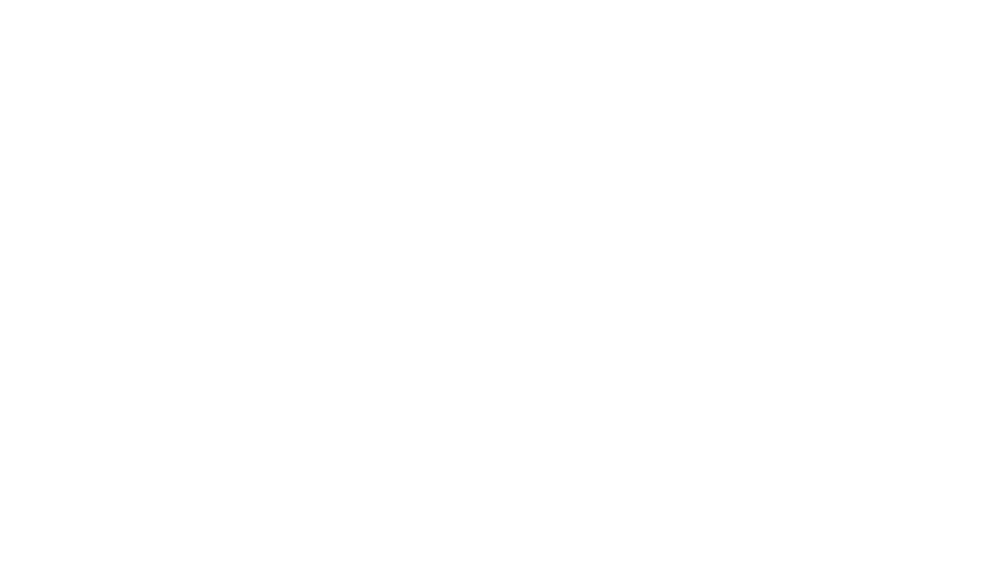

<IPython.core.display.Javascript object>


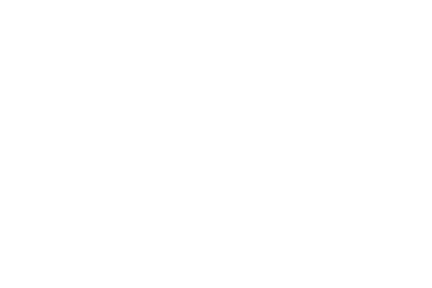

<IPython.core.display.Javascript object>


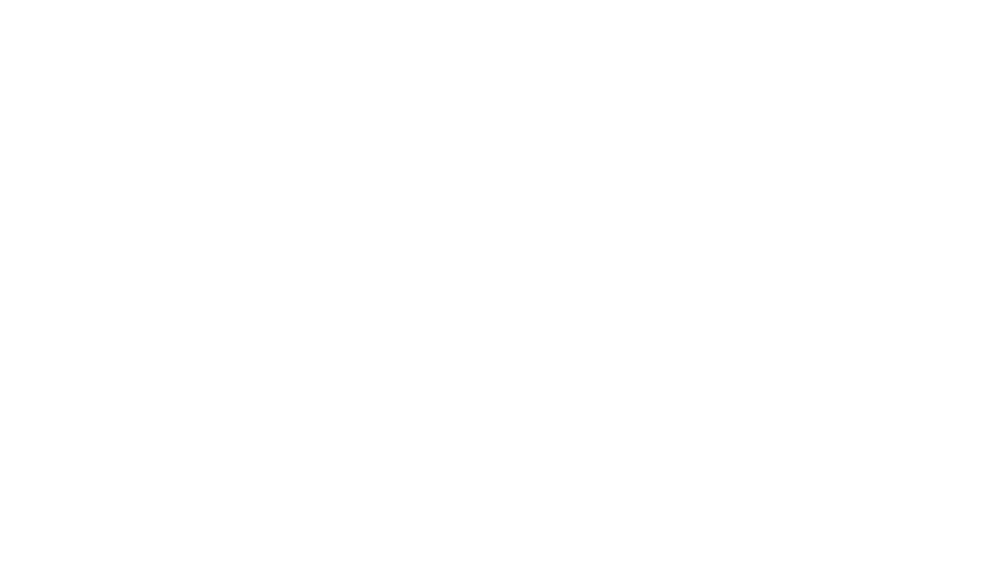

<IPython.core.display.Javascript object>


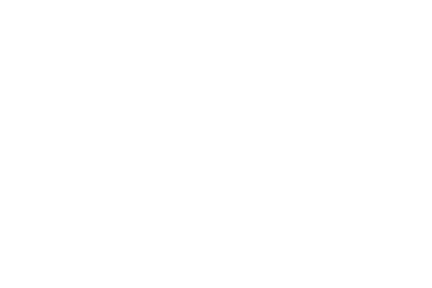

<IPython.core.display.Javascript object>


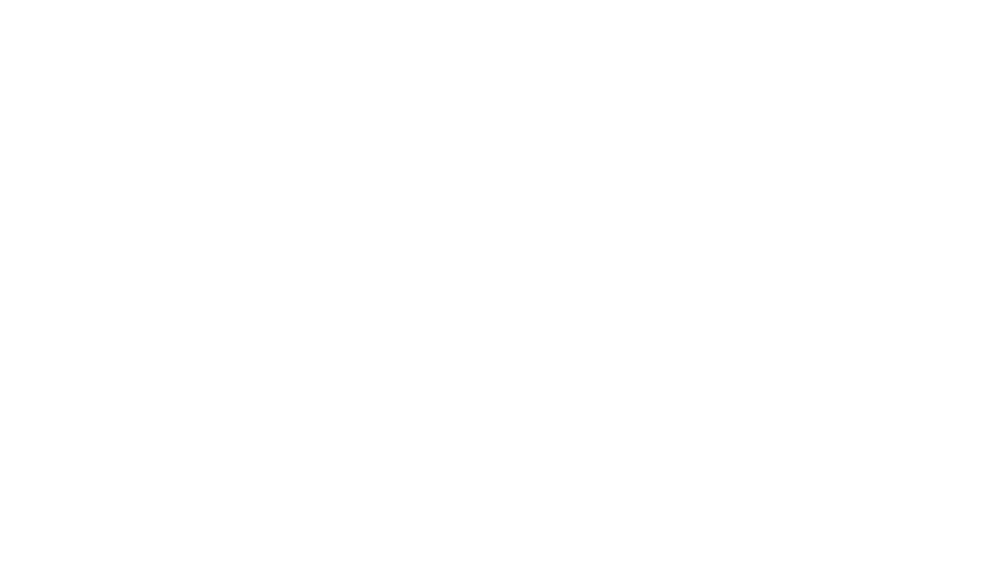

<IPython.core.display.Javascript object>


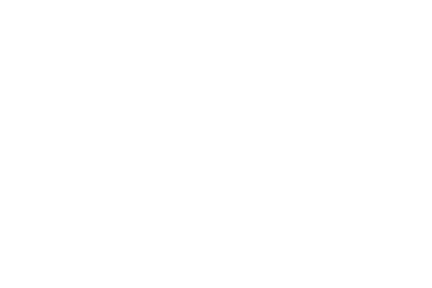

<IPython.core.display.Javascript object>


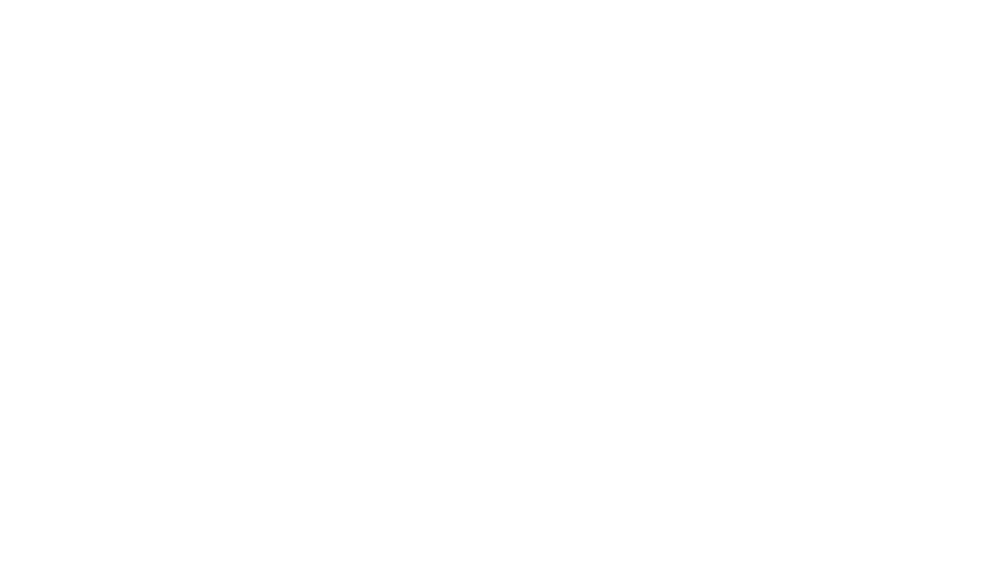

<IPython.core.display.Javascript object>


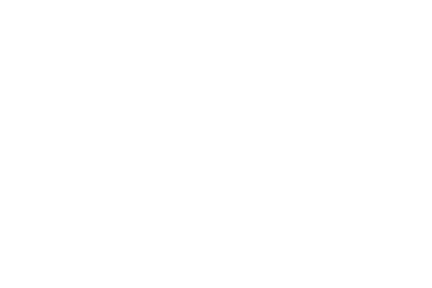

<IPython.core.display.Javascript object>


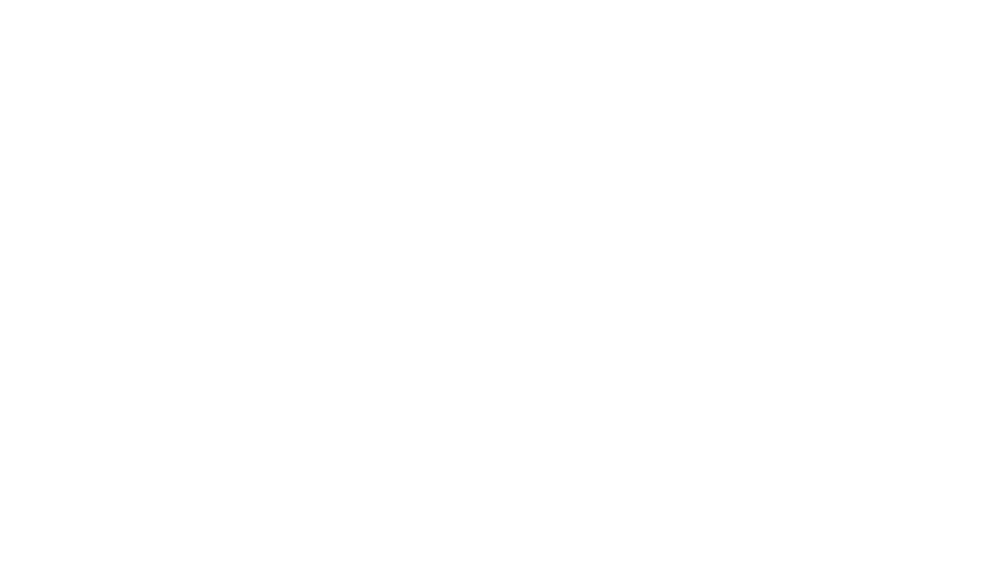

<IPython.core.display.Javascript object>


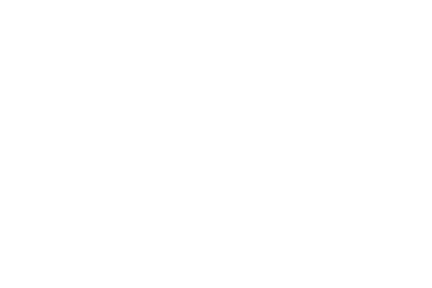

<IPython.core.display.Javascript object>


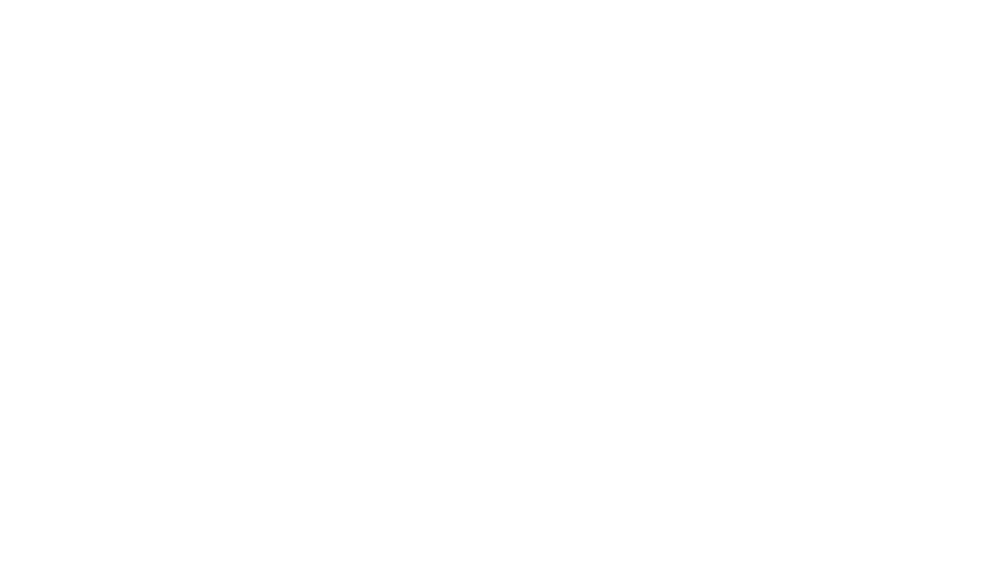

<IPython.core.display.Javascript object>


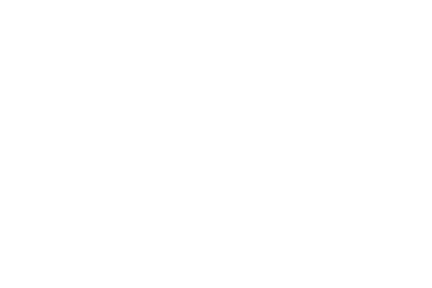

<IPython.core.display.Javascript object>


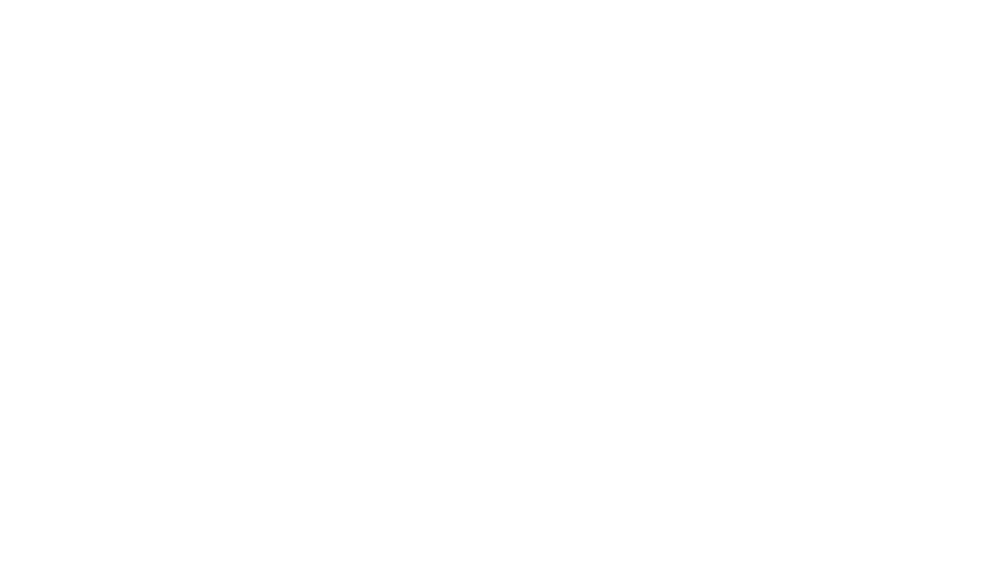

<IPython.core.display.Javascript object>


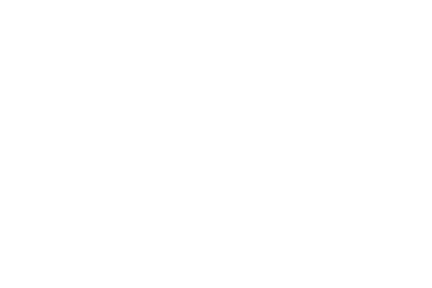

<IPython.core.display.Javascript object>


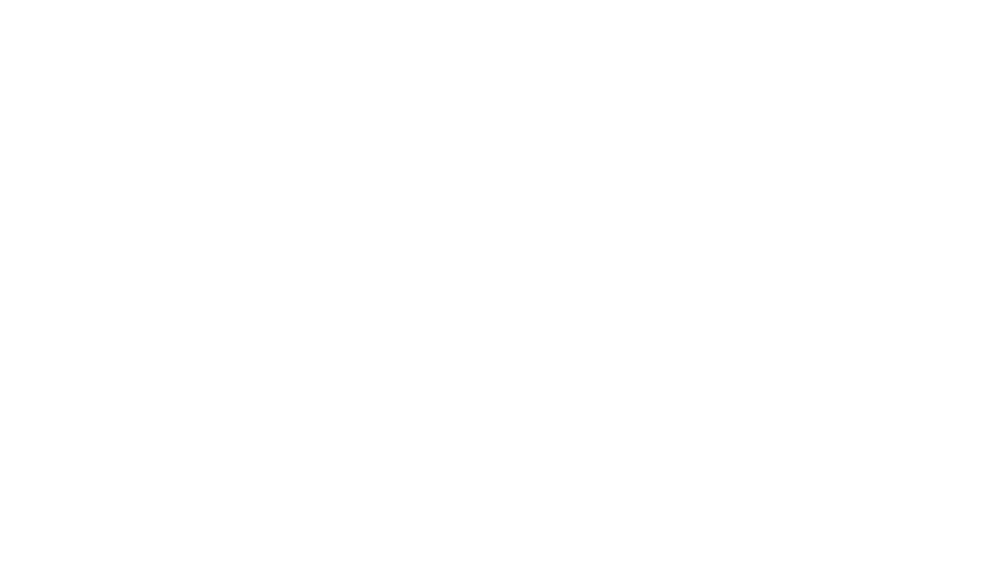

<IPython.core.display.Javascript object>


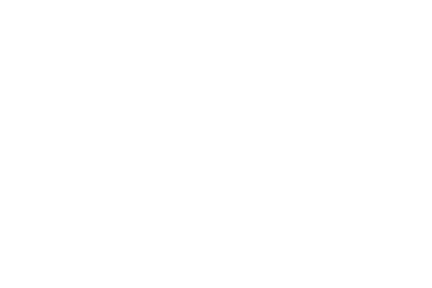

<IPython.core.display.Javascript object>


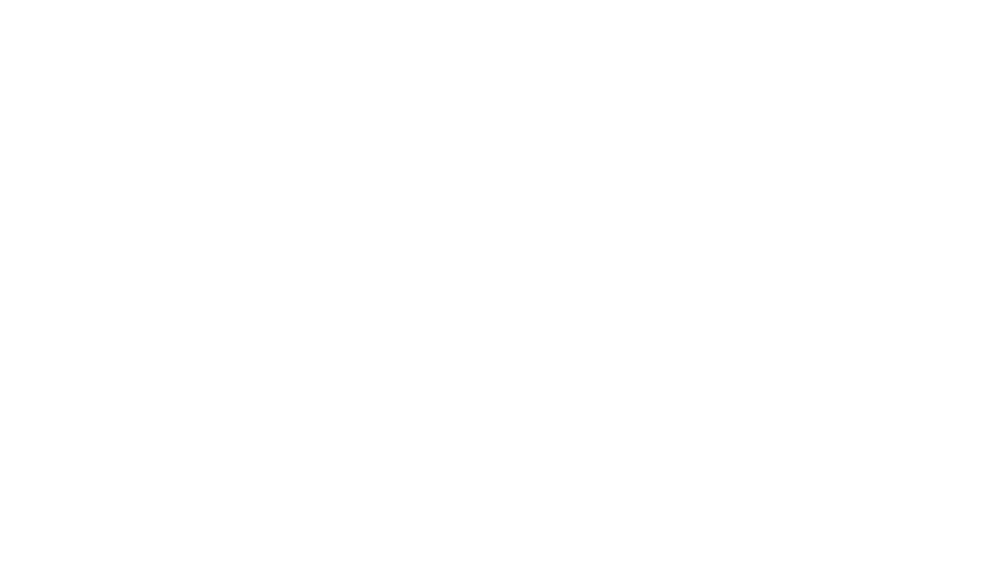

<IPython.core.display.Javascript object>


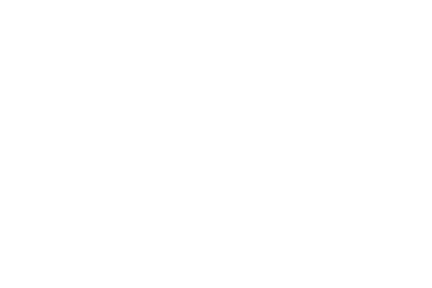

<IPython.core.display.Javascript object>


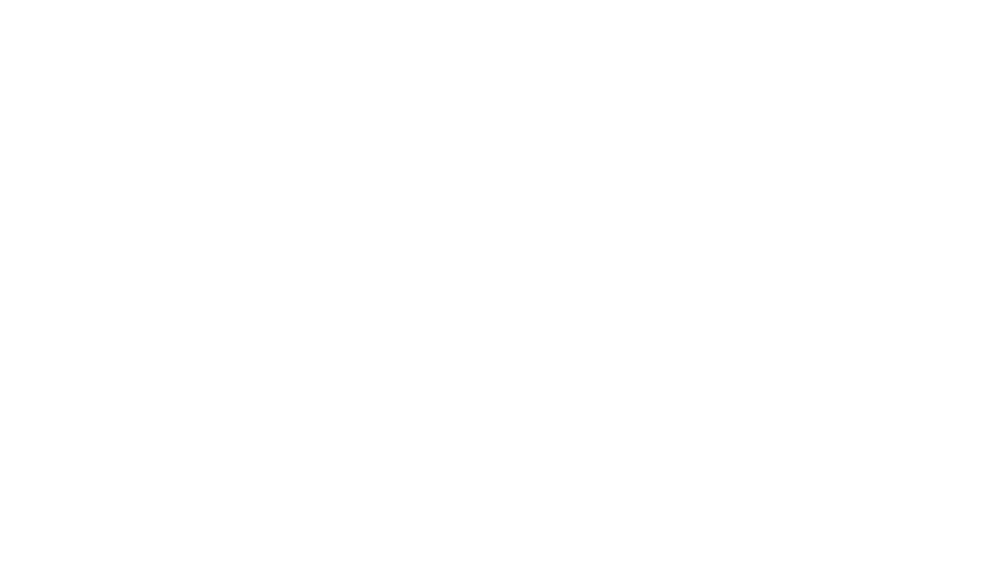

<IPython.core.display.Javascript object>


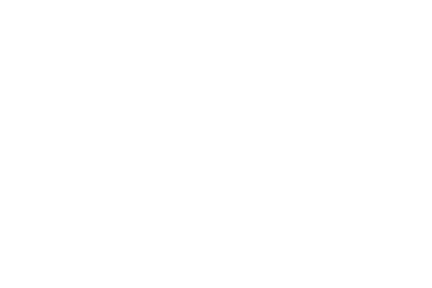

<IPython.core.display.Javascript object>


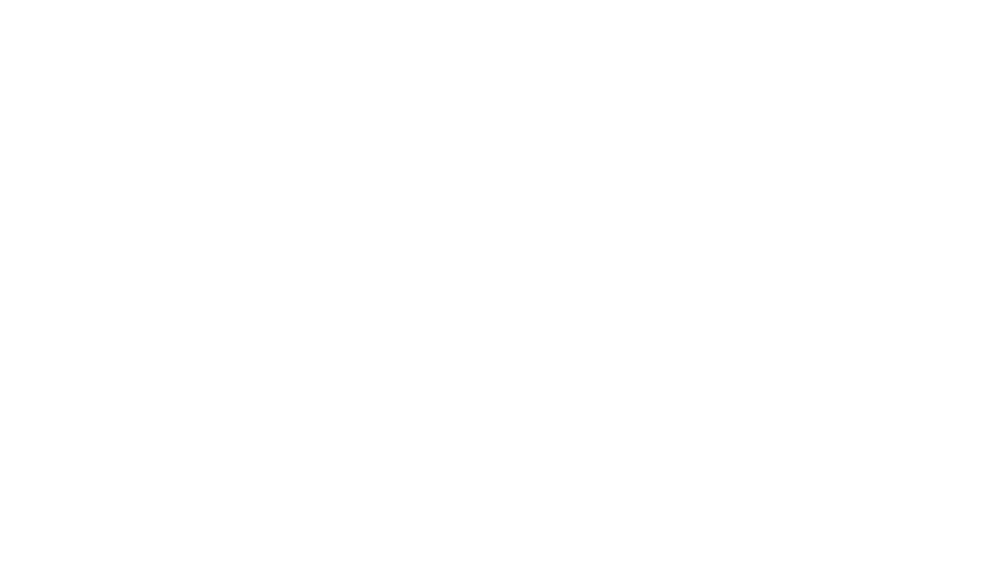

<IPython.core.display.Javascript object>


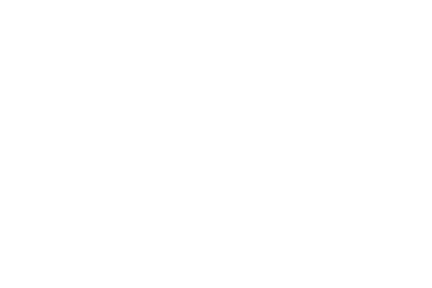

<IPython.core.display.Javascript object>


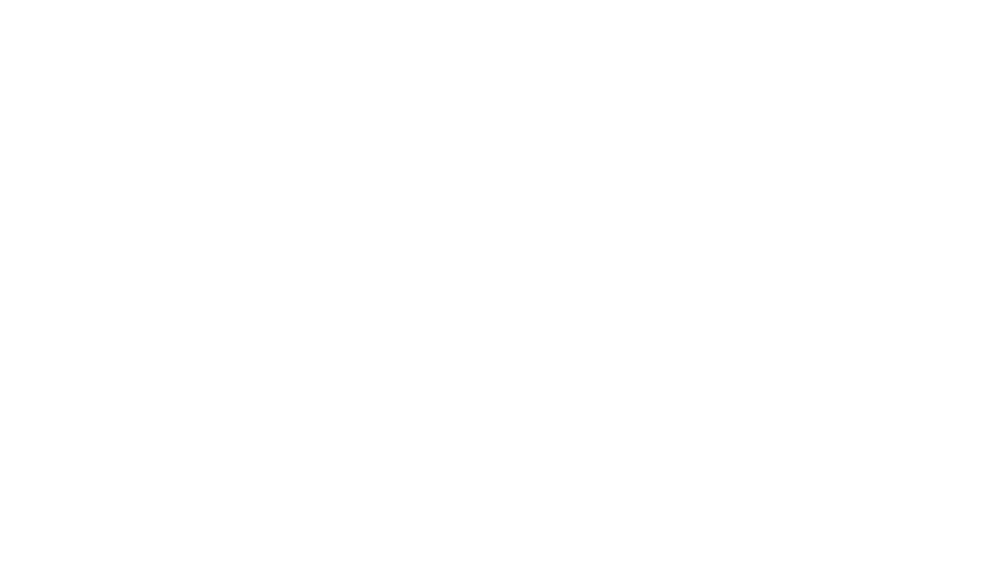

<IPython.core.display.Javascript object>


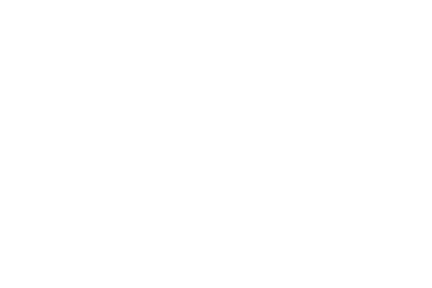

<IPython.core.display.Javascript object>


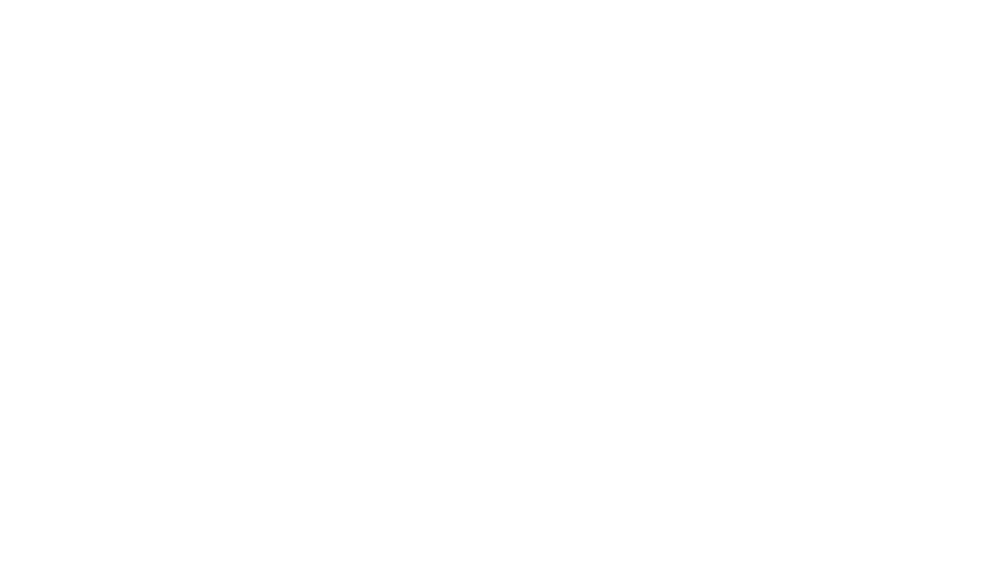

<IPython.core.display.Javascript object>


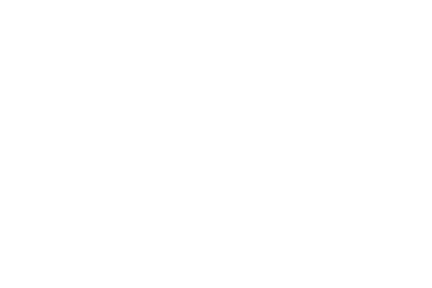

<IPython.core.display.Javascript object>


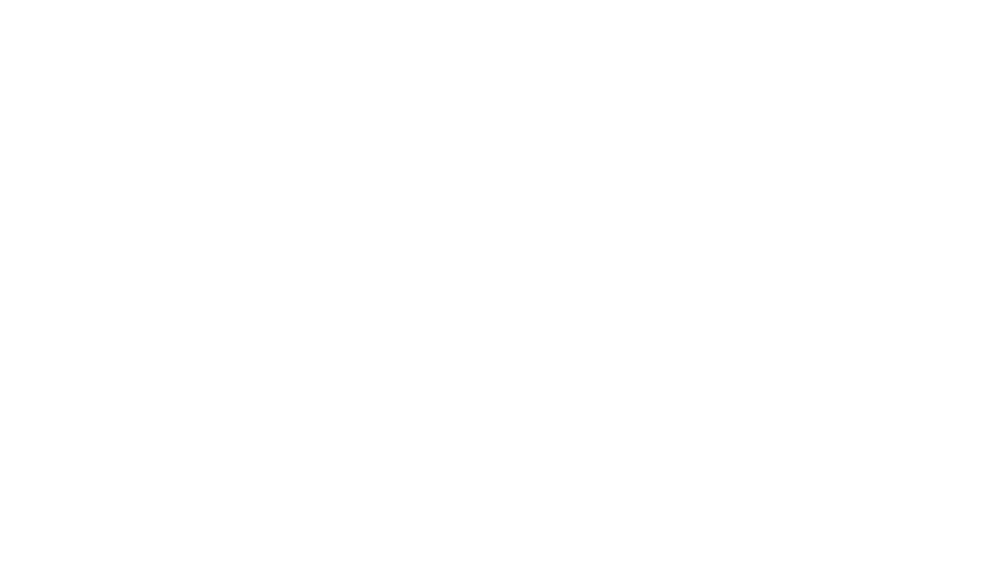

<IPython.core.display.Javascript object>


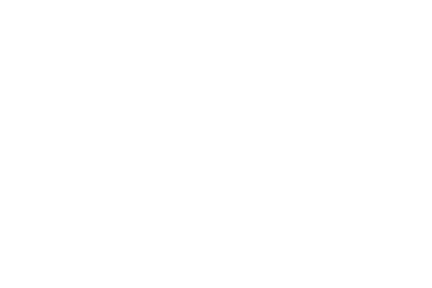

<IPython.core.display.Javascript object>


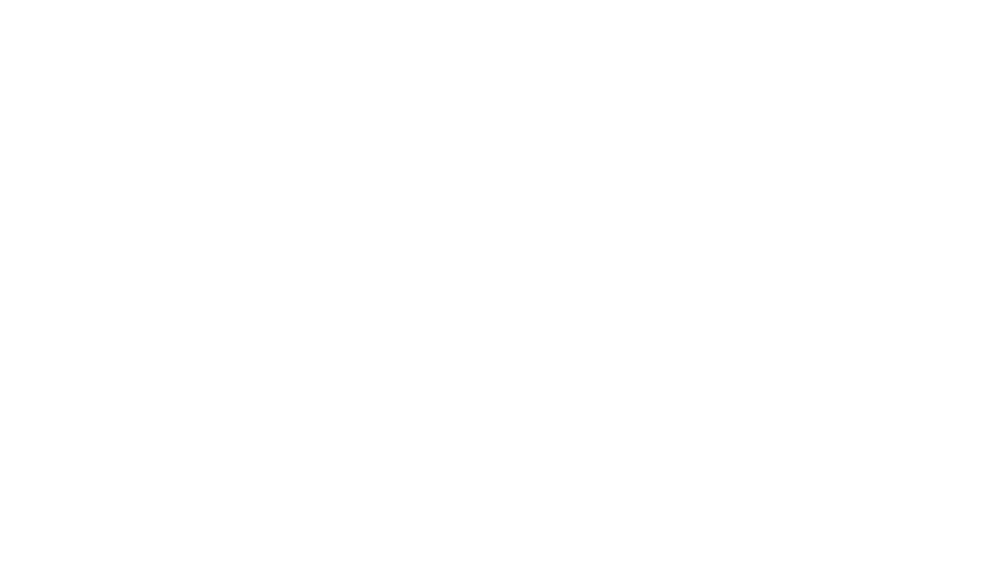

<IPython.core.display.Javascript object>


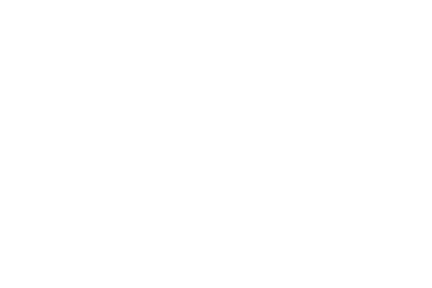

<IPython.core.display.Javascript object>


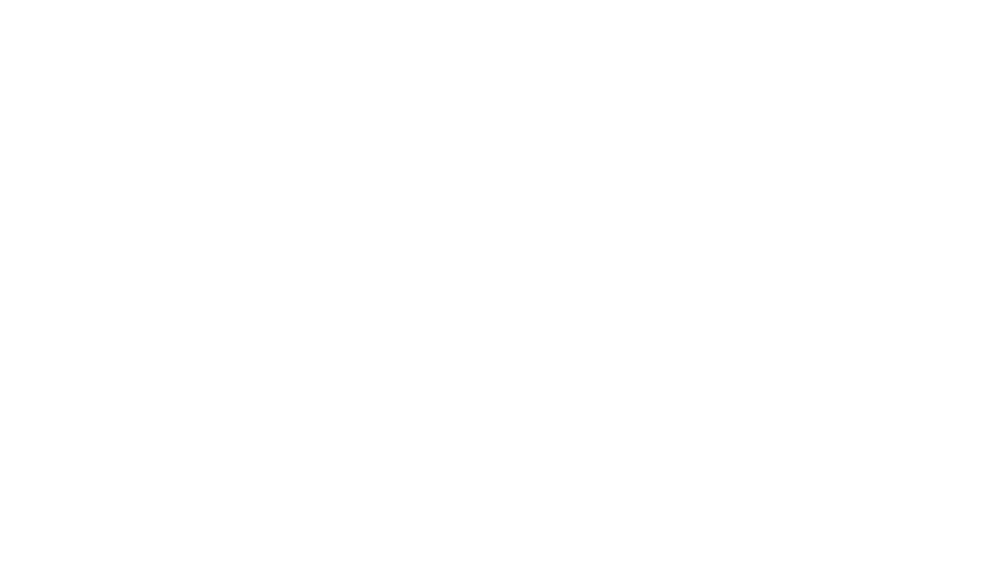

<IPython.core.display.Javascript object>


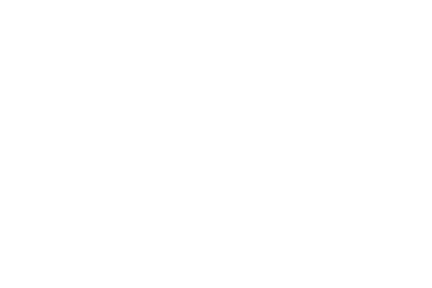

<IPython.core.display.Javascript object>


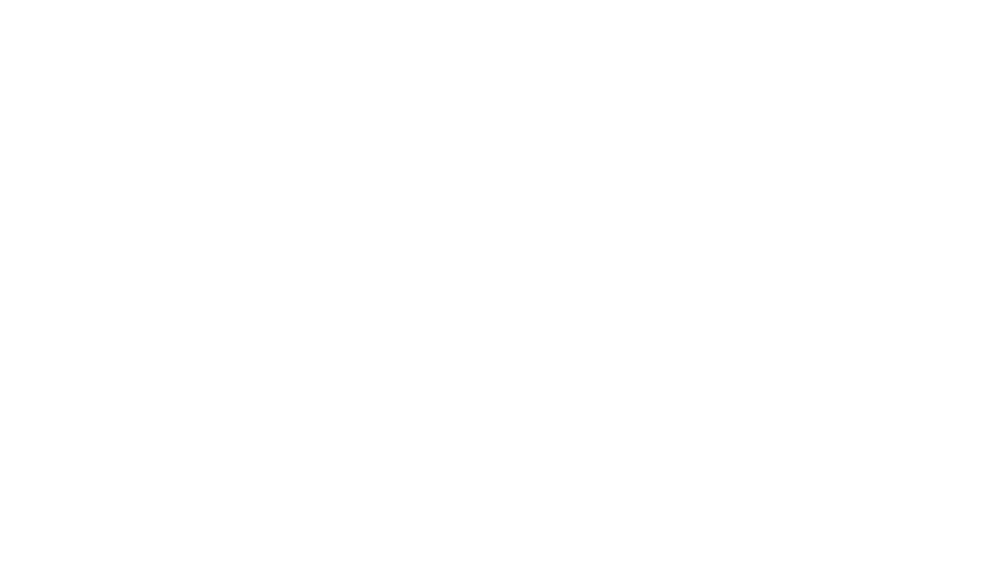

<IPython.core.display.Javascript object>


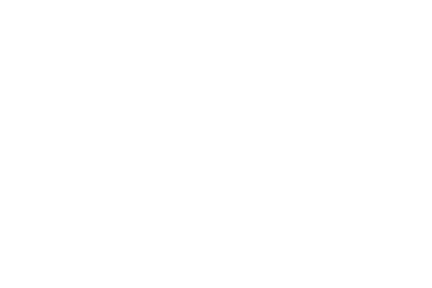

<IPython.core.display.Javascript object>


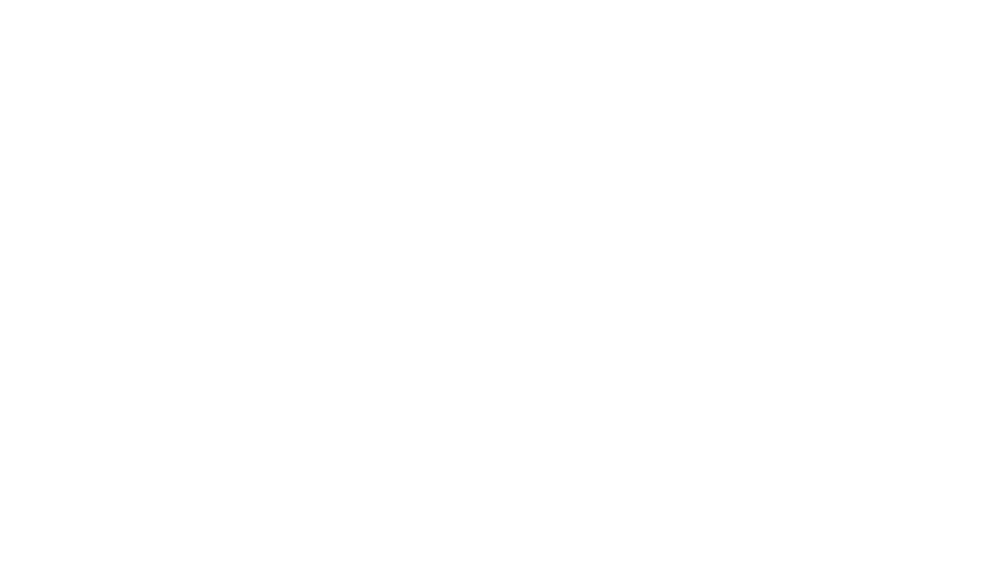

<IPython.core.display.Javascript object>


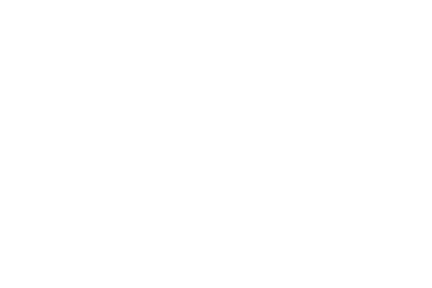

<IPython.core.display.Javascript object>


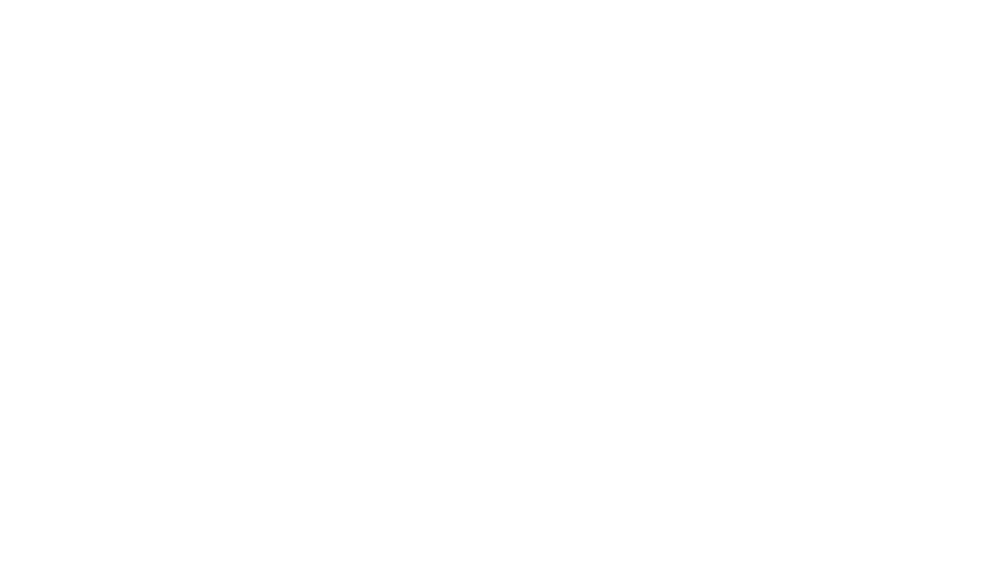

<IPython.core.display.Javascript object>


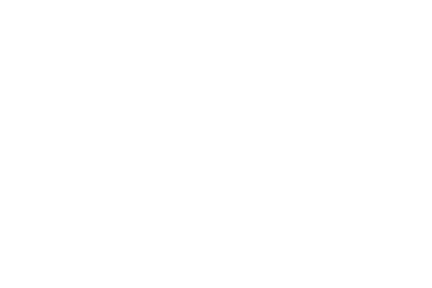

<IPython.core.display.Javascript object>


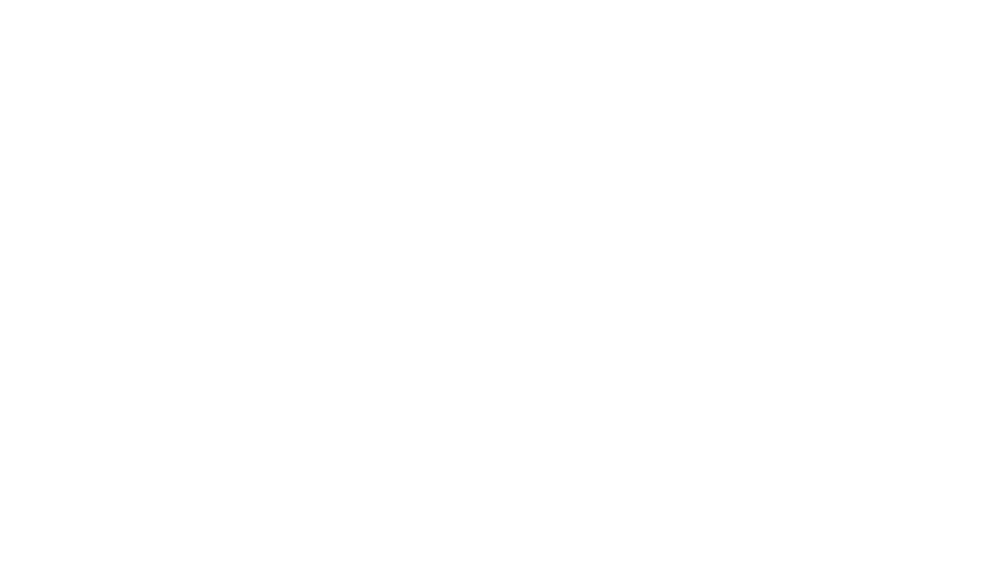

<IPython.core.display.Javascript object>


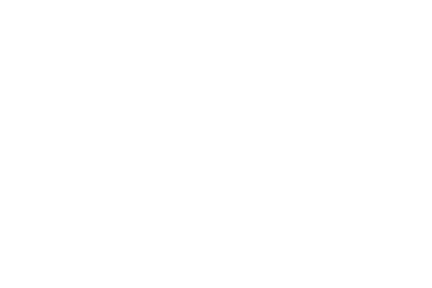

<IPython.core.display.Javascript object>


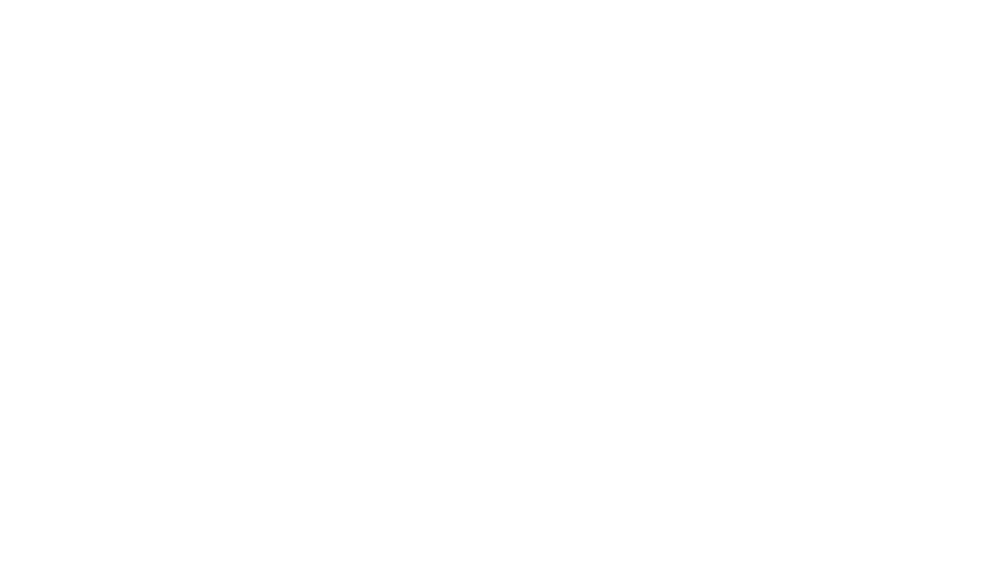

<IPython.core.display.Javascript object>


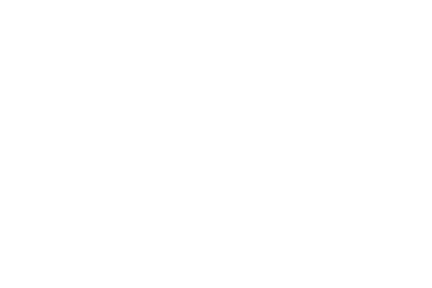

<IPython.core.display.Javascript object>


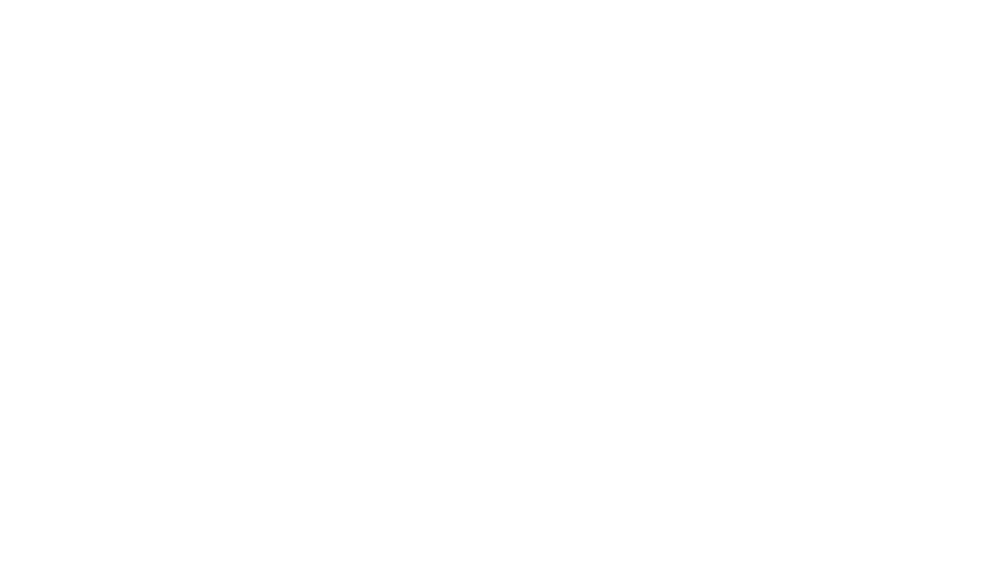

<IPython.core.display.Javascript object>


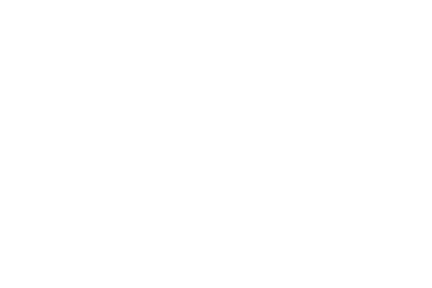

<IPython.core.display.Javascript object>


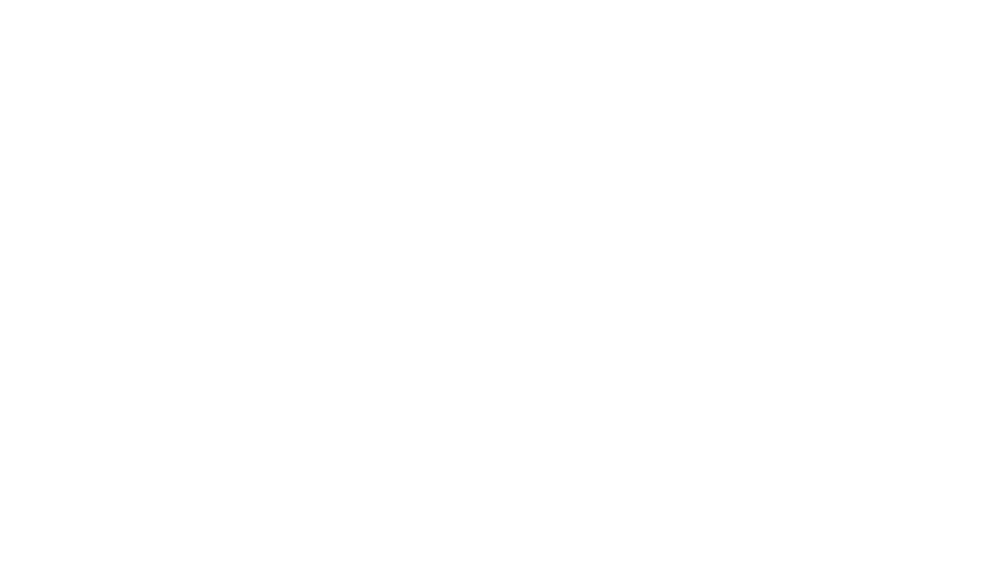

<IPython.core.display.Javascript object>


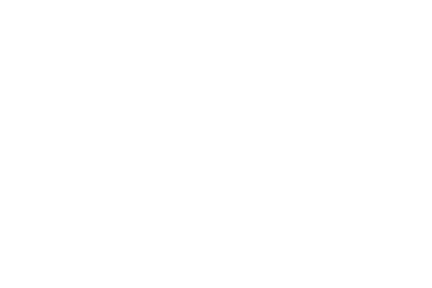

<IPython.core.display.Javascript object>


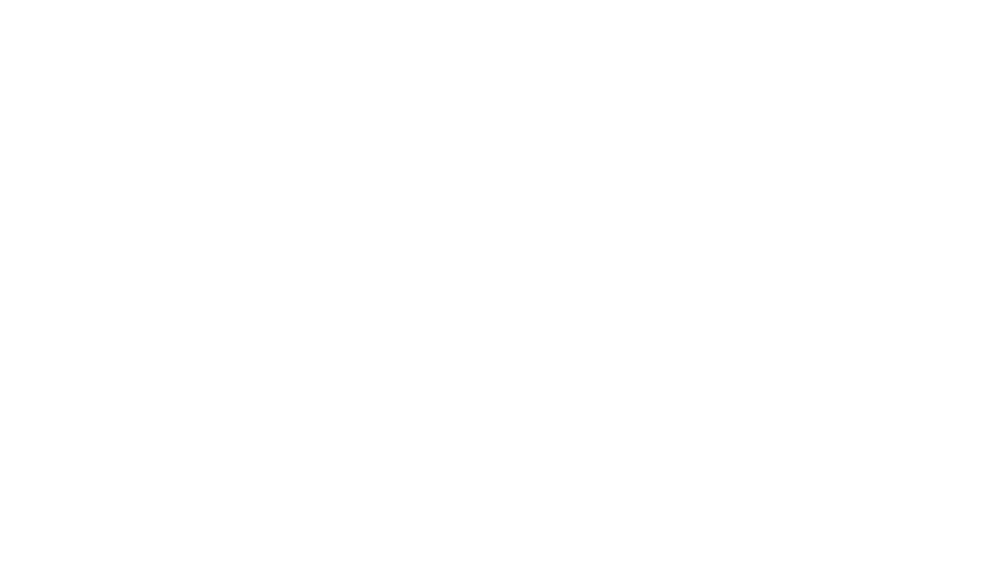

<IPython.core.display.Javascript object>


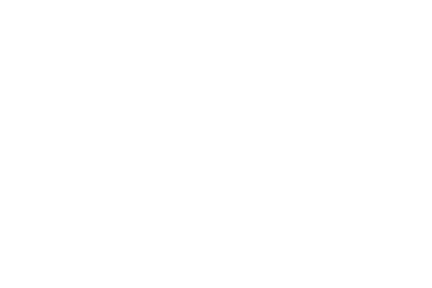

<IPython.core.display.Javascript object>


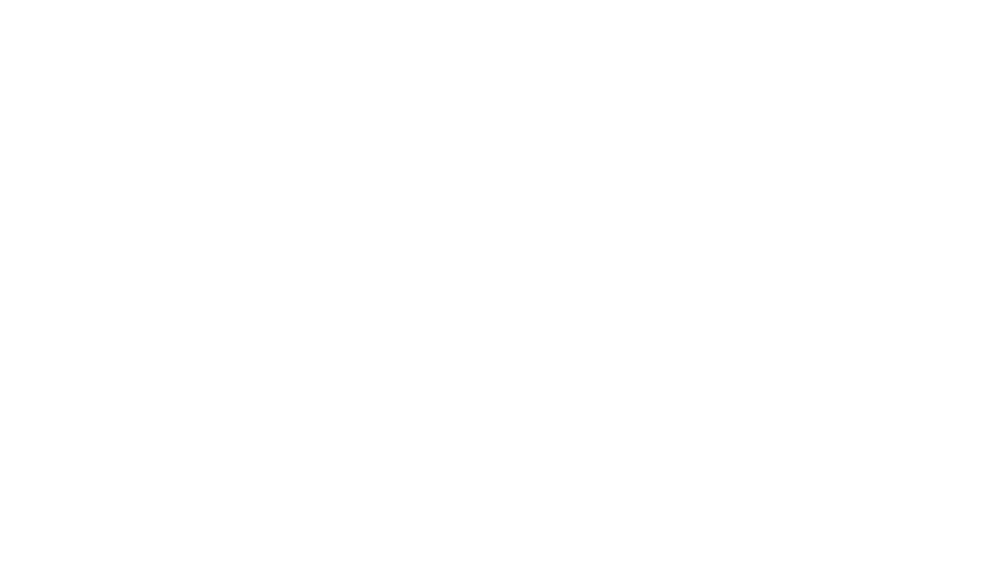

<IPython.core.display.Javascript object>


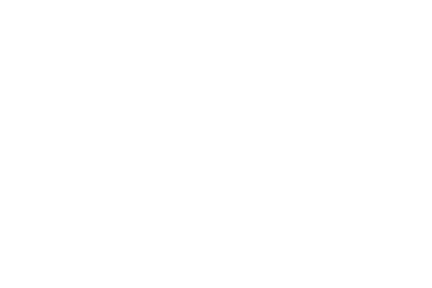

<IPython.core.display.Javascript object>


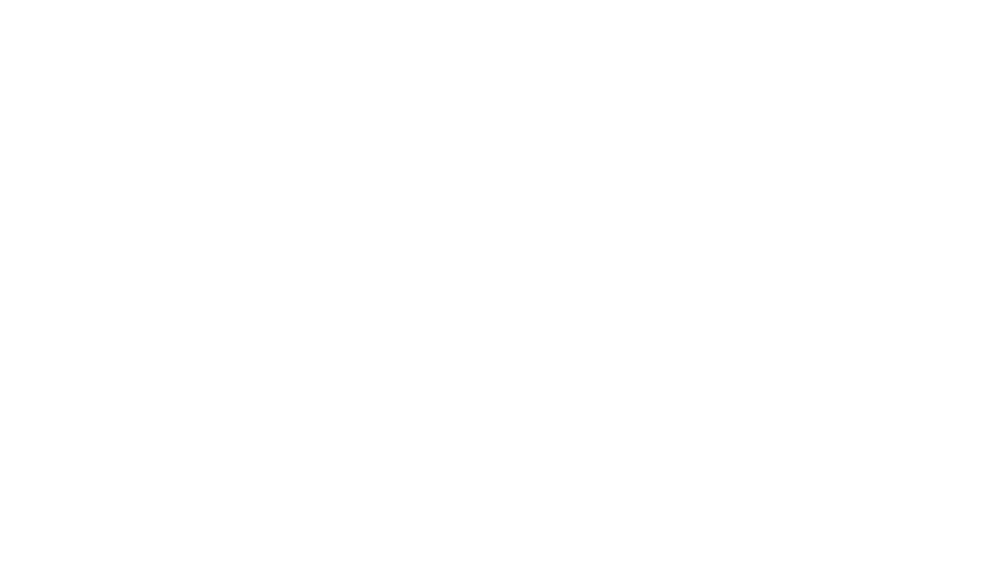

<IPython.core.display.Javascript object>


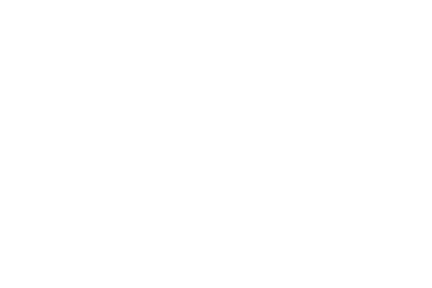

<IPython.core.display.Javascript object>


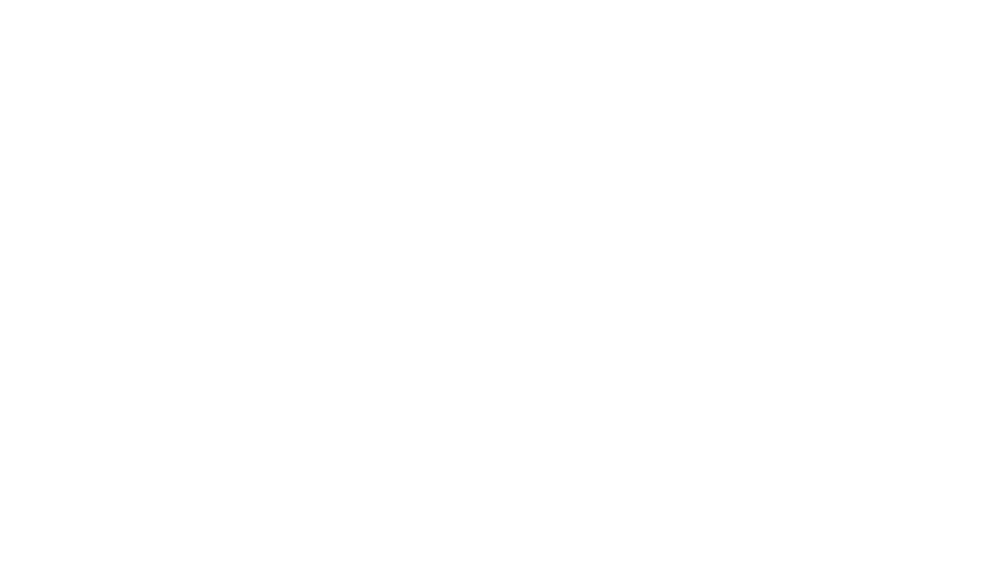

<IPython.core.display.Javascript object>


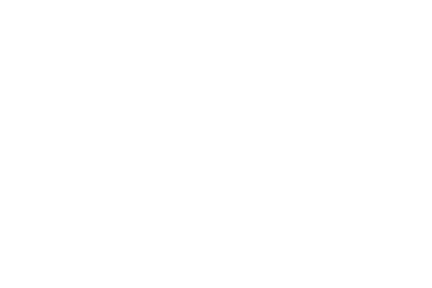

<IPython.core.display.Javascript object>


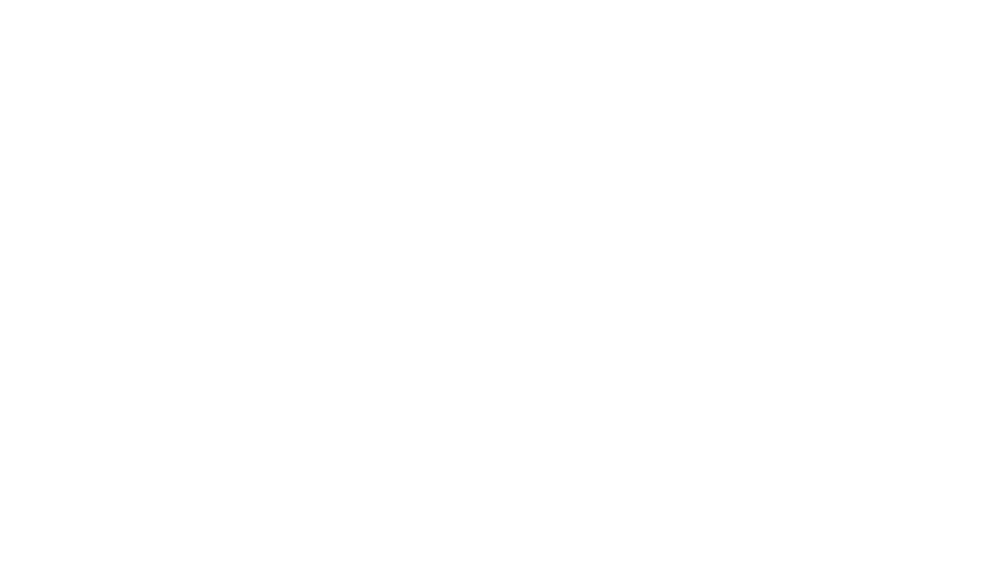

<IPython.core.display.Javascript object>


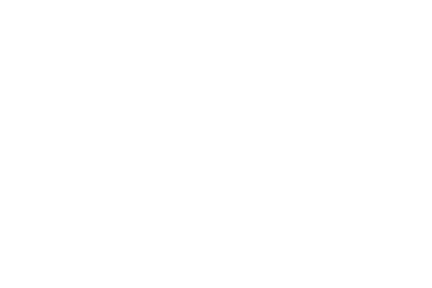

<IPython.core.display.Javascript object>


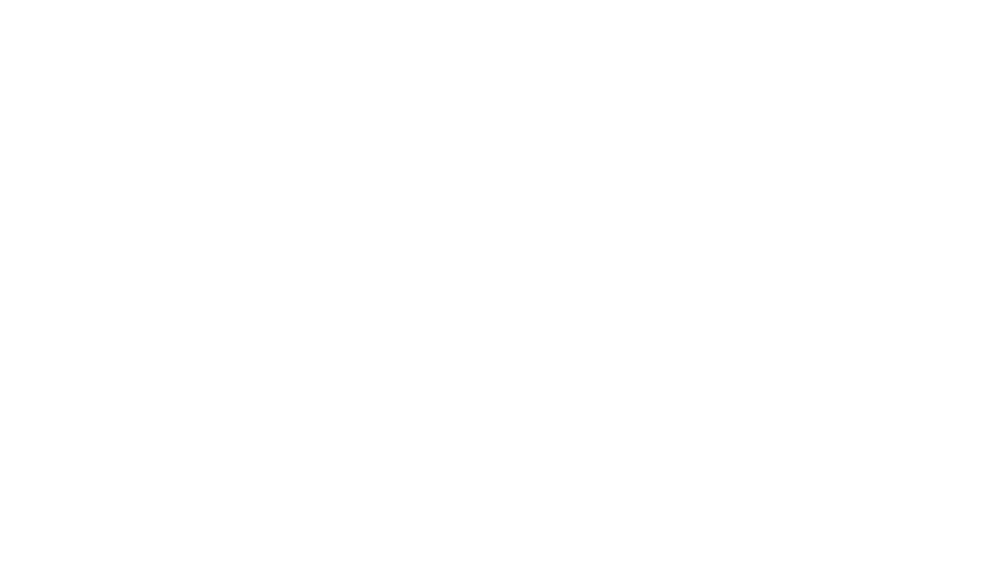

<IPython.core.display.Javascript object>


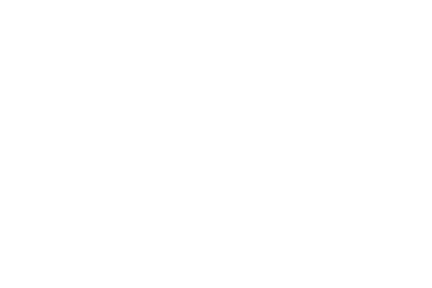

<IPython.core.display.Javascript object>


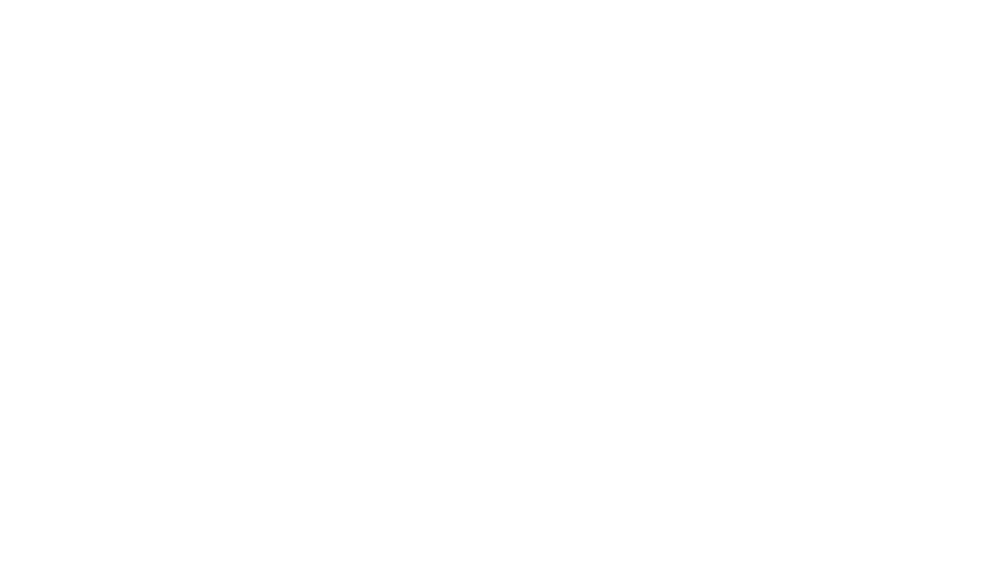

<IPython.core.display.Javascript object>


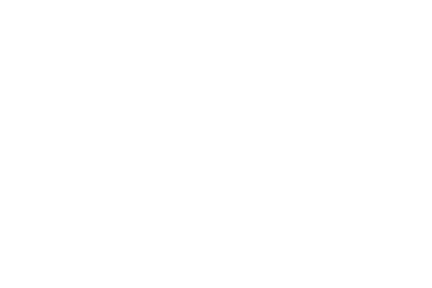

<IPython.core.display.Javascript object>


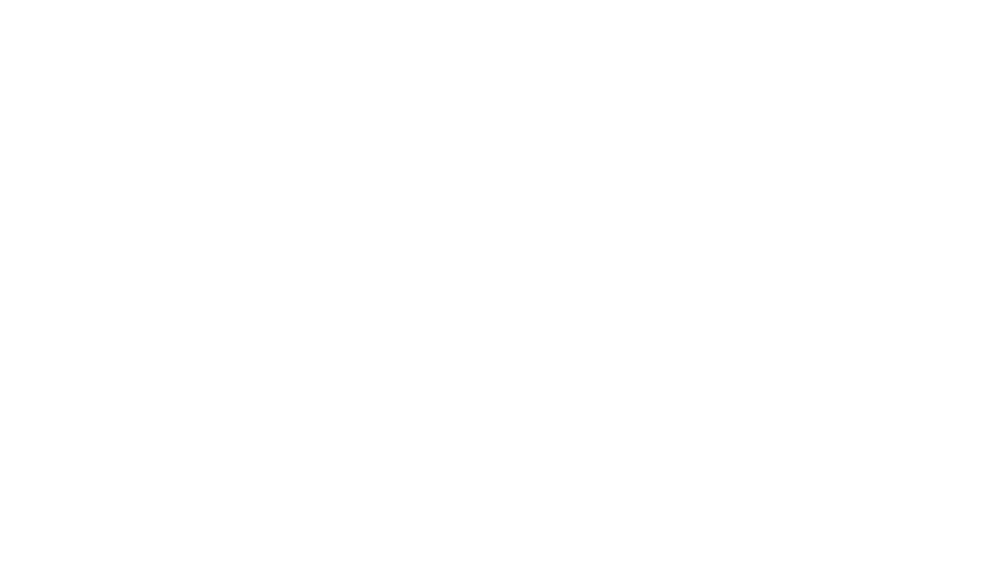

<IPython.core.display.Javascript object>


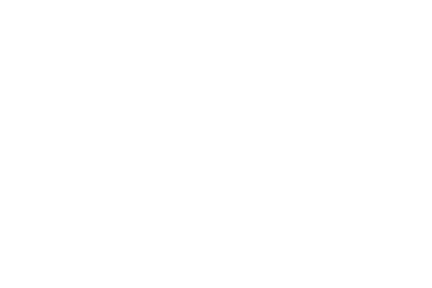

<IPython.core.display.Javascript object>


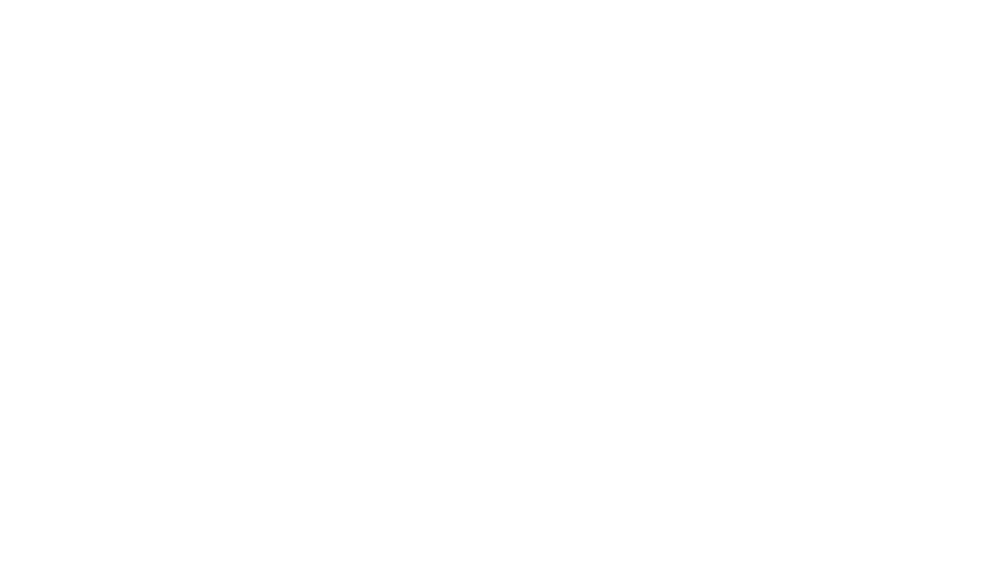

<IPython.core.display.Javascript object>


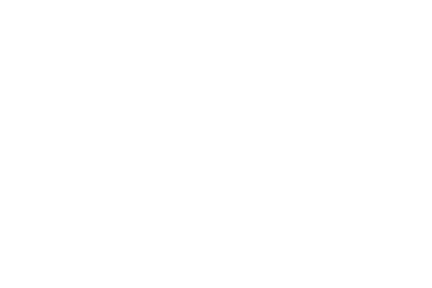

<IPython.core.display.Javascript object>


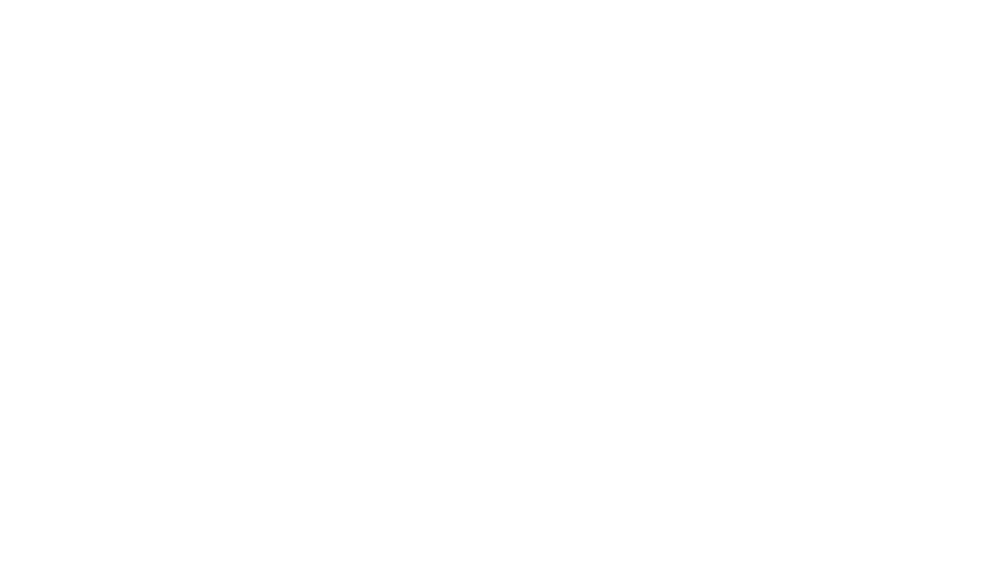

<IPython.core.display.Javascript object>


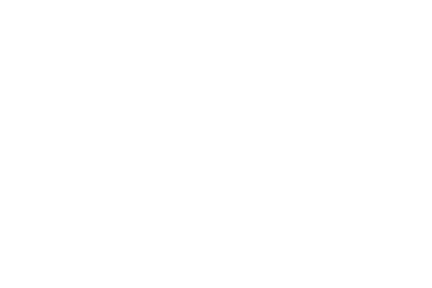

<IPython.core.display.Javascript object>


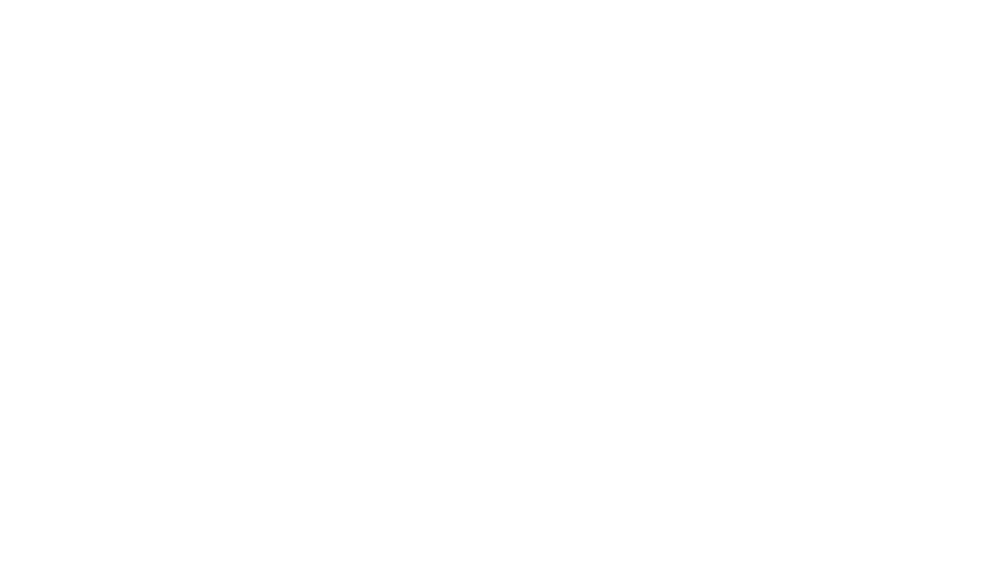

<IPython.core.display.Javascript object>


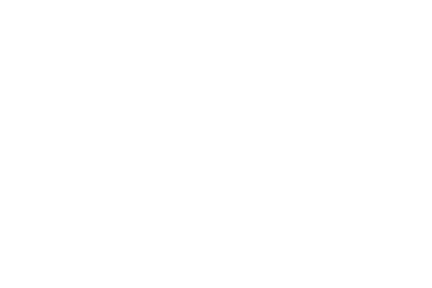

<IPython.core.display.Javascript object>


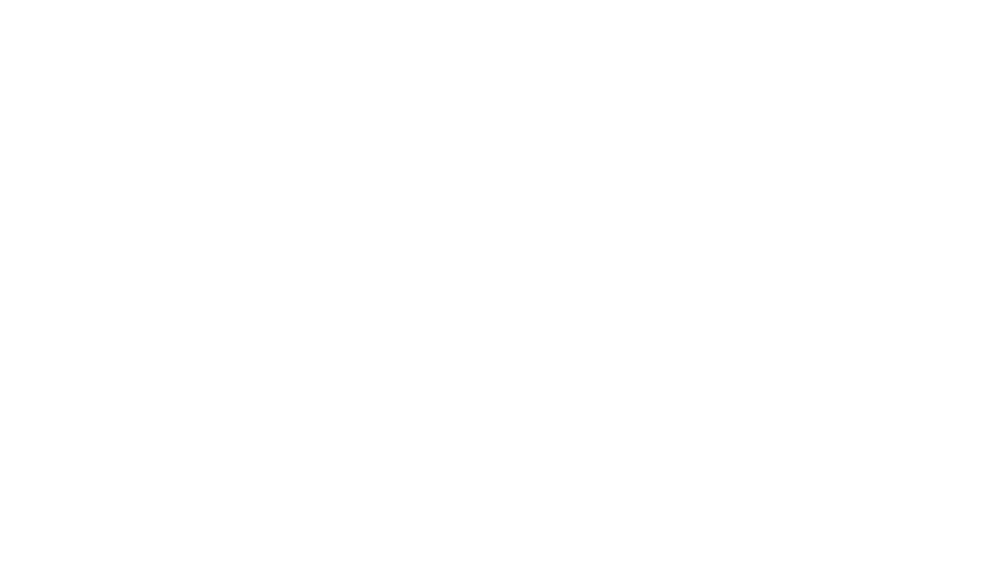

<IPython.core.display.Javascript object>


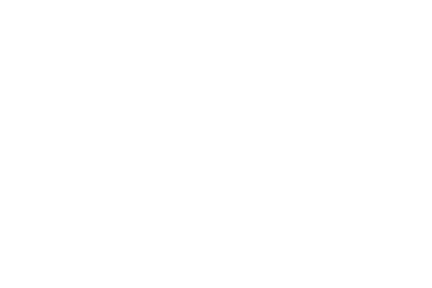

<IPython.core.display.Javascript object>


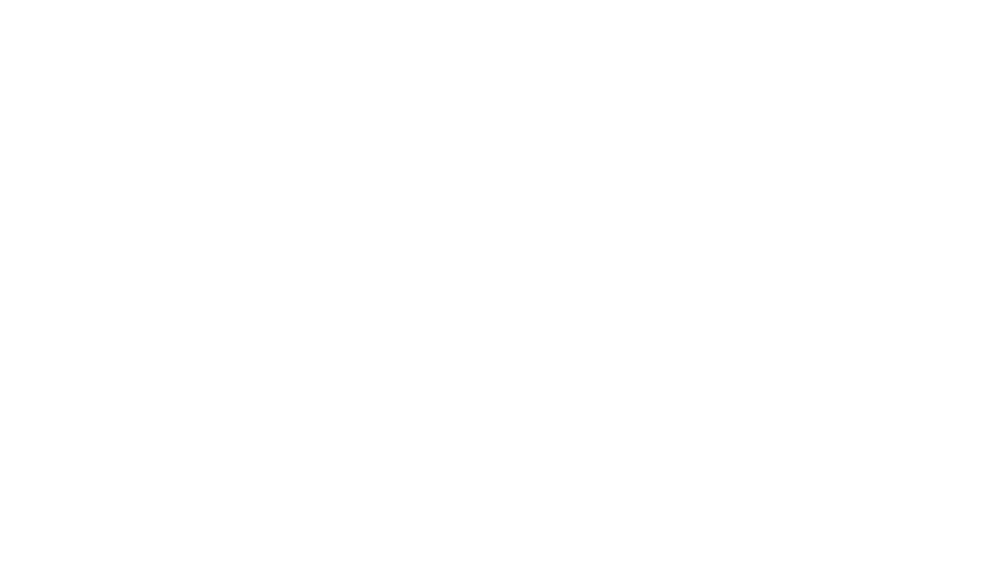

<IPython.core.display.Javascript object>


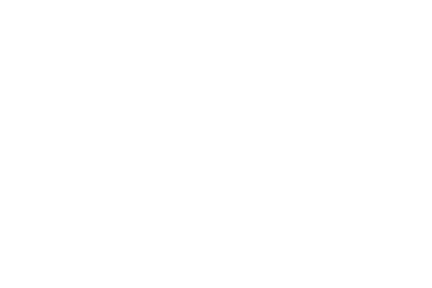

<IPython.core.display.Javascript object>


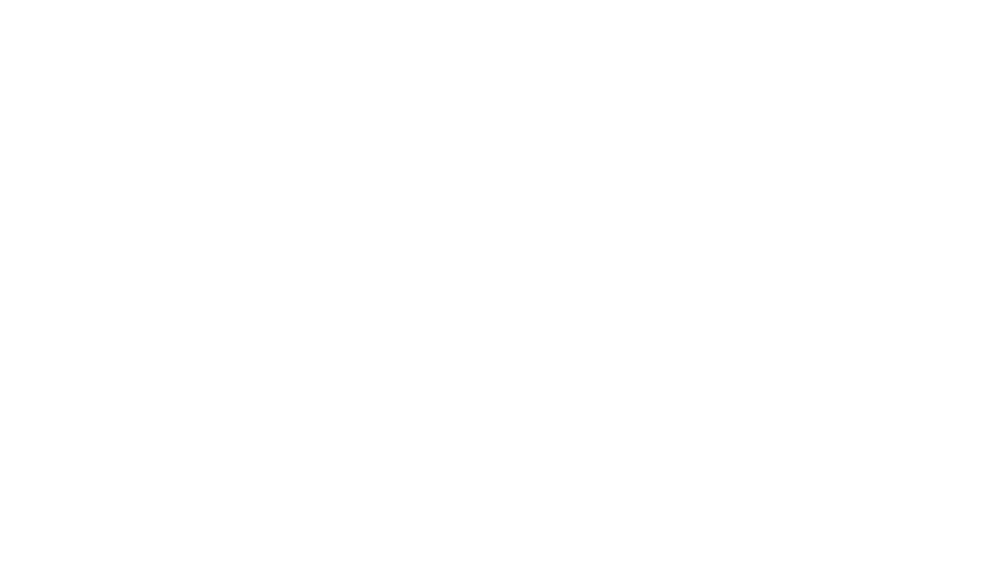

<IPython.core.display.Javascript object>


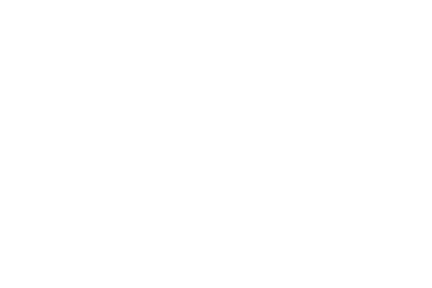

<IPython.core.display.Javascript object>


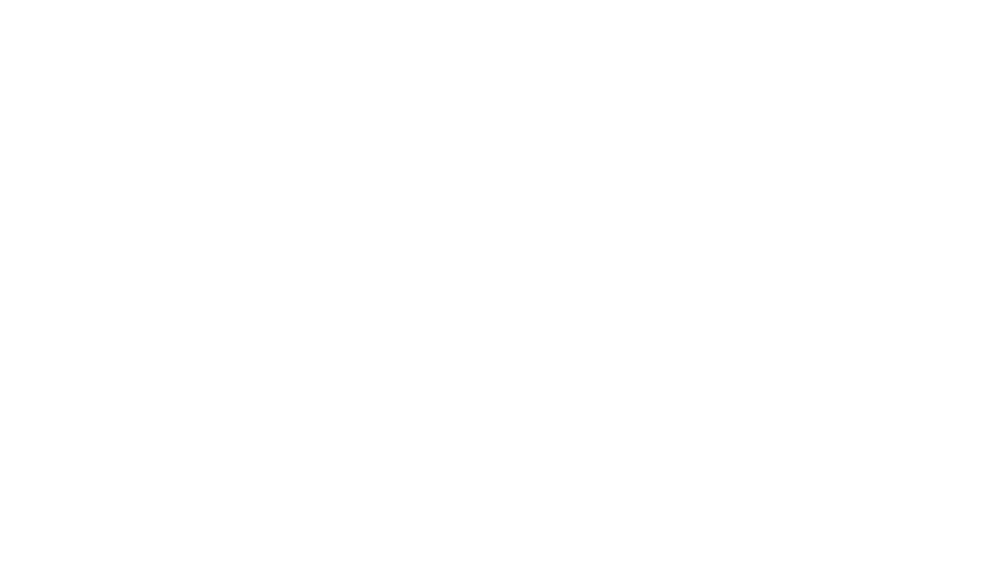

<IPython.core.display.Javascript object>


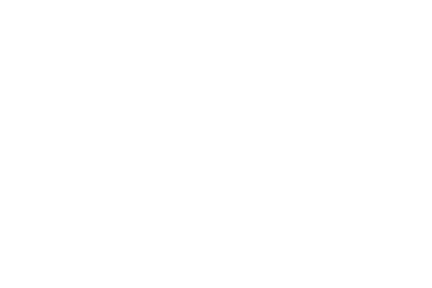

<IPython.core.display.Javascript object>


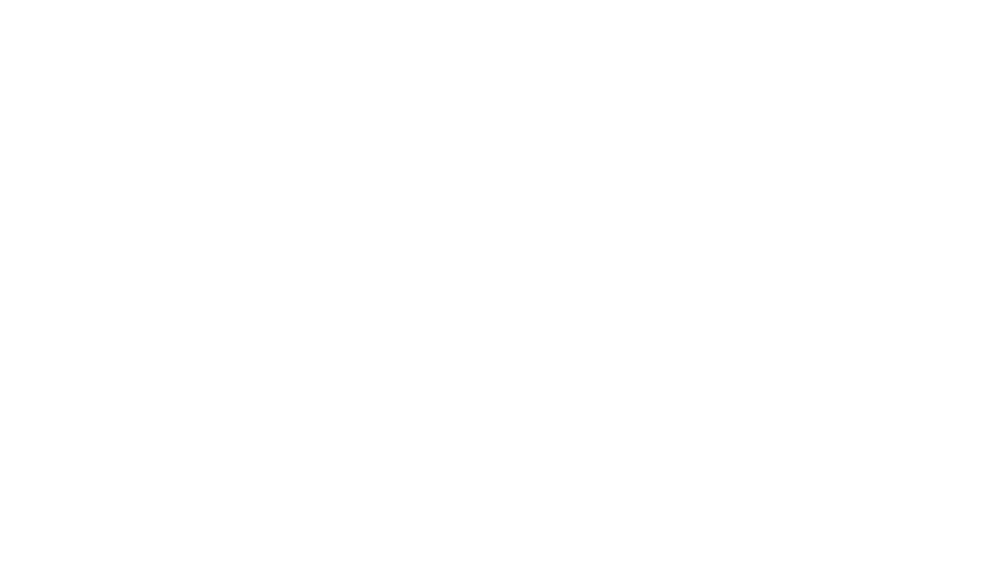

<IPython.core.display.Javascript object>


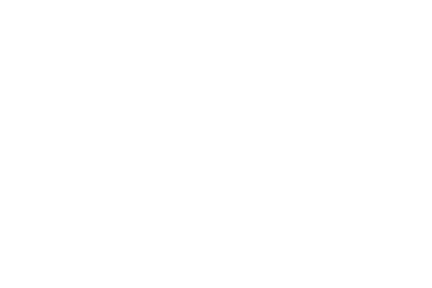

<IPython.core.display.Javascript object>


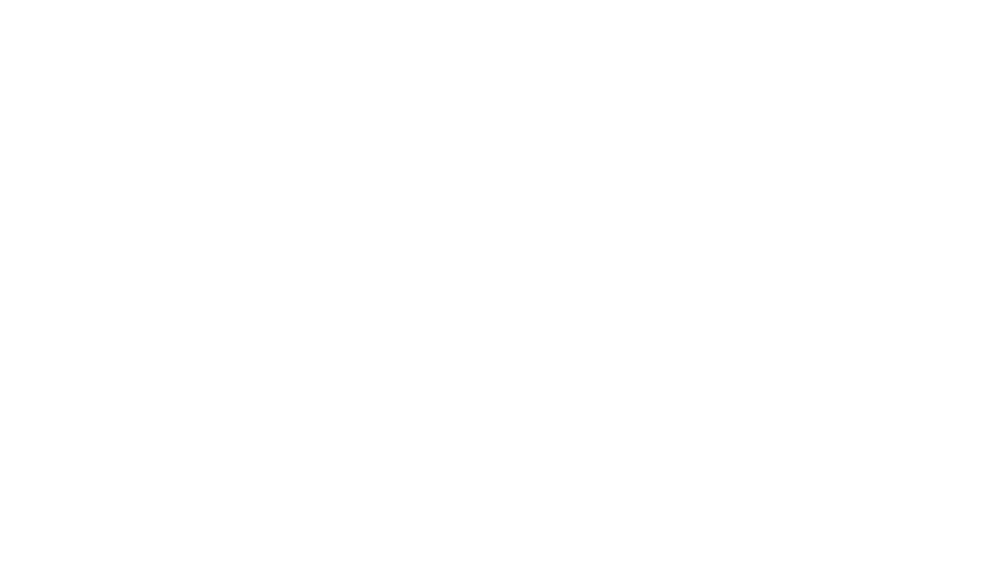

<IPython.core.display.Javascript object>


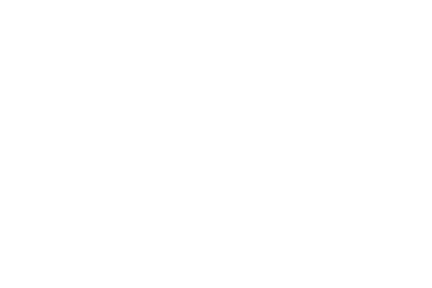

<IPython.core.display.Javascript object>


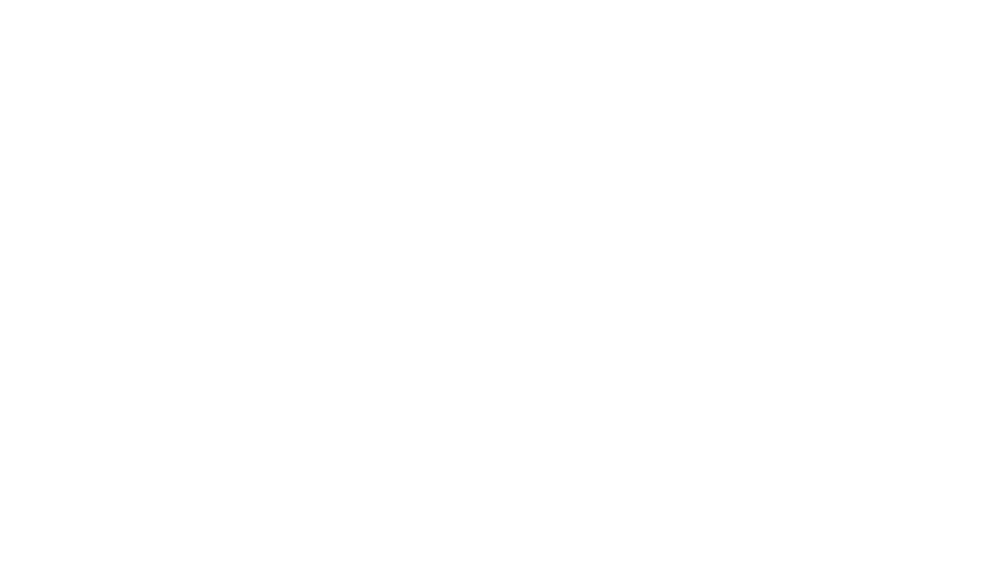

<IPython.core.display.Javascript object>


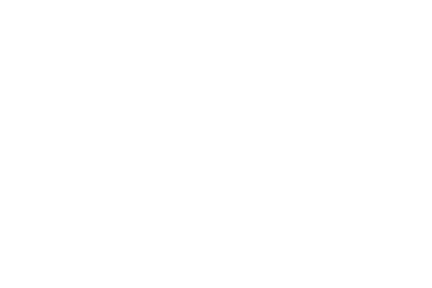

<IPython.core.display.Javascript object>


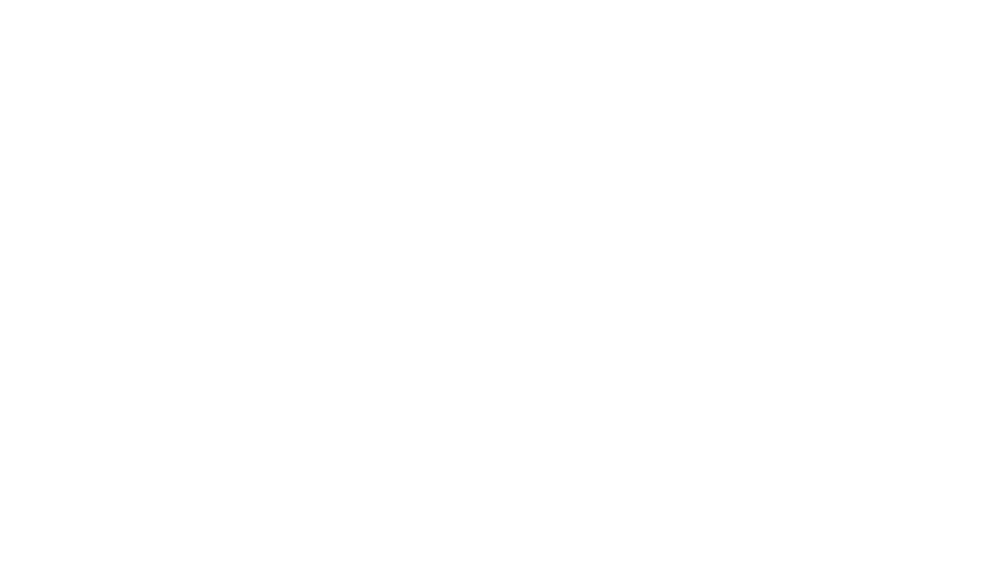

<IPython.core.display.Javascript object>


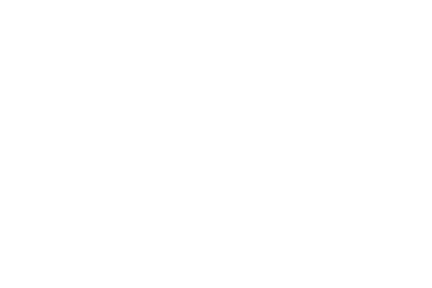

<IPython.core.display.Javascript object>


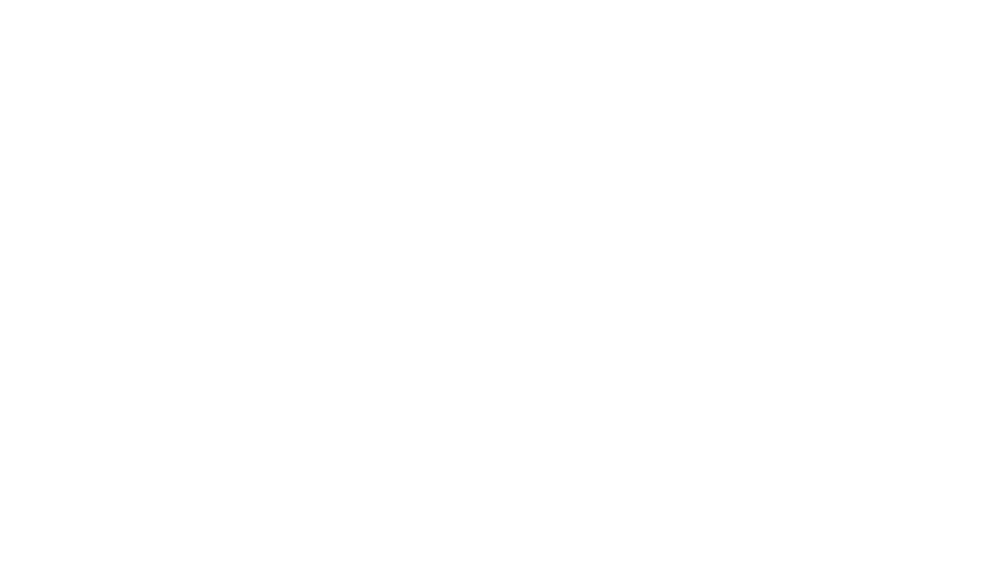

<IPython.core.display.Javascript object>


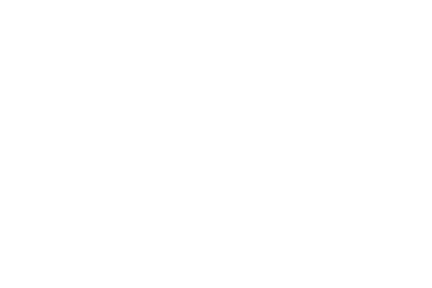

<IPython.core.display.Javascript object>


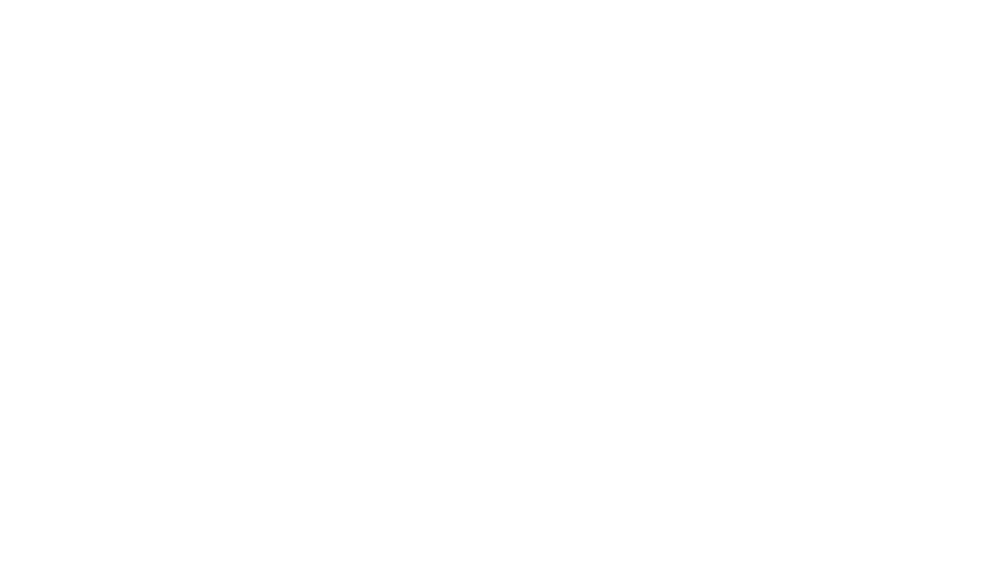

<IPython.core.display.Javascript object>


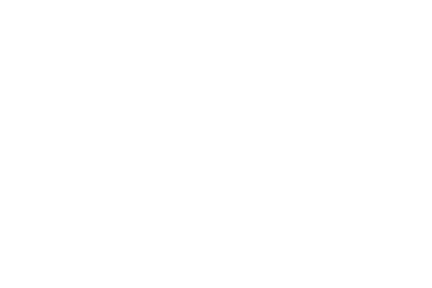

<IPython.core.display.Javascript object>


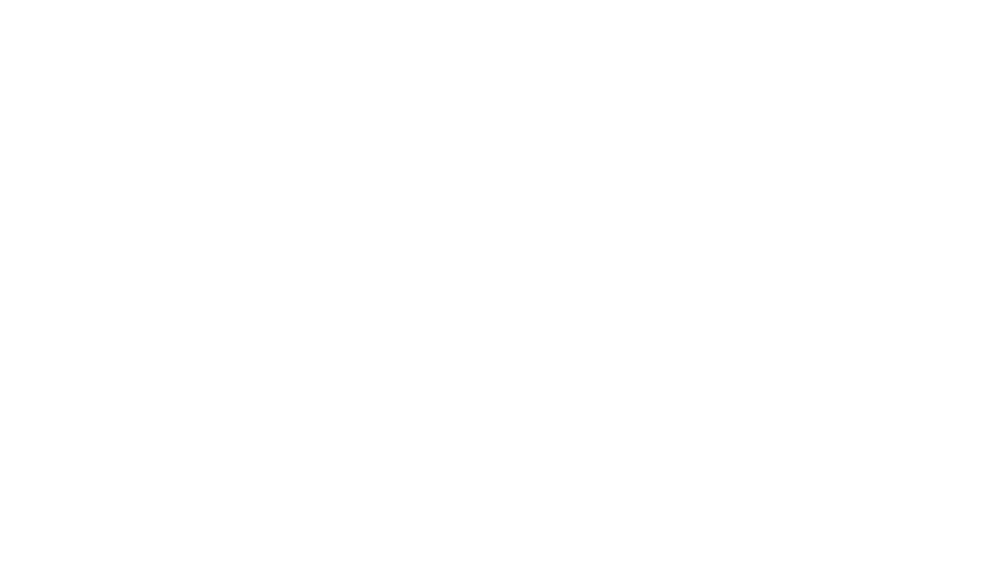

<IPython.core.display.Javascript object>


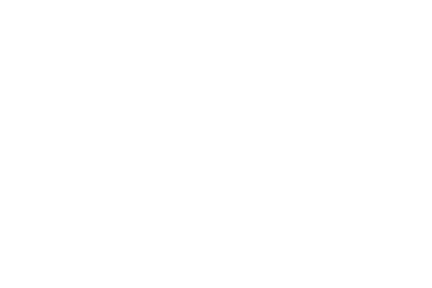

<IPython.core.display.Javascript object>


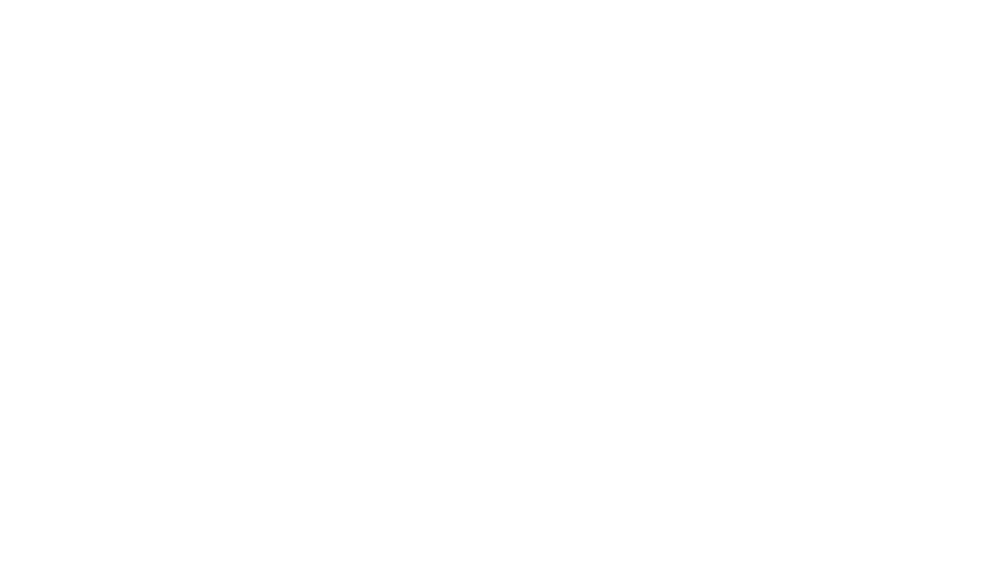

<IPython.core.display.Javascript object>


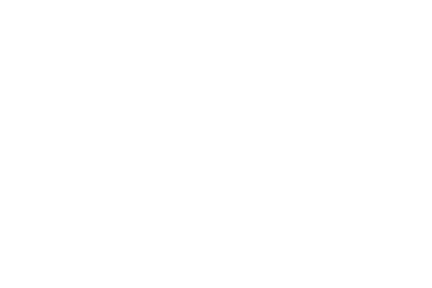

<IPython.core.display.Javascript object>


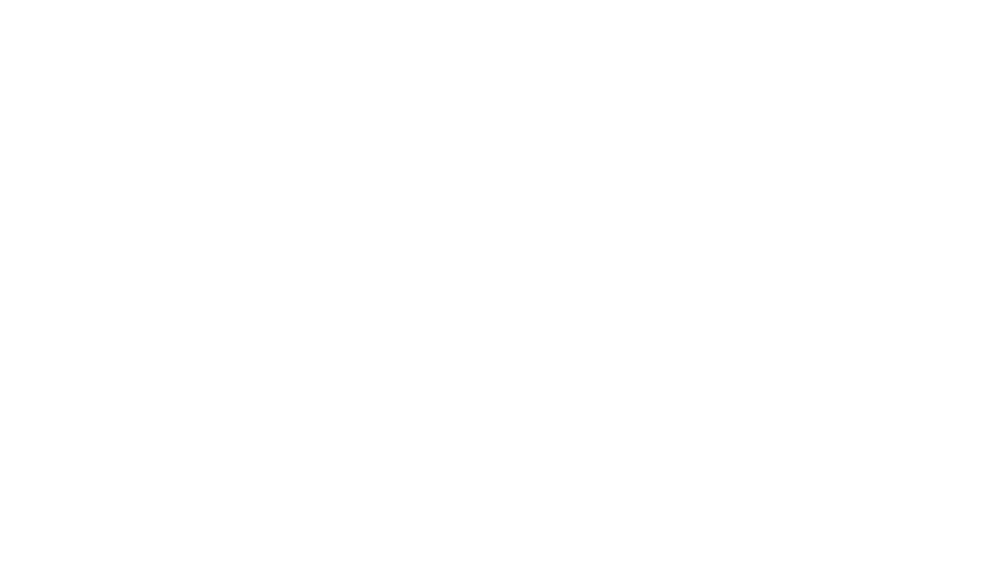

<IPython.core.display.Javascript object>


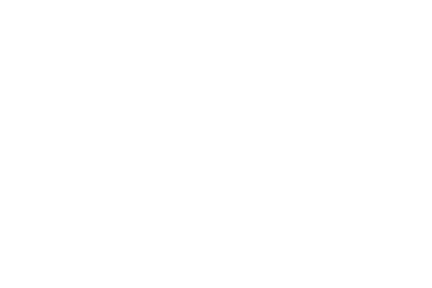

<IPython.core.display.Javascript object>


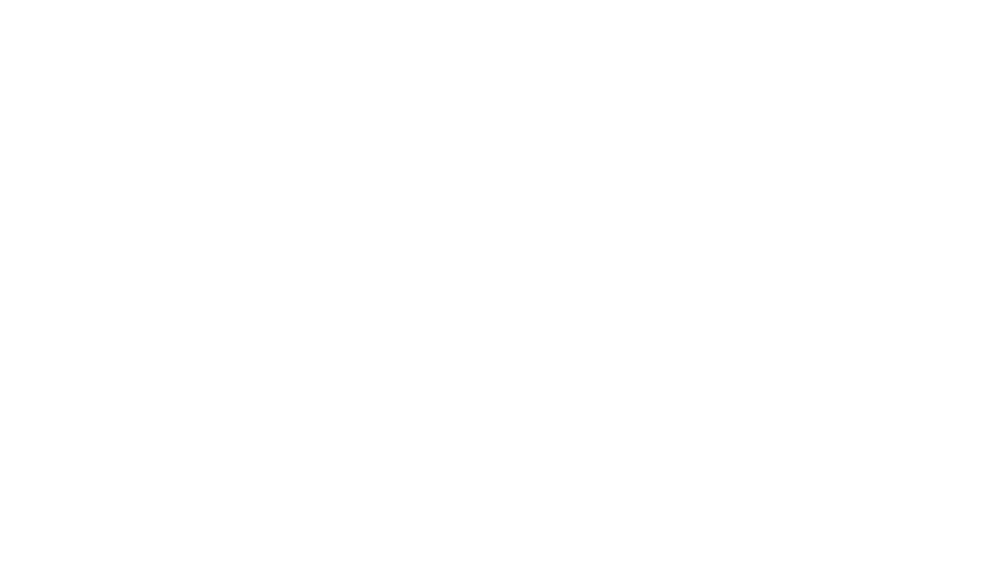

<IPython.core.display.Javascript object>


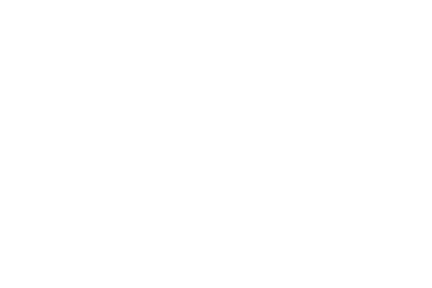

<IPython.core.display.Javascript object>


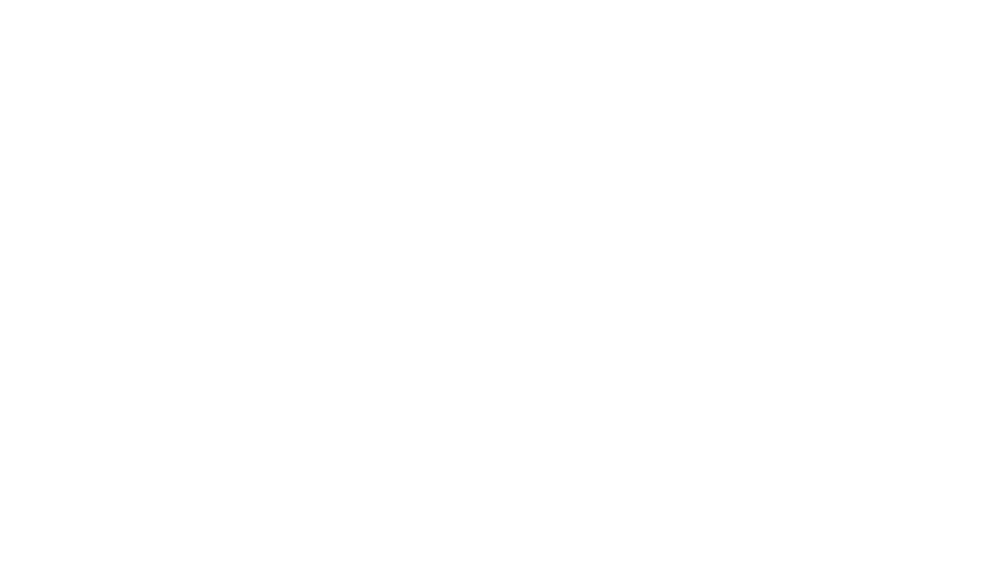

<IPython.core.display.Javascript object>


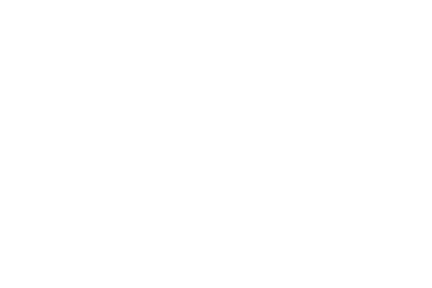

<IPython.core.display.Javascript object>


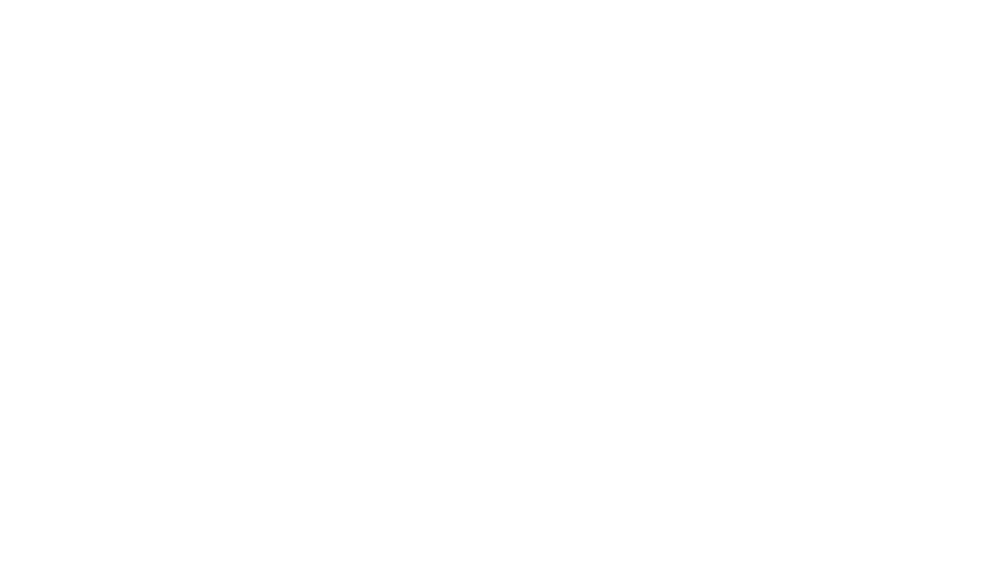

<IPython.core.display.Javascript object>


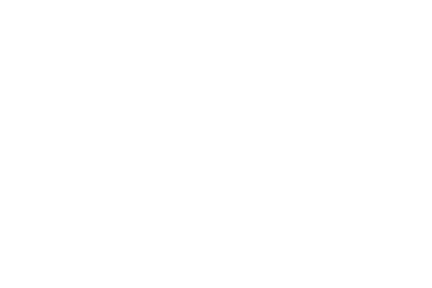

<IPython.core.display.Javascript object>


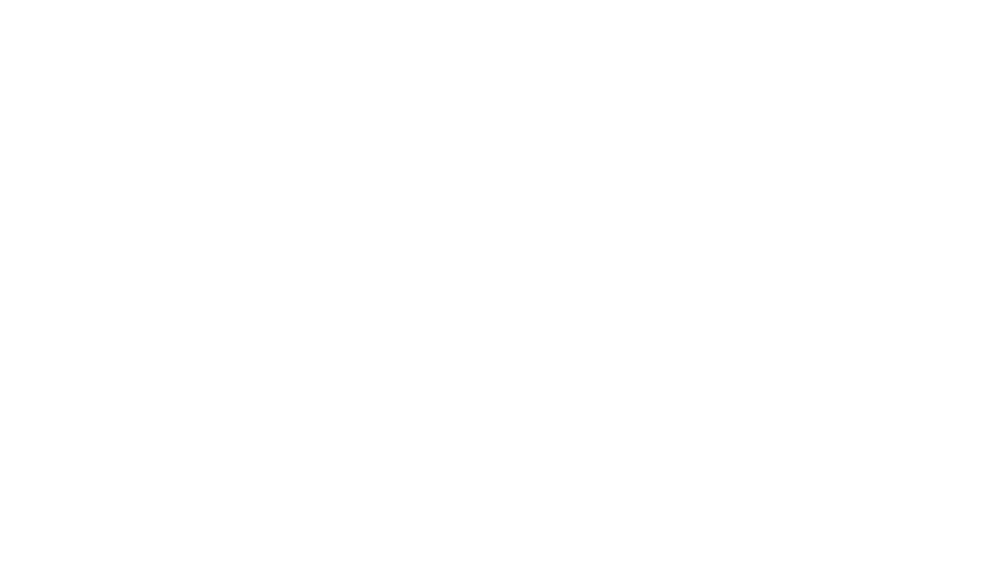

<IPython.core.display.Javascript object>


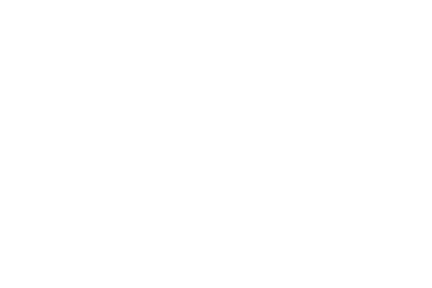

<IPython.core.display.Javascript object>


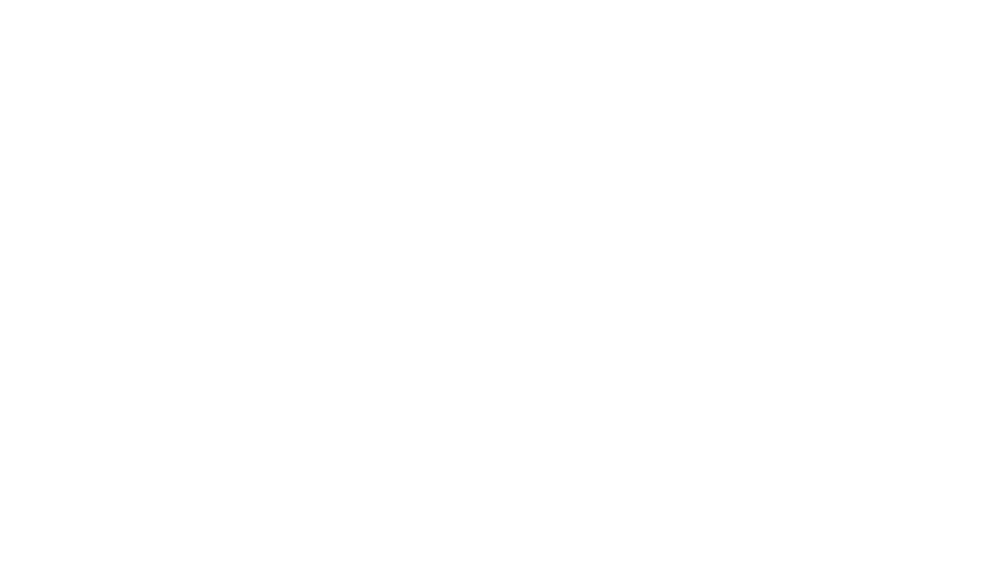

<IPython.core.display.Javascript object>


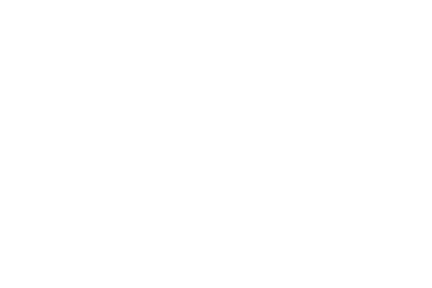

<IPython.core.display.Javascript object>


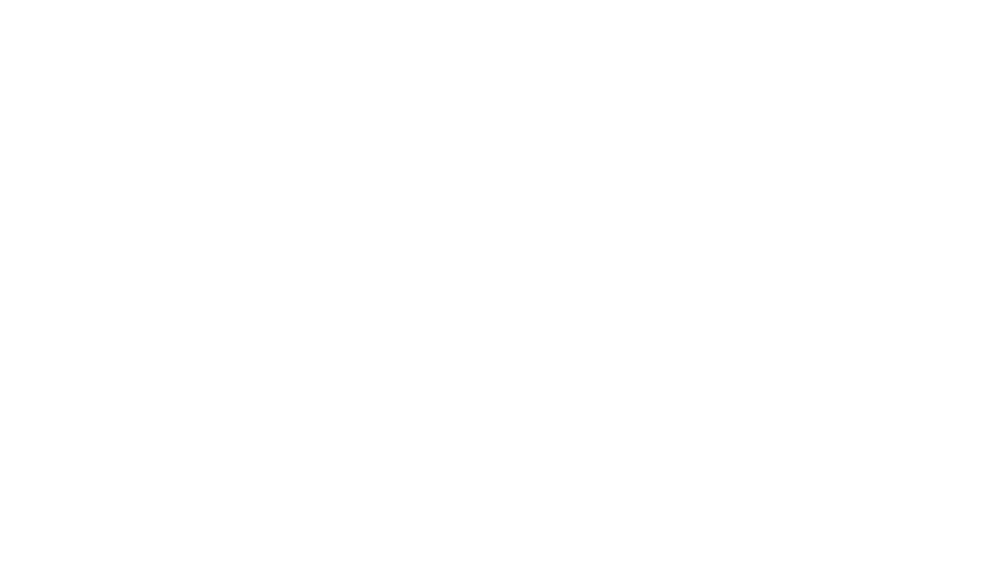

<IPython.core.display.Javascript object>


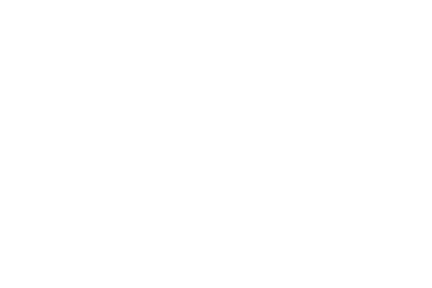

<IPython.core.display.Javascript object>


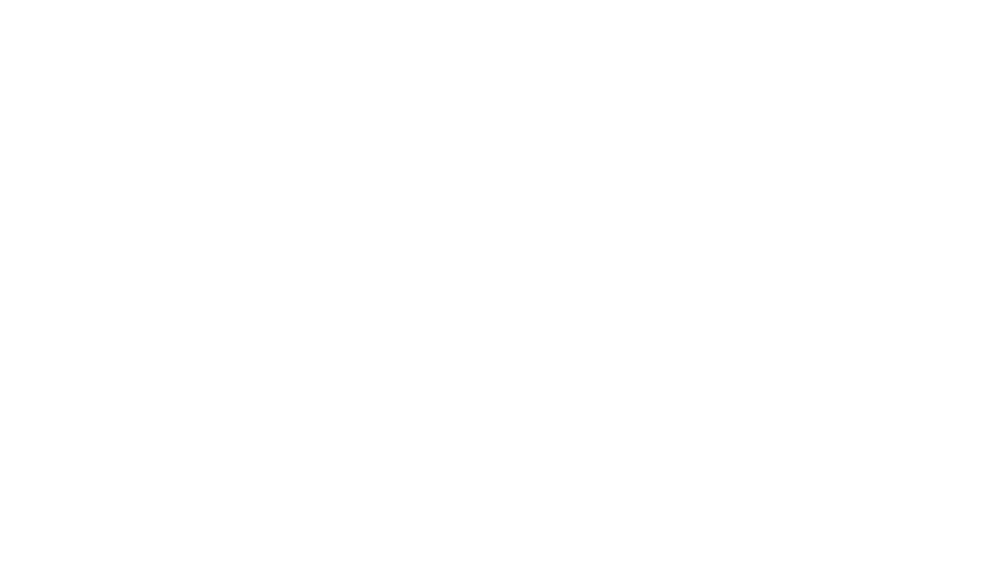

<IPython.core.display.Javascript object>


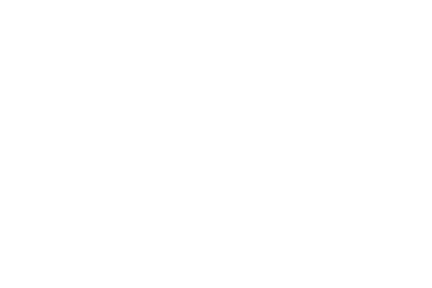

<IPython.core.display.Javascript object>


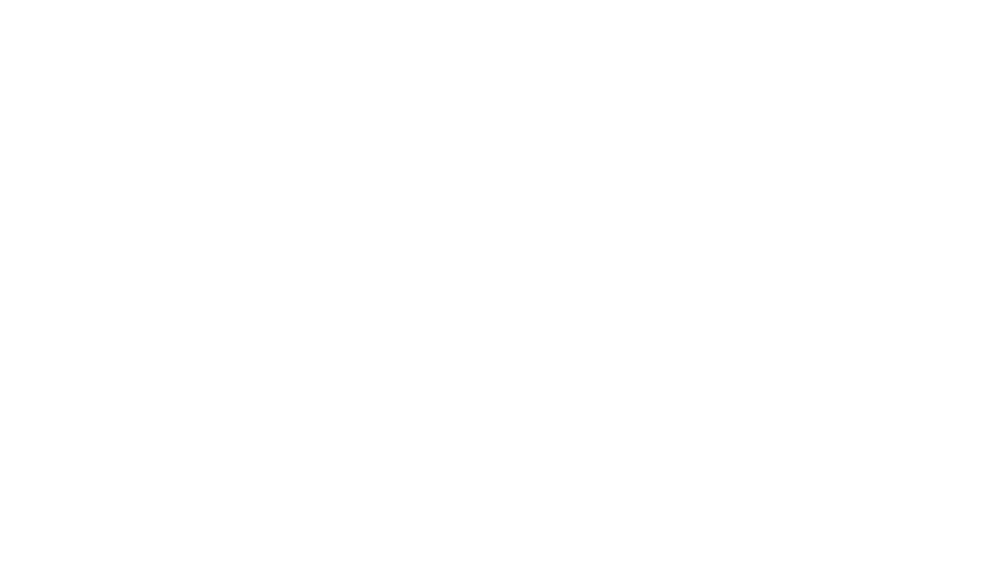

<IPython.core.display.Javascript object>


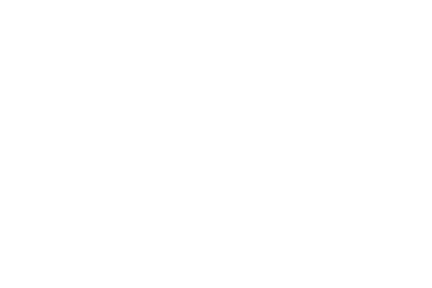

<IPython.core.display.Javascript object>


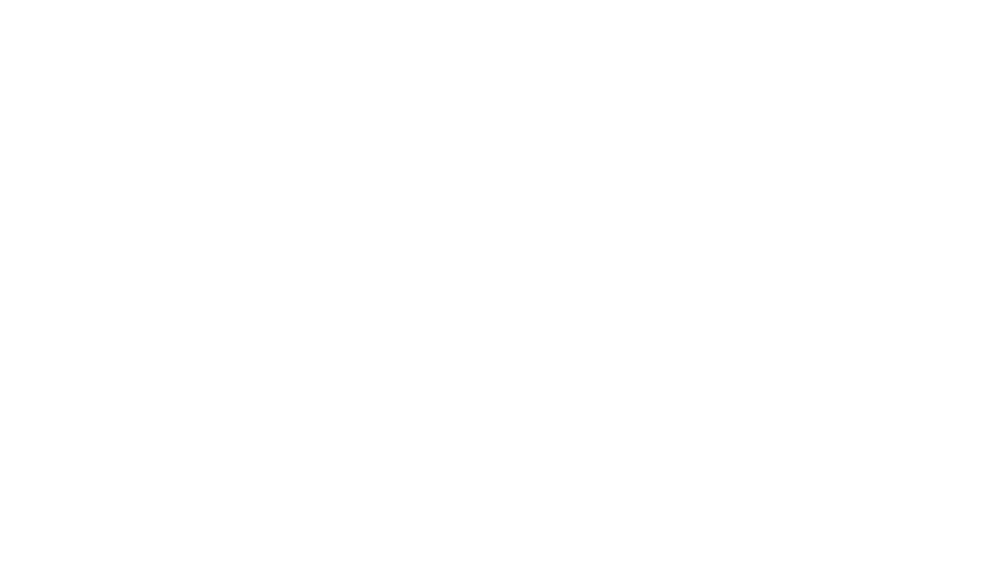

<IPython.core.display.Javascript object>


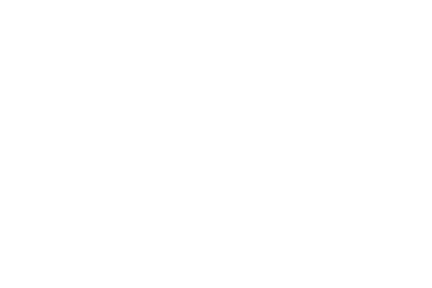

<IPython.core.display.Javascript object>


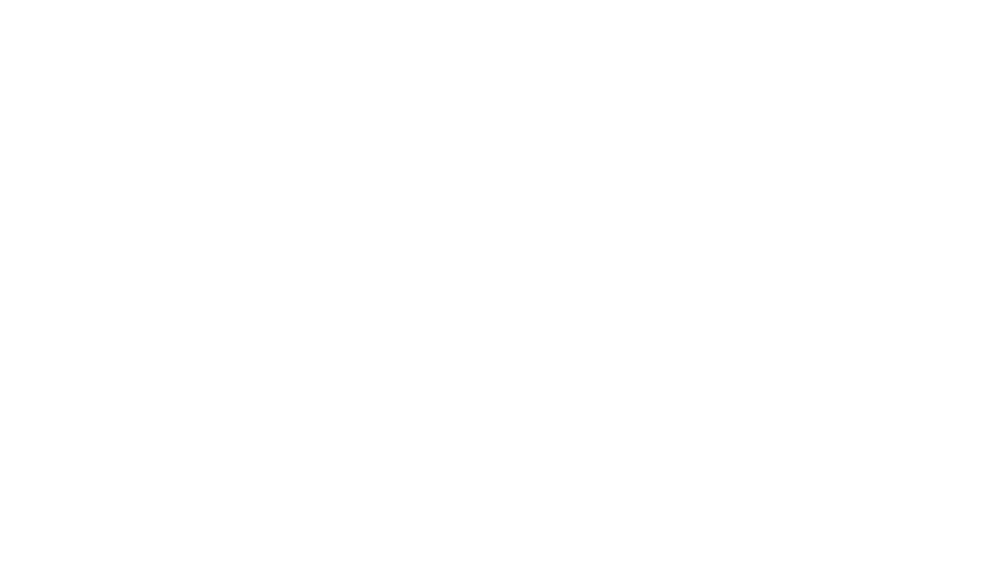

<IPython.core.display.Javascript object>


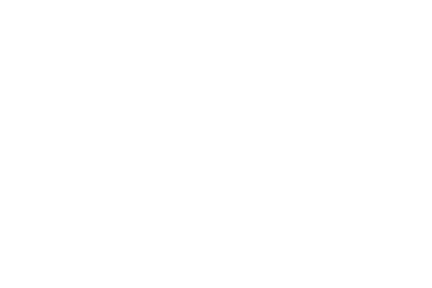

<IPython.core.display.Javascript object>


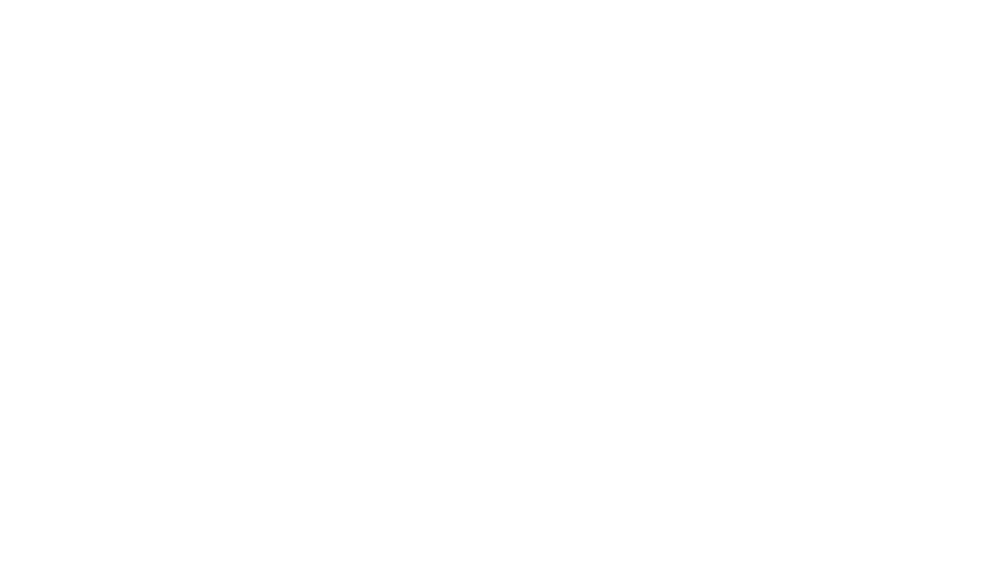

<IPython.core.display.Javascript object>


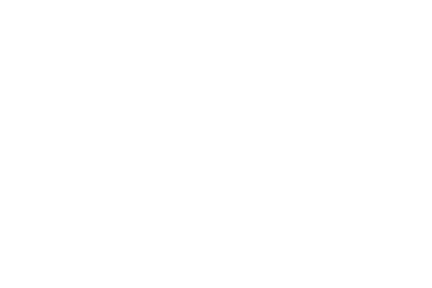

<IPython.core.display.Javascript object>


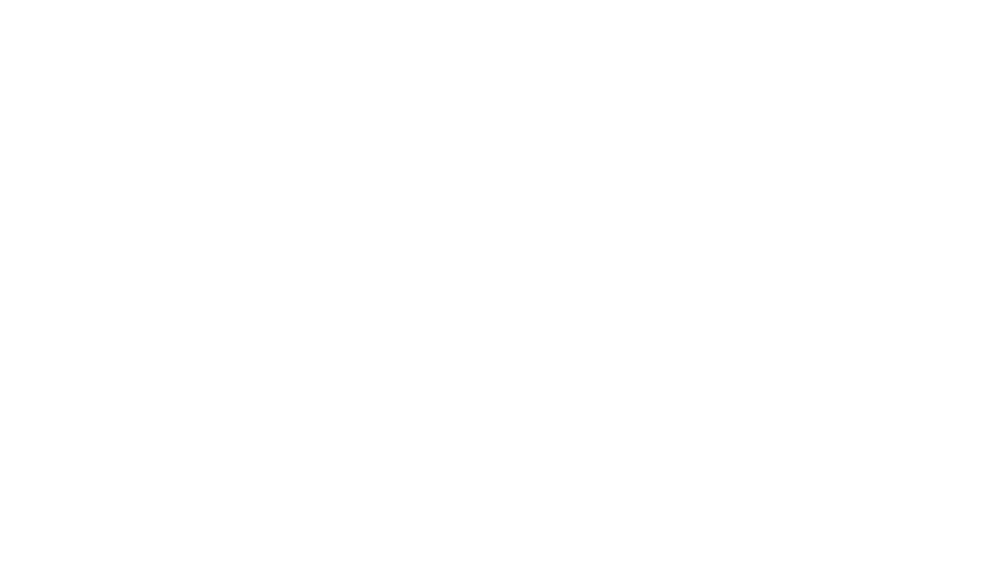

<IPython.core.display.Javascript object>


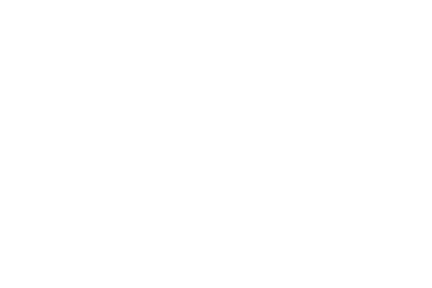

<IPython.core.display.Javascript object>


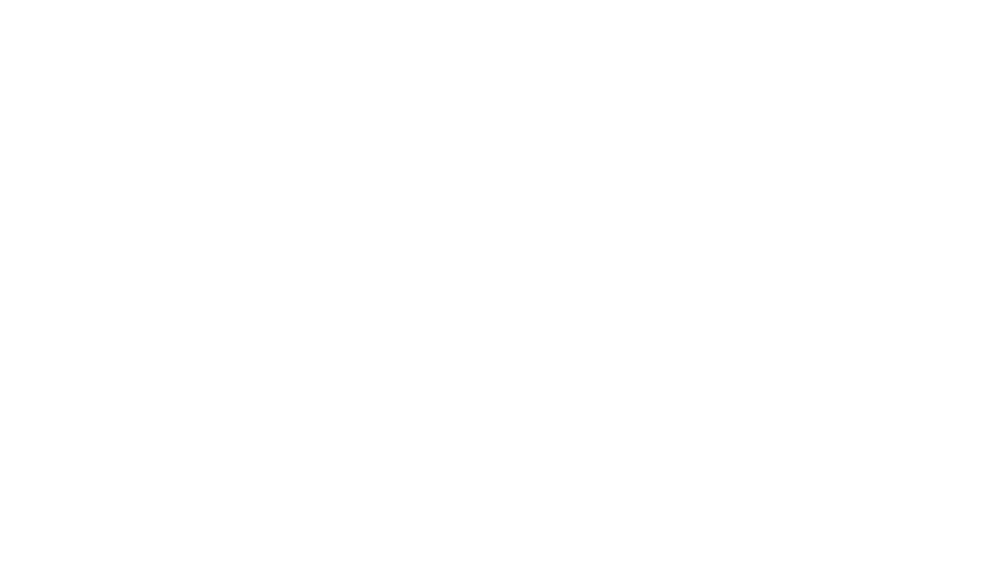

<IPython.core.display.Javascript object>


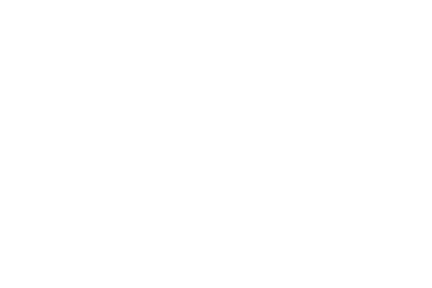

<IPython.core.display.Javascript object>


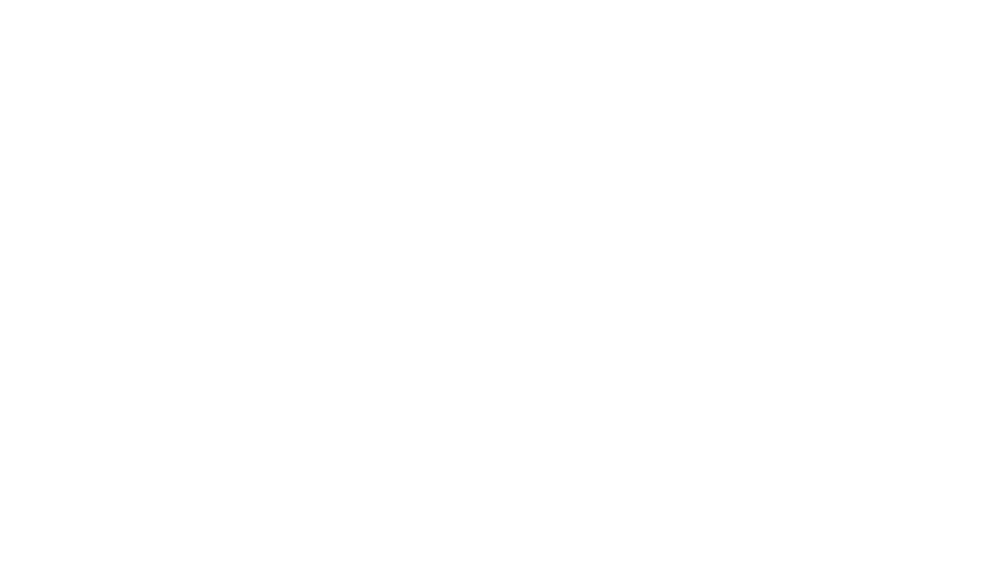

<IPython.core.display.Javascript object>


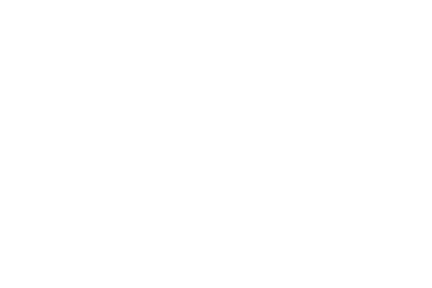

<IPython.core.display.Javascript object>


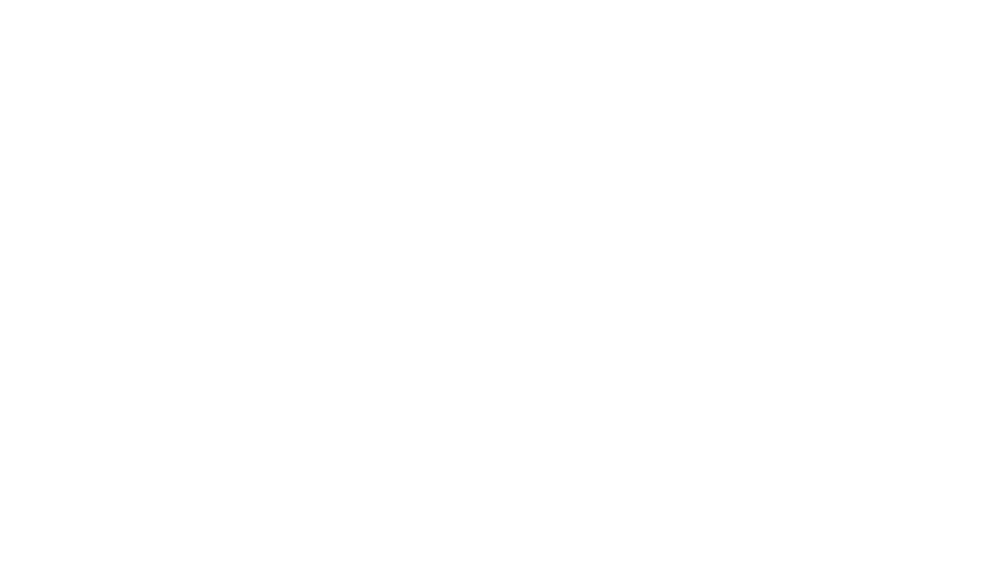

<IPython.core.display.Javascript object>


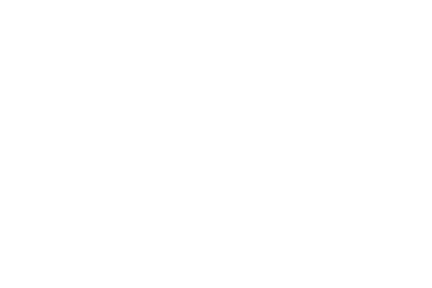

<IPython.core.display.Javascript object>


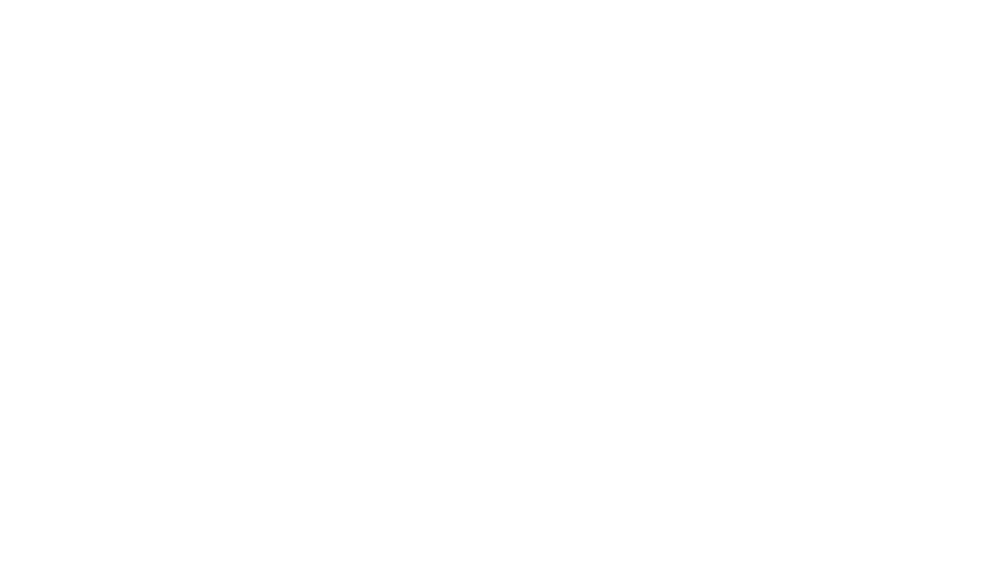

<IPython.core.display.Javascript object>


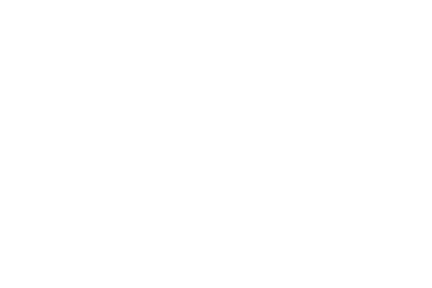

<IPython.core.display.Javascript object>


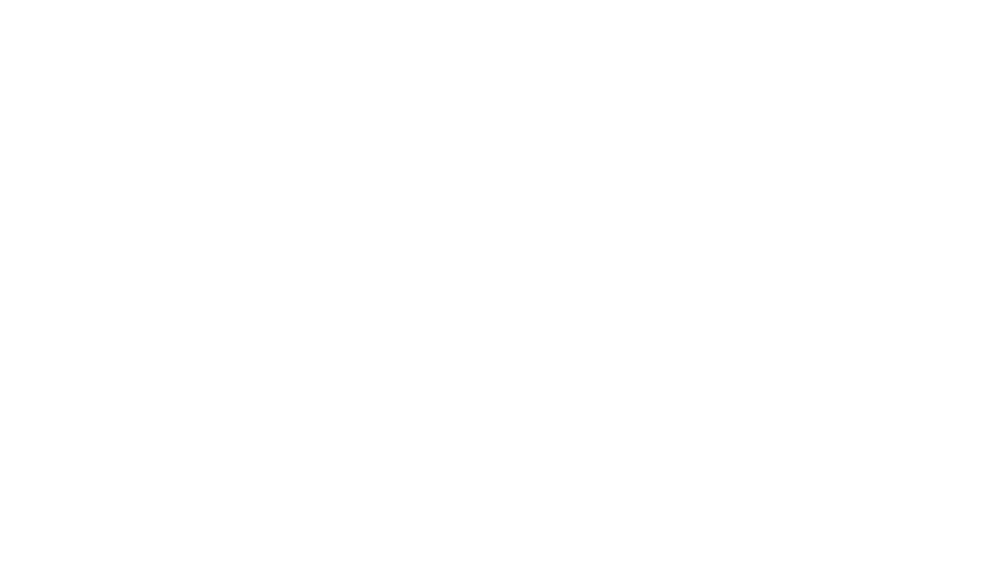

<IPython.core.display.Javascript object>


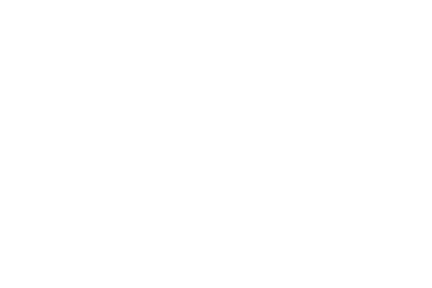

<IPython.core.display.Javascript object>


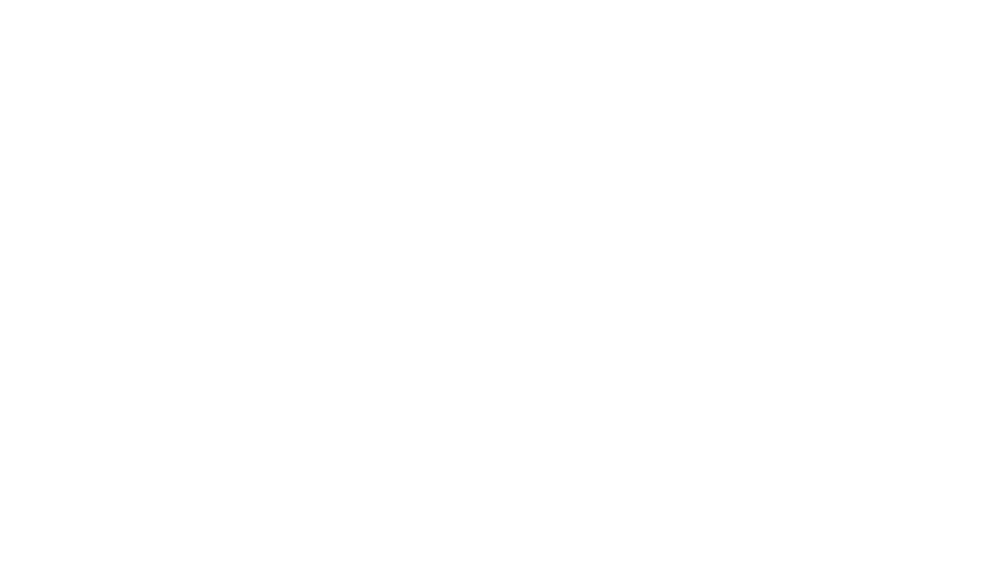

<IPython.core.display.Javascript object>


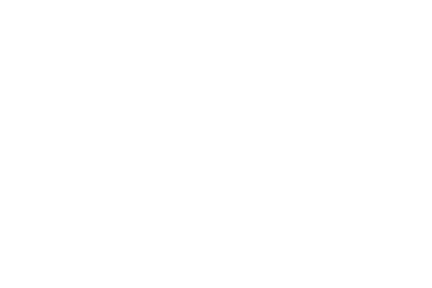

<IPython.core.display.Javascript object>


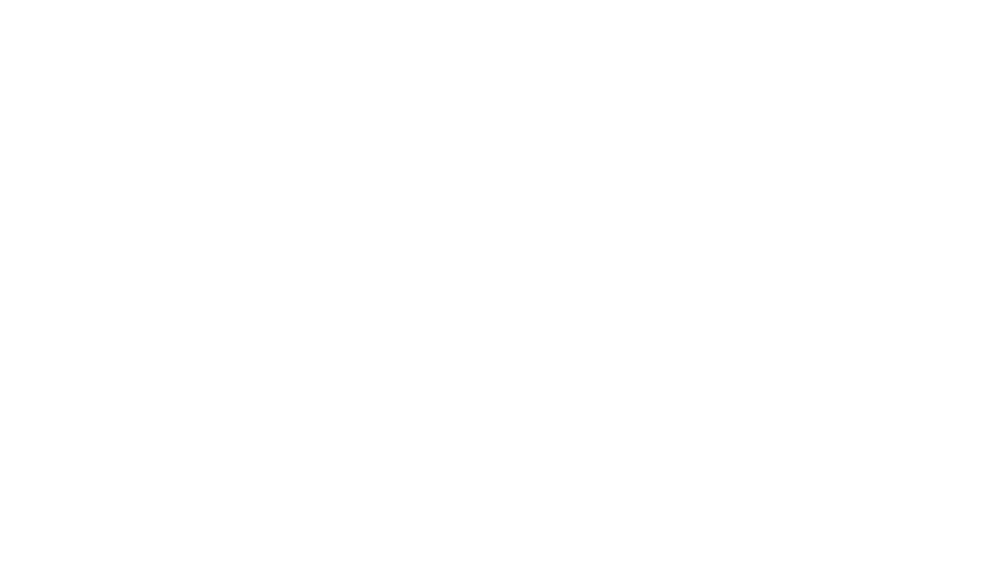

<IPython.core.display.Javascript object>


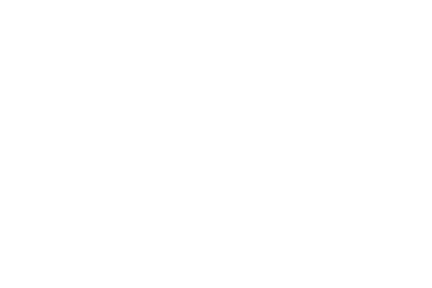

<IPython.core.display.Javascript object>


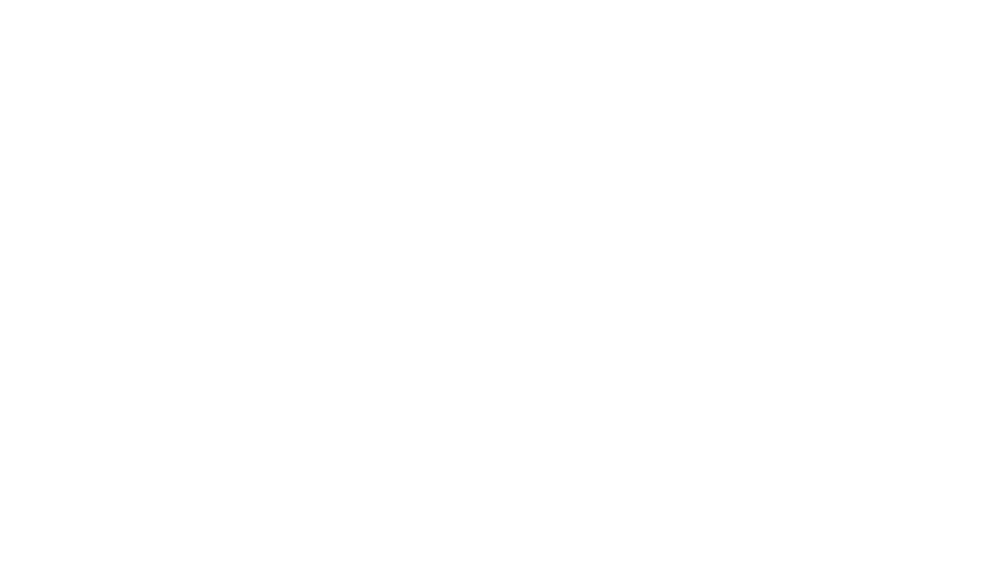

<IPython.core.display.Javascript object>


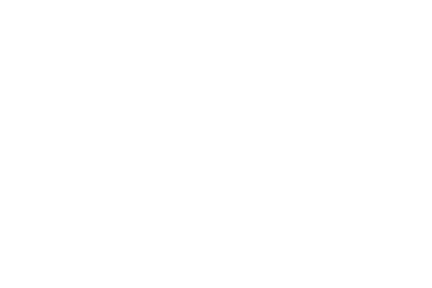

<IPython.core.display.Javascript object>


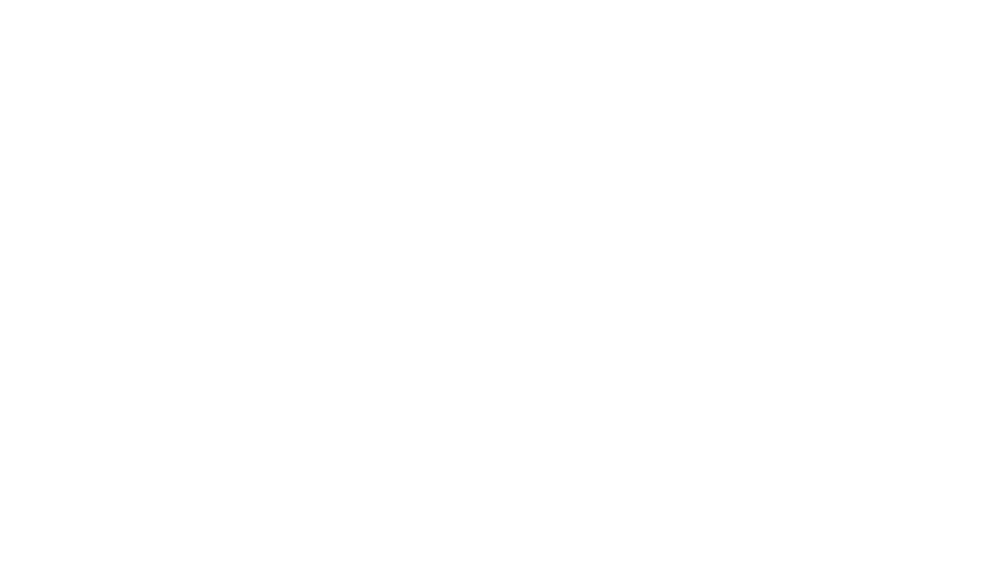

<IPython.core.display.Javascript object>


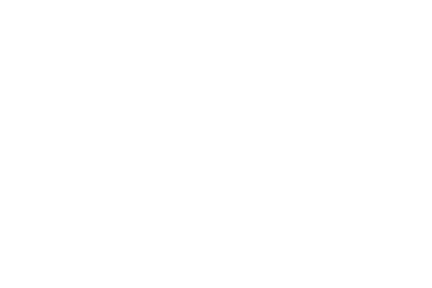

<IPython.core.display.Javascript object>


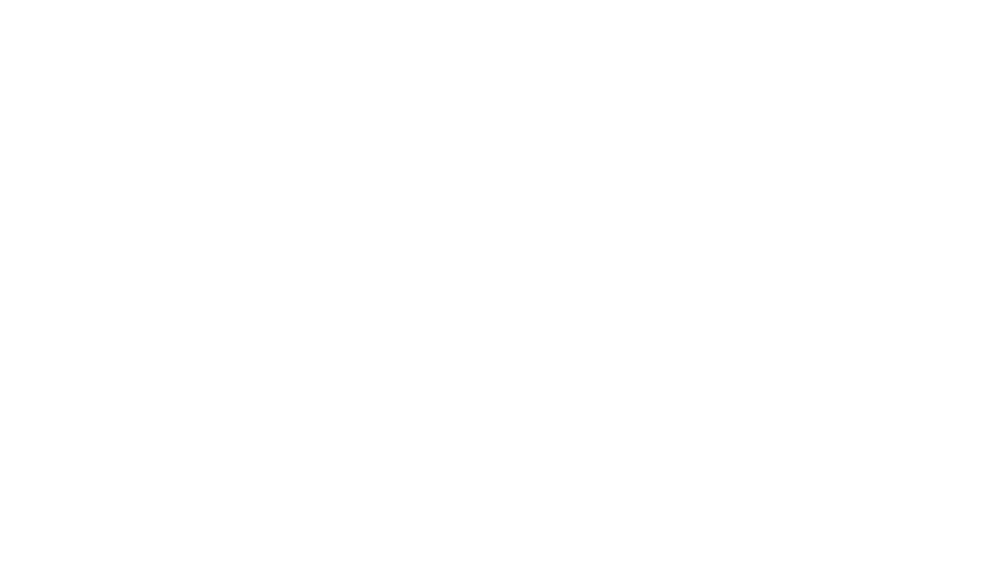

<IPython.core.display.Javascript object>


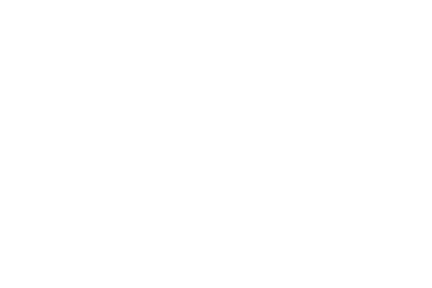

<IPython.core.display.Javascript object>


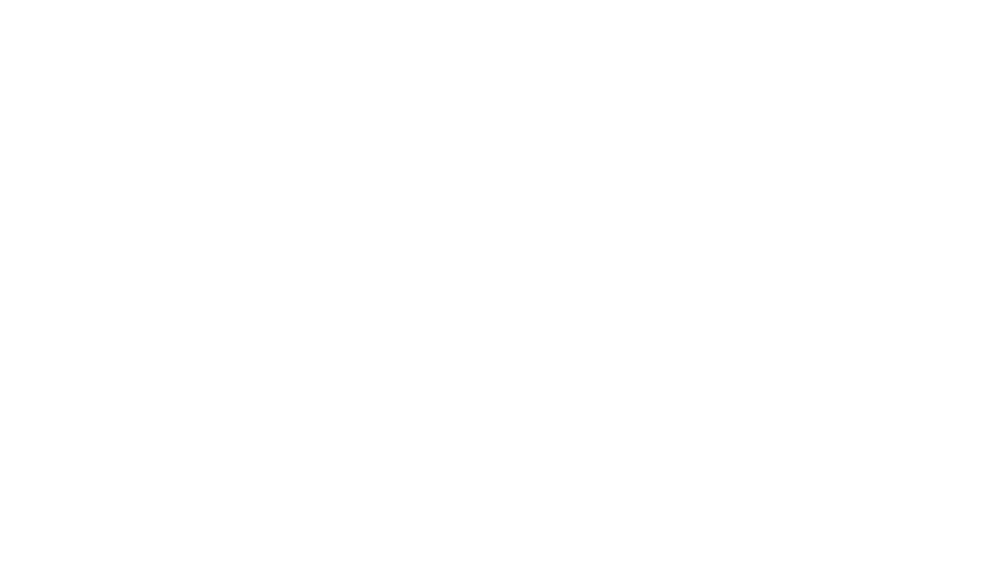

<IPython.core.display.Javascript object>


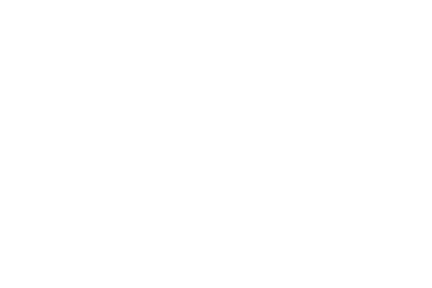

<IPython.core.display.Javascript object>


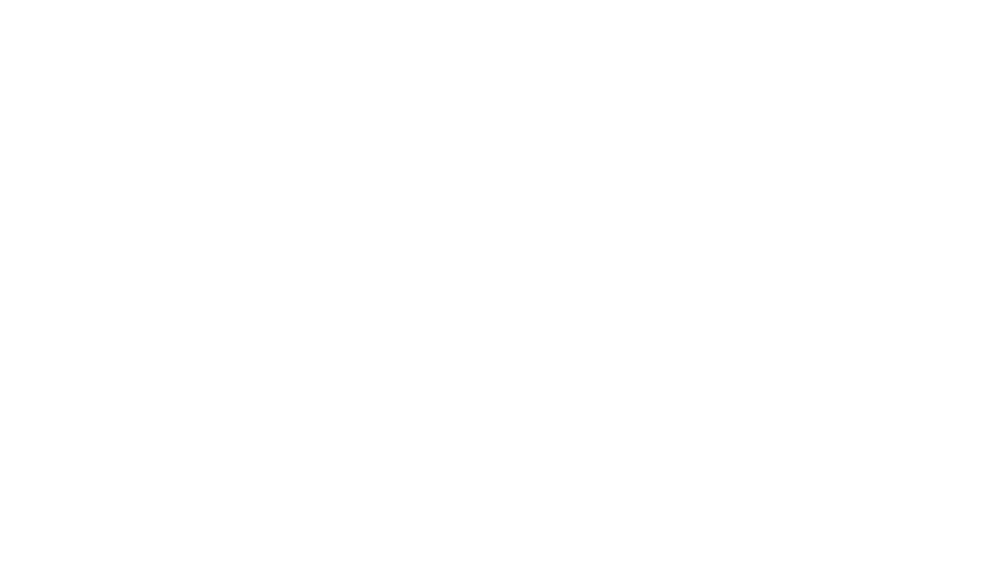

<IPython.core.display.Javascript object>


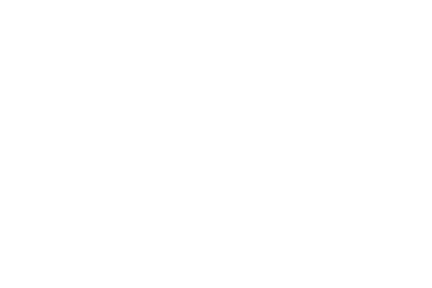

<IPython.core.display.Javascript object>


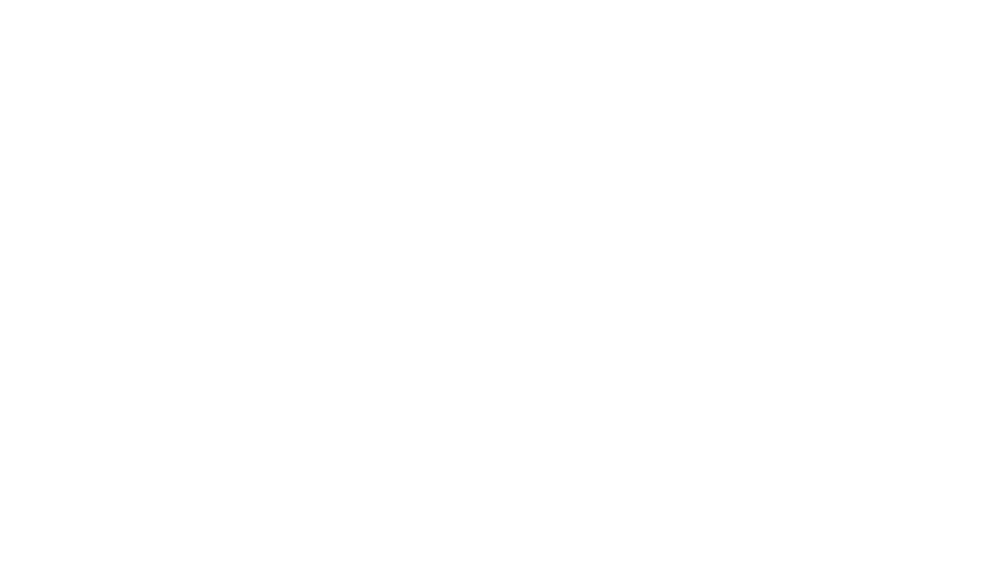

<IPython.core.display.Javascript object>


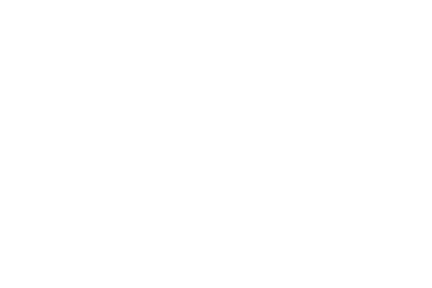

<IPython.core.display.Javascript object>


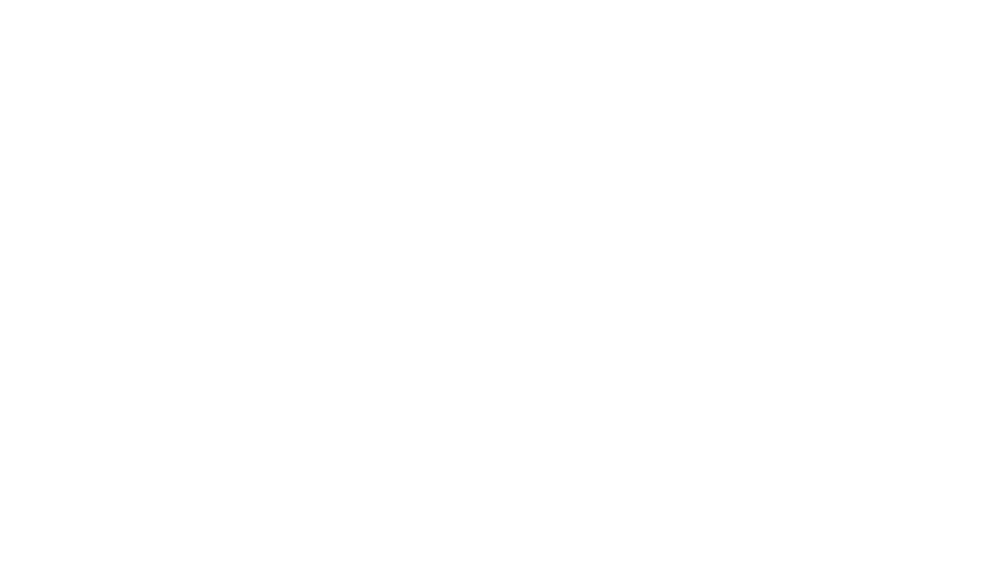

<IPython.core.display.Javascript object>


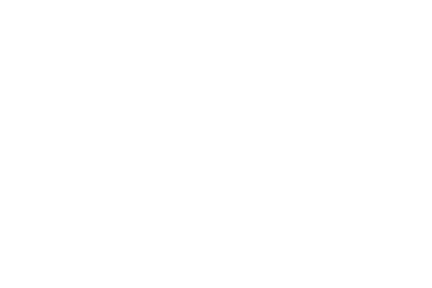

<IPython.core.display.Javascript object>


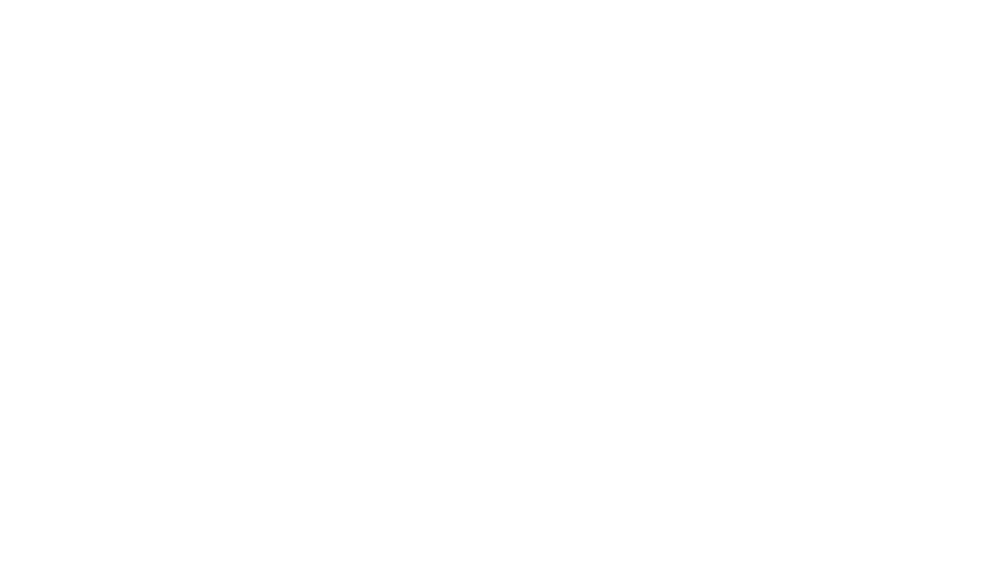

<IPython.core.display.Javascript object>


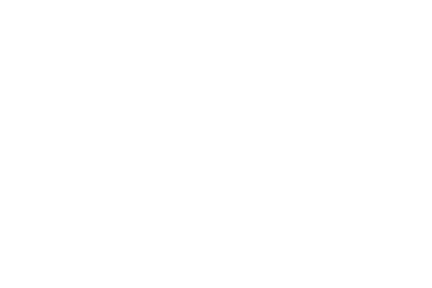

<IPython.core.display.Javascript object>


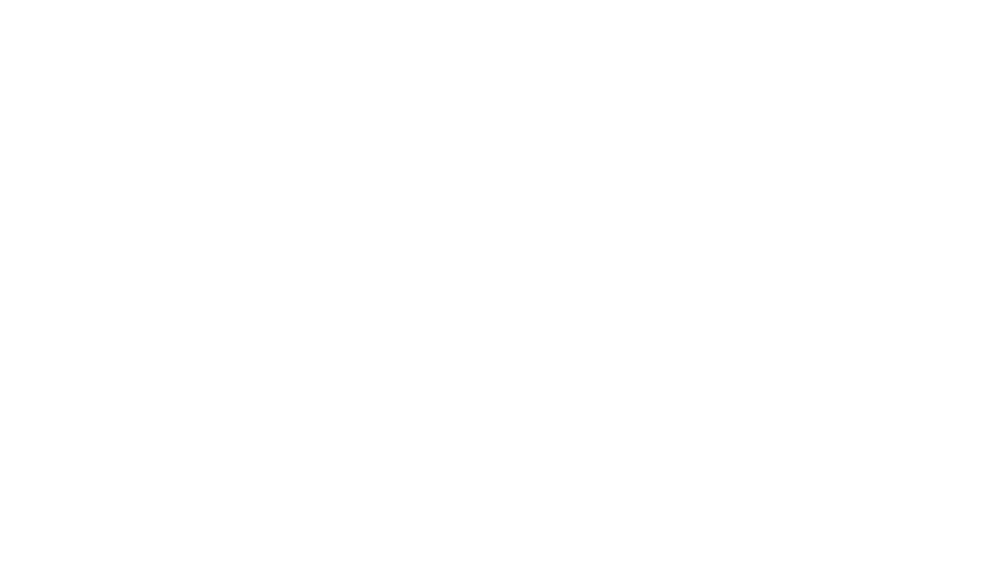

<IPython.core.display.Javascript object>


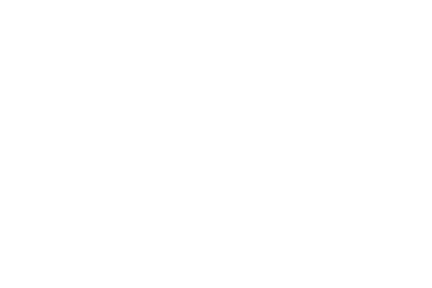

<IPython.core.display.Javascript object>


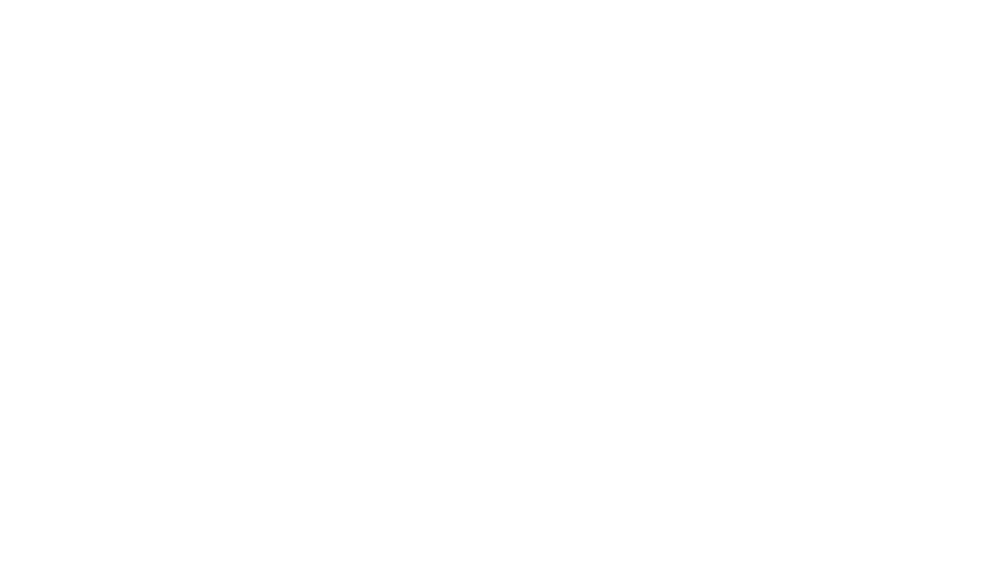

<IPython.core.display.Javascript object>


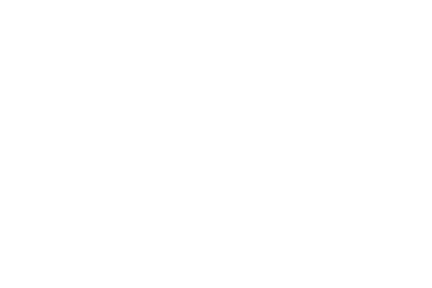

<IPython.core.display.Javascript object>


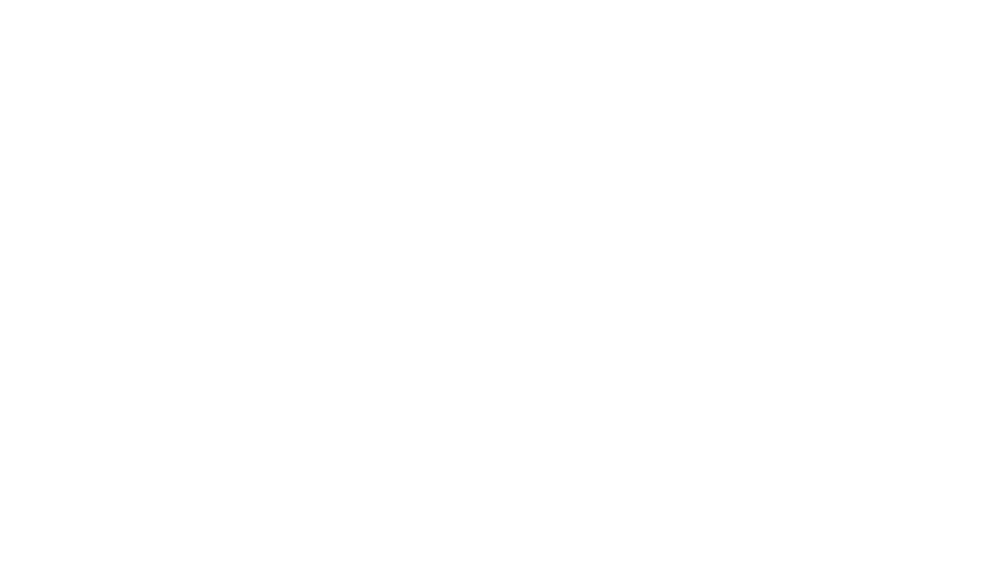

<IPython.core.display.Javascript object>


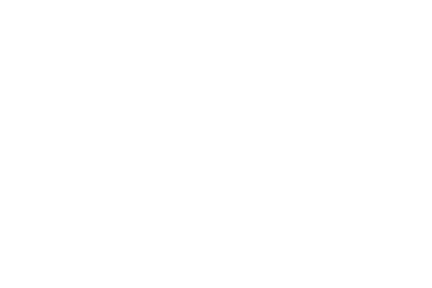

<IPython.core.display.Javascript object>


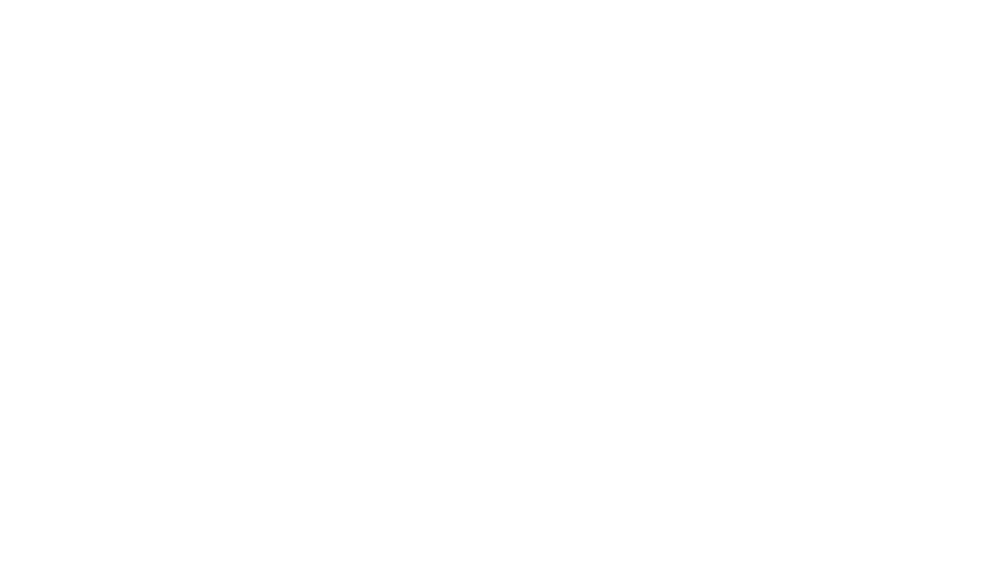

<IPython.core.display.Javascript object>


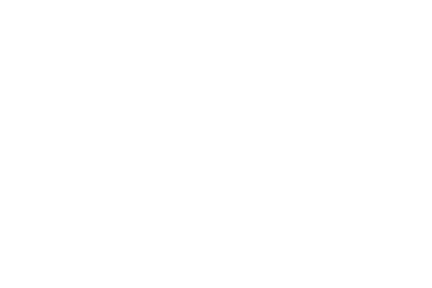

<IPython.core.display.Javascript object>


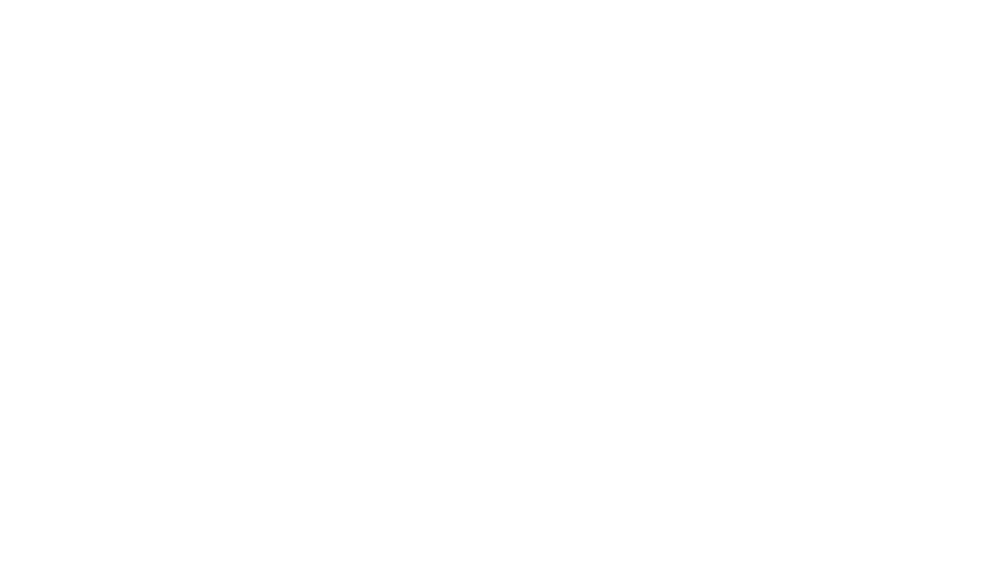

<IPython.core.display.Javascript object>


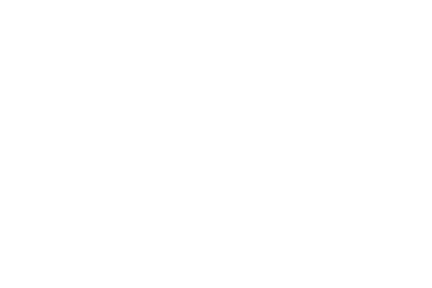

<IPython.core.display.Javascript object>


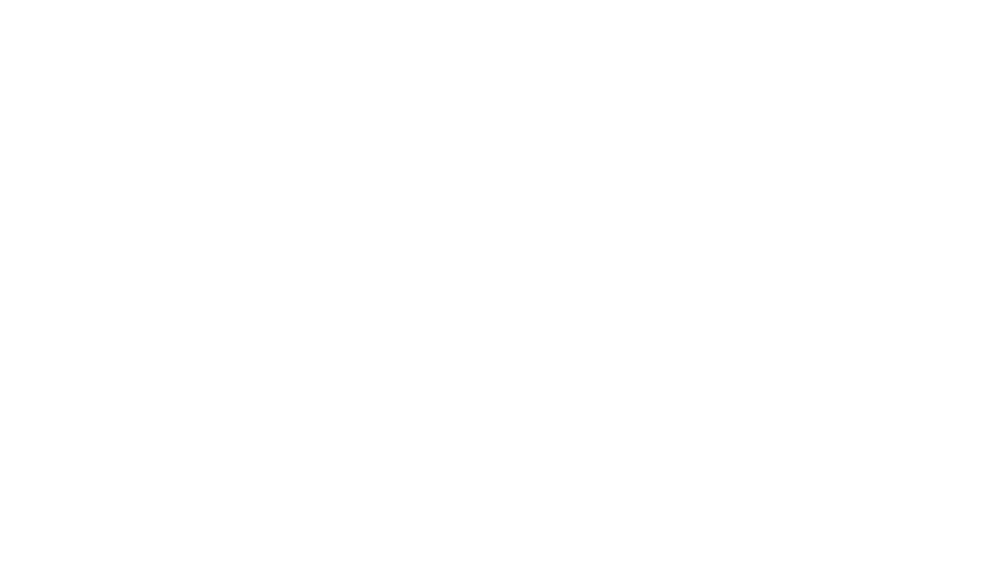

<IPython.core.display.Javascript object>


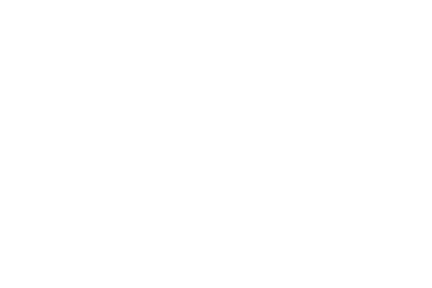

<IPython.core.display.Javascript object>


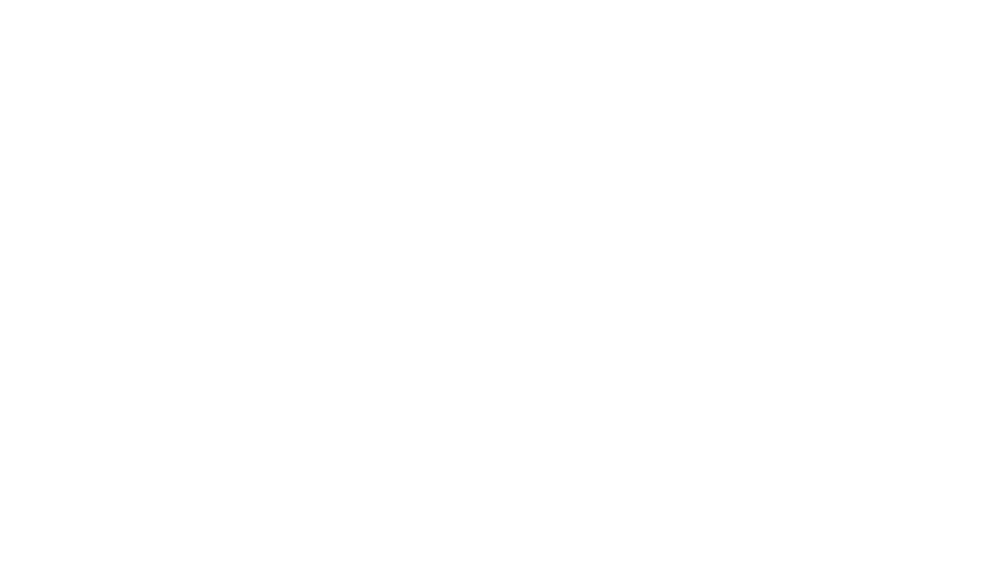

<IPython.core.display.Javascript object>


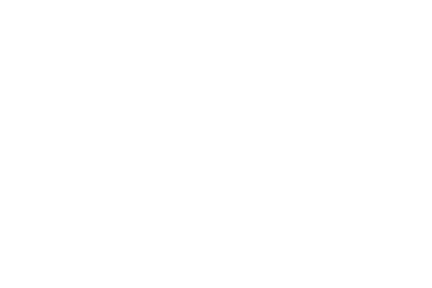

<IPython.core.display.Javascript object>


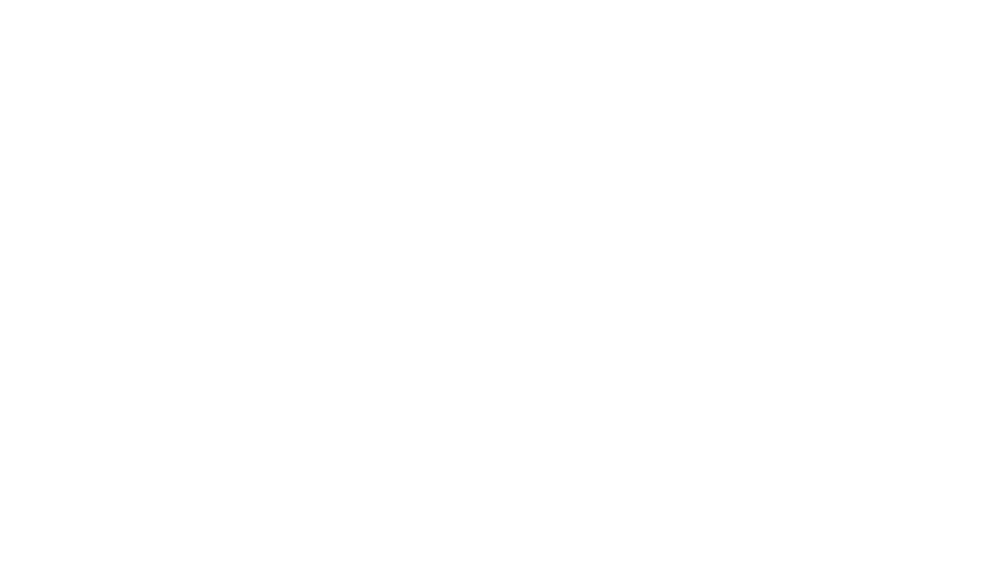

<IPython.core.display.Javascript object>


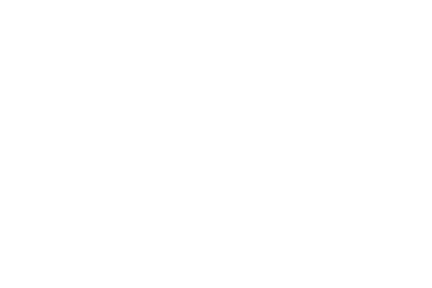

<IPython.core.display.Javascript object>


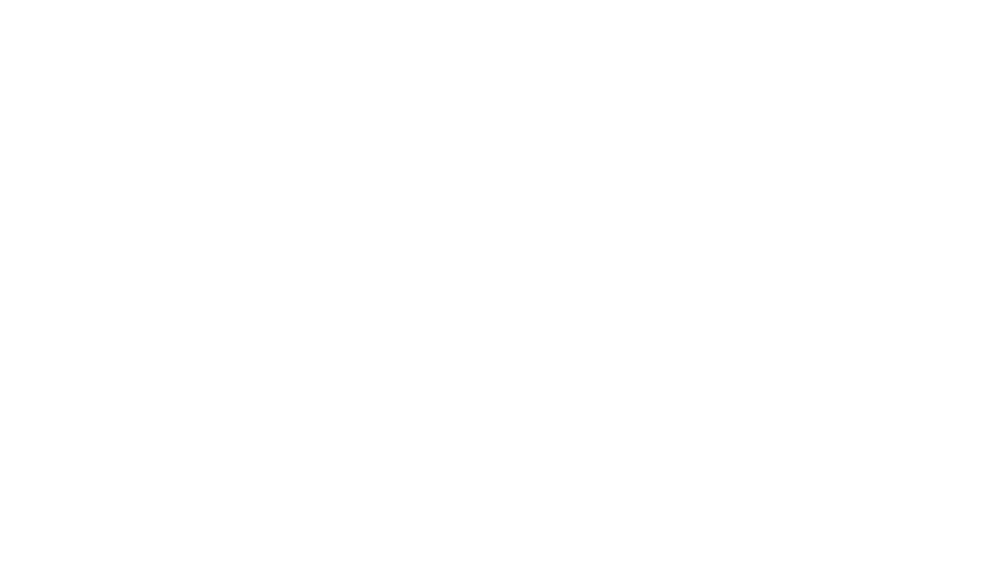

Creating the symbolic link of the video
AUTOMATIC ADDING OF VIDEO TO CONFIG FILE FAILED! You need to do this manually for including it in the config.yaml file!
Videopath: C:/Users/jamesjun/Desktop/Simone/DeepLabCut-master/examples/videos/testVideos/20190717173554627-masked.avi Coordinates for cropping: None
The outlier frames are extracted. They are stored in the subdirectory labeled-data\20190717173554627-masked.
Once you extracted frames for all videos, use 'refine_labels' to manually correct the labels.


In [16]:
deeplabcut.extract_outlier_frames(path_config_file,[r'C:/Users/jamesjun/Desktop/Simone/DeepLabCut-master/examples/videos/testVideos/20190717173554627-masked.avi']) #pass a specific video

## Refine Labels [optional step]
Following the extraction of outlier frames, the user can use the following function to move the predicted labels to the correct location. Thus augmenting the training dataset. 

In [ ]:
%gui wx
deeplabcut.refine_labels(path_config_file)

**NOTE:** Afterwards, if you want to look at the adjusted frames, you can load them in the main GUI by running: ``deeplabcut.label_frames(path_config_file)``

(you can add a new "cell" below to add this code!)

#### Once all folders are relabeled, check the labels again! If you are not happy, adjust them in the main GUI:

``deeplabcut.label_frames(path_config_file)``

Check Labels:

``deeplabcut.check_labels(path_config_file)``

In [ ]:
#NOW, merge this with your original data:

deeplabcut.merge_datasets(path_config_file)

## Create a new iteration of training dataset [optional step]
Following the refinement of labels and appending them to the original dataset, this creates a new iteration of training dataset. This is automatically set in the config.yaml file, so let's get training!

In [ ]:
deeplabcut.create_training_dataset(path_config_file)

## Create labeled video
This funtion is for visualiztion purpose and can be used to create a video in .mp4 format with labels predicted by the network. This video is saved in the same directory where the original video resides. 

THIS HAS MANY FUN OPTIONS! 

``deeplabcut.create_labeled_video(config, videos, videotype='avi', shuffle=1, trainingsetindex=0, filtered=False, save_frames=False, Frames2plot=None, delete=False, displayedbodyparts='all', codec='mp4v', outputframerate=None, destfolder=None, draw_skeleton=False, trailpoints=0, displaycropped=False)``

So please check:

In [ ]:
deeplabcut.create_labeled_video?

In [13]:
deeplabcut.create_labeled_video(path_config_file,videofile_path)

Starting %  C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\examples\videos\testVideos ['C:/Users/jamesjun/Desktop/Simone/DeepLabCut-master/examples/videos/testVideos/20190717173554627-masked.avi']
Loading  C:/Users/jamesjun/Desktop/Simone/DeepLabCut-master/examples/videos/testVideos/20190717173554627-masked.avi and data.
False 0 1920 0 1080
778
Duration of video [s]:  25.93 , recorded with  30.0 fps!
Overall # of frames:  778 with cropped frame dimensions:  1920 1080
Generating frames and creating video.


100%|████████████████████████████████████████| 778/778 [00:13<00:00, 57.63it/s]


## Plot the trajectories of the analyzed videos
This function plots the trajectories of all the body parts across the entire video. Each body part is identified by a unique color.

C:/Users/jamesjun/Desktop/Simone/DeepLabCut-master/examples/videos/testVideos/20190717173554627-masked.avi
Starting %  C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\examples\videos\testVideos ['C:/Users/jamesjun/Desktop/Simone/DeepLabCut-master/examples/videos/testVideos/20190717173554627-masked.avi']
C:\Users\jamesjun\Desktop\Simone\DeepLabCut-master\examples\videos\testVideos  already exists!
Loading  C:/Users/jamesjun/Desktop/Simone/DeepLabCut-master/examples/videos/testVideos/20190717173554627-masked.avi and data.


<IPython.core.display.Javascript object>


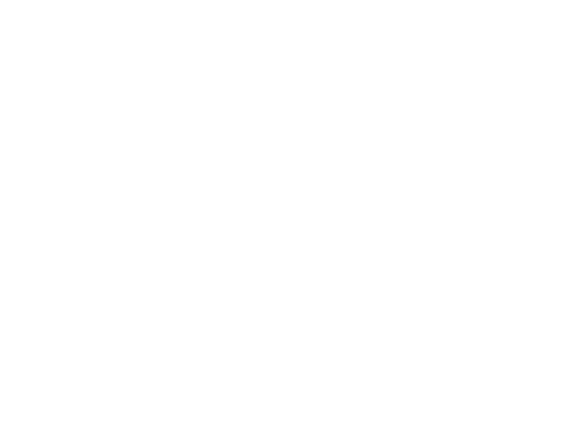

<IPython.core.display.Javascript object>


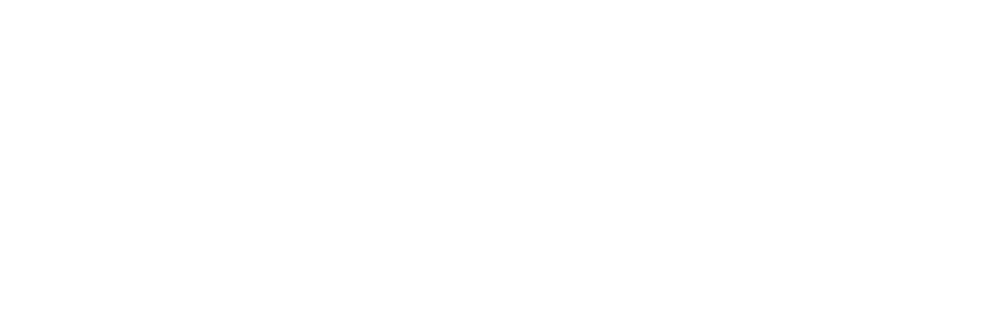

<IPython.core.display.Javascript object>


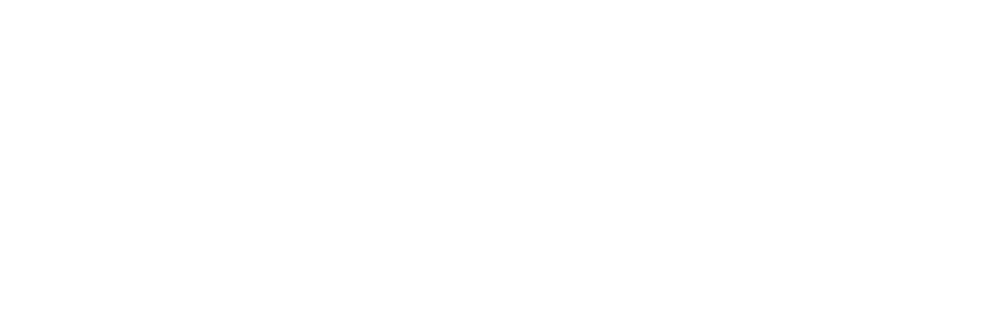

<IPython.core.display.Javascript object>


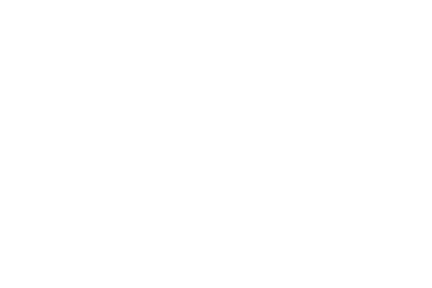

Plots created! Please check the directory "plot-poses" within the video directory


In [14]:
%matplotlib notebook 
# for making interactive plots.
deeplabcut.plot_trajectories(path_config_file,videofile_path)